# 6. XGBoost算法

XGBoost是陈天奇等人开发的一个开源机器学习项目，**高效地实现了GBDT算法并进行了算法和工程上的许多改进**，被广泛应用在Kaggle竞赛及其他许多机器学习竞赛中并取得了不错的成绩。

XGBoost本质上还是一个GBDT，但是力争把速度和效率发挥到极致，所以叫X (Extreme) GBoosted，包括前面说过，两者都是boosting方法。XGBoost是一个优化的**分布式梯度增强库，旨在实现高效，灵活和便携**。 它在Gradient Boosting框架下实现机器学习算法。 XGBoost提供了并行树提升（也称为GBDT，GBM），可以快速准确地解决许多数据科学问题。 

相同的代码在主要的分布式环境（Hadoop，SGE，MPI）上运行，并且可以解决超过数十亿个样例的问题。XGBoost利用了核外计算并且能够使数据科学家在一个主机上处理数亿的样本数据。最终，将这些技术进行结合来做一个端到端的系统以最少的集群系统来扩展到更大的数据集上。**Xgboost以CART决策树为子模型，通过Gradient Tree Boosting实现多棵CART树的集成学习，得到最终模型**。下面我们来看看XGBoost的最终模型构建：                                    
引用陈天奇的论文，我们的数据为：

$\mathcal{D}=\left\{\left(\mathbf{x}_{i}, y_{i}\right)\right\}\left(|\mathcal{D}|=n, \mathbf{x}_{i} \in \mathbb{R}^{m}, y_{i} \in \mathbb{R}\right)$                                        
(1) 构造目标函数：                                 
假设有K棵树，则第i个样本的输出为$\hat{y}_{i}=\phi\left(\mathrm{x}_{i}\right)=\sum_{k=1}^{K} f_{k}\left(\mathrm{x}_{i}\right), \quad f_{k} \in \mathcal{F}$，其中，$\mathcal{F}=\left\{f(\mathbf{x})=w_{q(\mathbf{x})}\right\}\left(q: \mathbb{R}^{m} \rightarrow T, w \in \mathbb{R}^{T}\right)$                           
因此，目标函数的构建为：                                
$$
\mathcal{L}(\phi)=\sum_{i} l\left(\hat{y}_{i}, y_{i}\right)+\sum_{k} \Omega\left(f_{k}\right)
$$                               
其中，$\sum_{i} l\left(\hat{y}_{i}, y_{i}\right)$为loss function，$\sum_{k} \Omega\left(f_{k}\right)$为正则化项。                   
(2) 叠加式的训练(Additive Training)：                                      
给定样本$x_i$，$\hat{y}_i^{(0)} = 0$(初始预测)，$\hat{y}_i^{(1)} = \hat{y}_i^{(0)} + f_1(x_i)$，$\hat{y}_i^{(2)} = \hat{y}_i^{(0)} + f_1(x_i) + f_2(x_i) = \hat{y}_i^{(1)} + f_2(x_i)$.......以此类推，可以得到：$ \hat{y}_i^{(K)} = \hat{y}_i^{(K-1)} + f_K(x_i)$  ，其中，$ \hat{y}_i^{(K-1)} $ 为前K-1棵树的预测结果，$ f_K(x_i)$ 为第K棵树的预测结果。                                 
因此，目标函数可以分解为：                                        
$$
\mathcal{L}^{(K)}=\sum_{i=1}^{n} l\left(y_{i}, \hat{y}_{i}^{(K-1)}+f_{K}\left(\mathrm{x}_{i}\right)\right)+\sum_{k} \Omega\left(f_{k}\right)
$$
由于正则化项也可以分解为前K-1棵树的复杂度加第K棵树的复杂度，因此：$\mathcal{L}^{(K)}=\sum_{i=1}^{n} l\left(y_{i}, \hat{y}_{i}^{(K-1)}+f_{K}\left(\mathrm{x}_{i}\right)\right)+\sum_{k=1} ^{K-1}\Omega\left(f_{k}\right)+\Omega\left(f_{K}\right)$，由于$\sum_{k=1} ^{K-1}\Omega\left(f_{k}\right)$在模型构建到第K棵树的时候已经固定，无法改变，因此是一个已知的常数，可以在最优化的时候省去，故：                     
$$
\mathcal{L}^{(K)}=\sum_{i=1}^{n} l\left(y_{i}, \hat{y}_{i}^{(K-1)}+f_{K}\left(\mathrm{x}_{i}\right)\right)+\Omega\left(f_{K}\right)
$$                                           
(3) 使用泰勒级数**近似**目标函数：                                      
$$
\mathcal{L}^{(K)} \simeq \sum_{i=1}^{n}\left[l\left(y_{i}, \hat{y}^{(K-1)}\right)+g_{i} f_{K}\left(\mathrm{x}_{i}\right)+\frac{1}{2} h_{i} f_{K}^{2}\left(\mathrm{x}_{i}\right)\right]+\Omega\left(f_{K}\right)
$$                                      
其中，$g_{i}=\partial_{\hat{y}(t-1)} l\left(y_{i}, \hat{y}^{(t-1)}\right)$和$h_{i}=\partial_{\hat{y}^{(t-1)}}^{2} l\left(y_{i}, \hat{y}^{(t-1)}\right)$                                                         
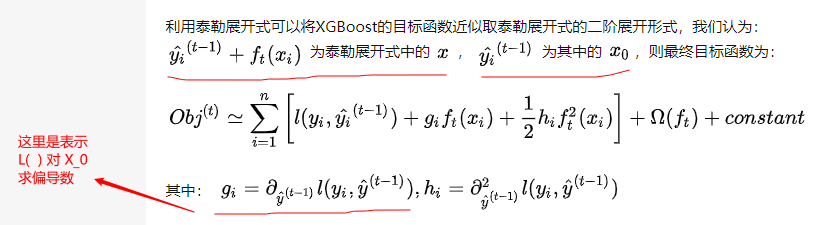

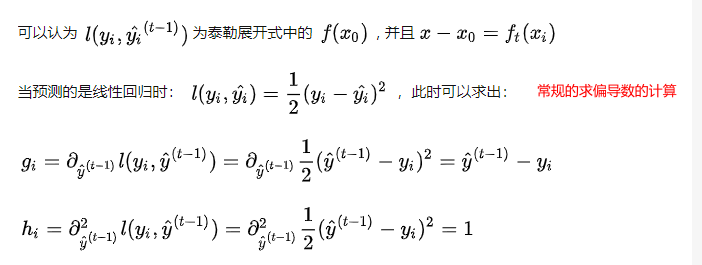

**注：这里求偏导数的表示形式，之前好像没接触过，是自己不太熟吧。。**

在这里，我们补充下泰勒级数的相关知识：                                 
在数学中，泰勒级数（英语：Taylor series）用无限项连加式——级数来表示一个函数，这些相加的项由函数在某一点的导数求得。具体的形式如下：                          
$$
f(x)=\frac{f\left(x_{0}\right)}{0 !}+\frac{f^{\prime}\left(x_{0}\right)}{1 !}\left(x-x_{0}\right)+\frac{f^{\prime \prime}\left(x_{0}\right)}{2 !}\left(x-x_{0}\right)^{2}+\ldots+\frac{f^{(n)}\left(x_{0}\right)}{n !}\left(x-x_{0}\right)^{n}+......
$$                                         
由于$\sum_{i=1}^{n}l\left(y_{i}, \hat{y}^{(K-1)}\right)$在模型构建到第K棵树的时候已经固定，无法改变，因此是一个已知的常数，可以在最优化的时候省去，故：                               
$$
\tilde{\mathcal{L}}^{(K)}=\sum_{i=1}^{n}\left[g_{i} f_{K}\left(\mathbf{x}_{i}\right)+\frac{1}{2} h_{i} f_{K}^{2}\left(\mathbf{x}_{i}\right)\right]+\Omega\left(f_{K}\right)
$$                                    
(4) 如何定义一棵树：                                           
为了说明如何定义一棵树的问题，我们需要定义几个概念：第一个概念是样本所在的节点位置$q(x)$，第二个概念是有哪些样本落在节点j上$I_{j}=\left\{i \mid q\left(\mathbf{x}_{i}\right)=j\right\}$，第三个概念是每个结点的预测值$w_{q(x)}$，第四个概念是模型复杂度$\Omega\left(f_{K}\right)$，它可以由叶子节点的个数以及节点函数值来构建，则：$\Omega\left(f_{K}\right) = \gamma T+\frac{1}{2} \lambda \sum_{j=1}^{T} w_{j}^{2}$。如下图的例子：   

**注：其中T为叶子数量， W_j为每个叶子取值,可以看出XGBoost的正则化和一般的 L2 正则化不一样的地方就是引入了叶子的数量做正则，也就是通常说的树的复杂度。**

![jupyter](./image/16.png)                                        
$q(x_1) = 1,q(x_2) = 3,q(x_3) = 1,q(x_4) = 2,q(x_5) = 3$，$I_1 = \{1,3\},I_2 = \{4\},I_3 = \{2,5\}$，$w = (15,12,20)$  

**注：上文中有提到过：𝑓𝐾(𝑥𝑖)  为第K棵树的预测结果。在这里就是 w_j**


因此，目标函数用以上符号替代后：                                      
$$
\begin{aligned}
\tilde{\mathcal{L}}^{(K)} &=\sum_{i=1}^{n}\left[g_{i} f_{K}\left(\mathrm{x}_{i}\right)+\frac{1}{2} h_{i} f_{K}^{2}\left(\mathrm{x}_{i}\right)\right]+\gamma T+\frac{1}{2} \lambda \sum_{j=1}^{T} w_{j}^{2} \\
&=\sum_{j=1}^{T}\left[\left(\sum_{i \in I_{j}} g_{i}\right) w_{j}+\frac{1}{2}\left(\sum_{i \in I_{j}} h_{i}+\lambda\right) w_{j}^{2}\right]+\gamma T
\end{aligned}
$$                               
由于我们的目标就是最小化目标函数，现在的目标函数化简为一个关于w的二次函数：$\tilde{\mathcal{L}}^{(K)}=\sum_{j=1}^{T}\left[\left(\sum_{i \in I_{j}} g_{i}\right) w_{j}+\frac{1}{2}\left(\sum_{i \in I_{j}} h_{i}+\lambda\right) w_{j}^{2}\right]+\gamma T$，根据二次函数求极值的公式：$y=ax^2 +  bx + c$求极值，对称轴在$x=-\frac{b}{2 a}$，极值为$y=\frac{4 a c-b^{2}}{4 a}$，因此：                                       
$$
w_{j}^{*}=-\frac{\sum_{i \in I_{j}} g_{i}}{\sum_{i \in I_{j}} h_{i}+\lambda}
$$                                              
以及
$$
\tilde{\mathcal{L}}^{(K)}(q)=-\frac{1}{2} \sum_{j=1}^{T} \frac{\left(\sum_{i \in I_{j}} g_{i}\right)^{2}}{\sum_{i \in I_{j}} h_{i}+\lambda}+\gamma T
$$    

**注：这是 w_j 取值后的最小值。**

(5) 如何寻找树的形状：                           
不难发现，刚刚的讨论都是基于树的形状已经确定了计算$w$和$L$，但是实际上我们需要像学习决策树一样找到树的形状。因此，我们借助决策树学习的方式，使用目标函数的变化来作为分裂节点的标准。我们使用一个例子来说明：                               
![jupyter](./image/17.png)                                    
例子中有8个样本，分裂方式如下，因此:                                    
$$
\tilde{\mathcal{L}}^{(old)} = -\frac{1}{2}[\frac{(g_7 + g_8)^2}{H_7+H_8 + \lambda} + \frac{(g_1 +...+ g_6)^2}{H_1+...+H_6 + \lambda}] + 2\gamma \\
\tilde{\mathcal{L}}^{(new)} = -\frac{1}{2}[\frac{(g_7 + g_8)^2}{H_7+H_8 + \lambda} + \frac{(g_1 +...+ g_3)^2}{H_1+...+H_3 + \lambda} + \frac{(g_4 +...+ g_6)^2}{H_4+...+H_6 + \lambda}] + 3\gamma\\
\tilde{\mathcal{L}}^{(old)} - \tilde{\mathcal{L}}^{(new)} = \frac{1}{2}[ \frac{(g_1 +...+ g_3)^2}{H_1+...+H_3 + \lambda} + \frac{(g_4 +...+ g_6)^2}{H_4+...+H_6 + \lambda} - \frac{(g_1+...+g_6)^2}{h_1+...+h_6+\lambda}] - \gamma
$$                                 
因此，从上面的例子看出：分割节点的标准为$max\{\tilde{\mathcal{L}}^{(old)} - \tilde{\mathcal{L}}^{(new)} \}$，即：                               
$$
\mathcal{L}_{\text {split }}=\frac{1}{2}\left[\frac{\left(\sum_{i \in I_{L}} g_{i}\right)^{2}}{\sum_{i \in I_{L}} h_{i}+\lambda}+\frac{\left(\sum_{i \in I_{R}} g_{i}\right)^{2}}{\sum_{i \in I_{R}} h_{i}+\lambda}-\frac{\left(\sum_{i \in I} g_{i}\right)^{2}}{\sum_{i \in I} h_{i}+\lambda}\right]-\gamma
$$      

**注：想要最小化损失函数，分裂后新的损失函数 比 原来的损失函数 少得越多，分裂效果越好。
有趣的是，损失函数原本就是 -1/2，所以相减后Gain变成正的了。**

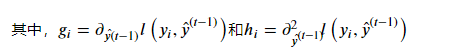
**注：然后，不要被这么多推导绕晕了。这里的 g_i , h_i 是 （第i个样本 y_i 的值 和 前面 K-1棵树预测值的损失值，对 前面 K-1棵树预测值）的一阶导数 和 二阶导数。**
**所以，再次回到下面这张图！这样应该更容易理解，为什么要对 “前面 K-1棵树预测值”去求导。如果 前面 K-1棵树预测值 与 真实值 相差得越大，
那么 g_i 这个导数就会越大。越会导致算法在这里进行分裂。是这样吗？。。**
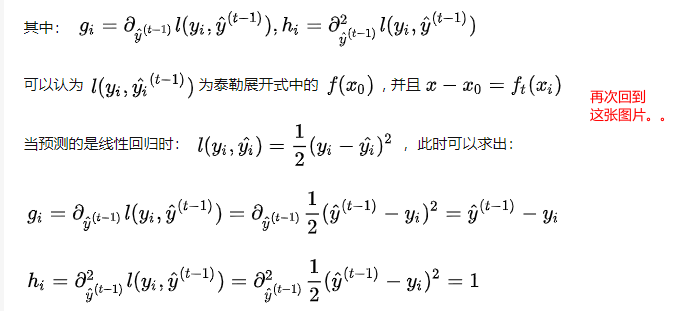
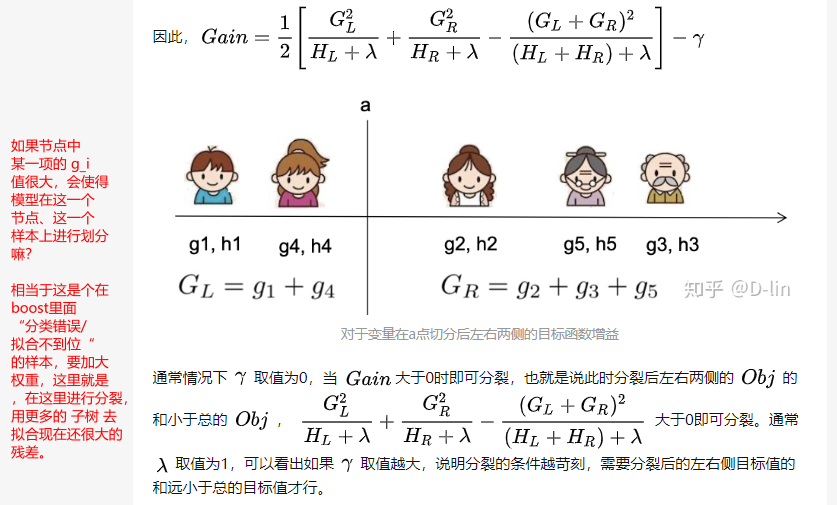

(6.1) 精确贪心分裂算法：                           
XGBoost在生成新树的过程中，最基本的操作是节点分裂。**节点分裂中最重 要的环节是找到最优特征及最优切分点, 然后将叶子节点按照最优特征和最优切 分点进行分裂**。选取最优特征和最优切分点的一种思路如下：首先找到所有的候 选特征及所有的候选切分点, 一一**求得其 $\mathcal{L}_{\text {split }}$, 然后选择$\mathcal{L}_{\mathrm{split}}$ 最大的特征及 对应切分点作为最优特征和最优切分点**。我们称此种方法为精确贪心算法。该算法是一种启发式算法, 因为在节点分裂时只选择当前最优的分裂策略, 而非全局最优的分裂策略。精确贪心算法的计算过程如下所示：                                    

![jupyter](./image/18.png)  


**注：这里左子节点是一个空节点，右子节点是父节点减去 左子节点剩下的部分。**

**注:然后，要记录下取最大gain时候的特征，以及该特征的取值。**

**注：重要！ XGBoost 的并行，由上图可以看出，其实是特征维度上的并行。  即 每一个特征选取 自身 的最佳分裂点， 这一步是可以并行去计算的。
A特征选取自己的 最佳分裂特征值点的时候，并不会影响 B 特征选取自己的最佳分裂特征值点。  自己思考一下，是这样吗？**


**(6.2) 基于直方图的近似算法：**  

**精确贪心算法在选择最优特征和最优切分点时是一种十分有效的方法。它计算了所有特征、所有切分点的收益, 并从中选择了最优的, 从而保证模型能比较好地拟合了训练数据**。

但是**当数据不能完全加载到内存时，精确贪心算法会变得 非常低效**，算法在计算过程中需要不断在内存与磁盘之间进行数据交换，这是个非常耗时的过程, 并且在分布式环境中面临同样的问题。**注：IO问题**

为了能够更高效地选 择最优特征及切分点, XGBoost提出一种近似算法来解决该问题。 

**基于直方图的近似算法的主要思想是：对某一特征寻找最优切分点时，首先对该特征的所有切分点按分位数 (如百分位) 分桶, 得到一个候选切分点集。特征的每一个切分点都可以分到对应的分桶;**

**然后，对每个桶计算特征统计G和H得到直方图**, G为该桶内所有样本一阶特征统计g之和, H为该桶内所有样本二阶特征统计h之和; 

**最后，选择所有候选特征及候选切分点中对应桶的特征统计收益最大的作为最优特征及最优切分点**。基于直方图的近似算法的计算过程如下所示：                                   
1) 对于每个特征 $k=1,2, \cdots, m,$ 按分位数对特征 $k$ 分桶 $\Theta,$ 可得候选切分点, $S_{k}=\left\{S_{k 1}, S_{k 2}, \cdots, S_{k l}\right\}^{1}$


2) 对于每个特征 $k=1,2, \cdots, m,$ 有：  

$$
\begin{array}{l}
G_{k v} \leftarrow=\sum_{j \in\left\{j \mid s_{k, v}  \geq  \mathbf{x}_{j k}>s_{k, v-1\;}\right\}} g_{j} \\
H_{k v} \leftarrow=\sum_{j \in\left\{j \mid s_{k, v}  \geq  \mathbf{x}_{j k}>s_{k, v-1\;}\right\}} h_{j}
\end{array}
$$                                    
3) 类似精确贪心算法，依据梯度统计找到最大增益的候选切分点。                                         
下面用一个例子说明基于直方图的近似算法：                                      
假设有一个年龄特征，其特征的取值为18、19、21、31、36、37、55、57，我们需要使用近似算法找到年龄这个特征的最佳分裂点：                               
![jupyter](./image/19.png)                              

近似算法实现了两种候选切分点的构建策略：全局策略和本地策略。

全局策略是在树构建的初始阶段对每一个特征确定一个候选切分点的集合, 并在该树每一层的节点分裂中均采用此集合计算收益, 整个过程候选切分点集合不改变。

本地策略则是在每一次节点分裂时均重新确定候选切分点。全局策略需要更细的分桶才能达到本地策略的精确度, 但全局策略在选取候选切分点集合时比本地策略更简单。

**在XGBoost系统中, 用户可以根据需求自由选择使用精确贪心算法、近似算法全局策略、近似算法本地策略, 算法均可通过参数进行配置。**                                   

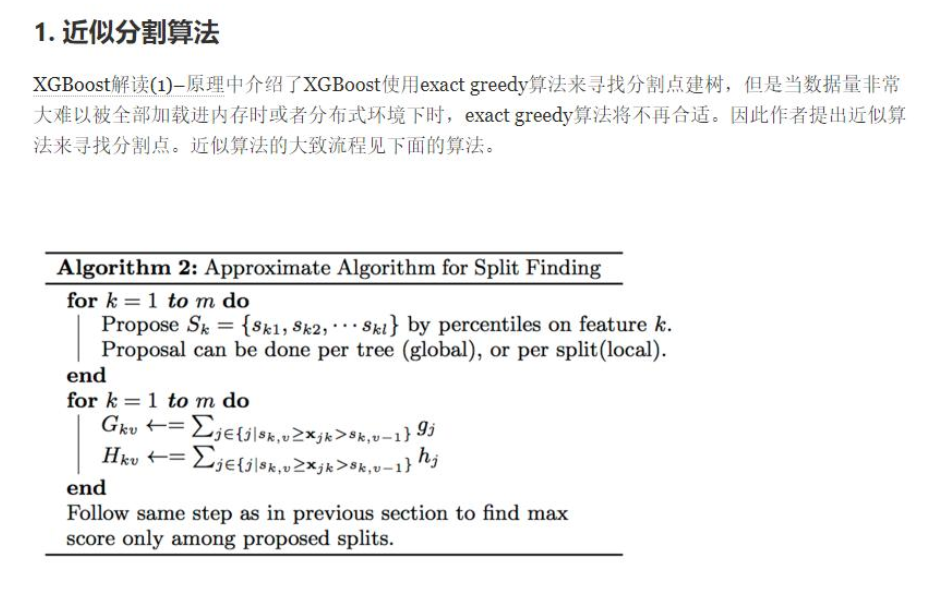

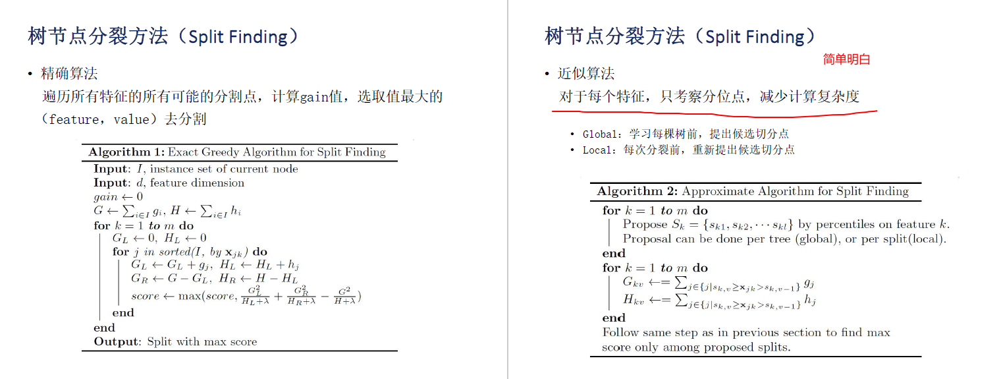

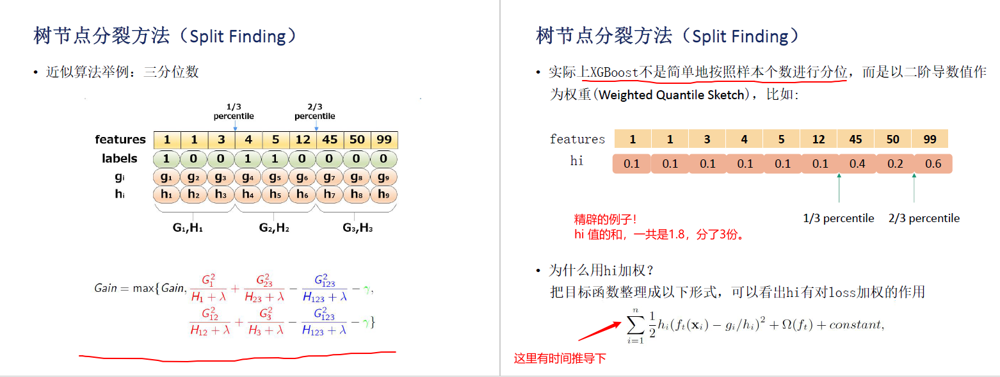

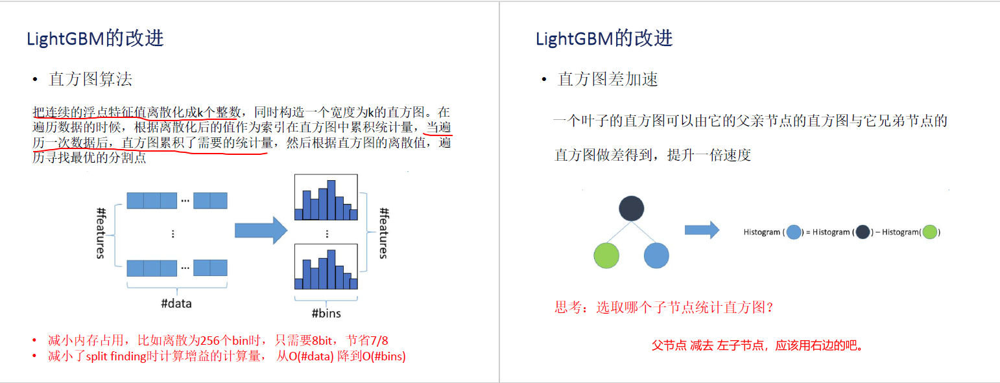

冰山一角，详情请参见 wepon 的文档！

参考阅读（推荐）**看了下面这两篇，理解可以更透彻一点。**

Lightgbm 直方图优化算法深入理解
https://blog.csdn.net/anshuai_aw1/article/details/83040541

最详细的XGBoost推导过程--关于XGBoost我所知道的一切
https://zhuanlan.zhihu.com/p/143936295

LightGBM算法总结
https://blog.csdn.net/weixin_39807102/article/details/81912566?utm_medium=distribute.pc_relevant.none-task-blog-2%7Edefault%7EBlogCommendFromMachineLearnPai2%7Edefault-1.control&dist_request_id=&depth_1-utm_source=distribute.pc_relevant.none-task-blog-2%7Edefault%7EBlogCommendFromMachineLearnPai2%7Edefault-1.control

##  XGBoost 实践部分，有时间再整一整吧！

In [1]:
# XGBoost原生工具库的上手：
import xgboost as xgb  # 引入工具库
# read in data
dtrain = xgb.DMatrix(r'D:\workspace\xgboost\demo\data\agaricus.txt.train')   # XGBoost的专属数据格式，但是也可以用dataframe或者ndarray
dtest = xgb.DMatrix(r'D:\workspace\xgboost\demo\data\agaricus.txt.test')  # # XGBoost的专属数据格式，但是也可以用dataframe或者ndarray
# specify parameters via map
param = {'max_depth':2, 'eta':1, 'objective':'binary:logistic' }    # 设置XGB的参数，使用字典形式传入
num_round = 2     # 使用线程数
bst = xgb.train(param, dtrain, num_round)   # 训练
# make prediction
preds = bst.predict(dtest)   # 预测

[17:23:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [2]:
preds

array([0.28583017, 0.9239239 , 0.28583017, ..., 0.9239239 , 0.05169873,
       0.9239239 ], dtype=float32)

XGBoost的参数设置(括号内的名称为sklearn接口对应的参数名字):                                     
推荐博客：https://link.zhihu.com/?target=https%3A//blog.csdn.net/luanpeng825485697/article/details/79907149                                             
推荐官方文档：https://link.zhihu.com/?target=https%3A//xgboost.readthedocs.io/en/latest/parameter.html                                                            

**XGBoost的参数分为三种：**
   - 通用参数：（两种类型的booster，因为tree的性能比线性回归好得多，因此我们很少用线性回归。）
      - booster:使用哪个弱学习器训练，默认gbtree，可选gbtree，gblinear 或dart
      - nthread：用于运行XGBoost的并行线程数，默认为最大可用线程数
      - verbosity：打印消息的详细程度。有效值为0（静默），1（警告），2（信息），3（调试）。
      - **Tree Booster的参数：**
         - eta（learning_rate）：learning_rate，在更新中使用步长收缩以防止过度拟合，默认= 0.3，范围：[0,1]；典型值一般设置为：0.01-0.2
         - gamma（min_split_loss）：默认= 0，分裂节点时，损失函数减小值只有大于等于gamma节点才分裂，gamma值越大，算法越保守，越不容易过拟合，但性能就不一定能保证，需要平衡。范围：[0，∞]
         - max_depth：默认= 6，一棵树的最大深度。增加此值将使模型更复杂，并且更可能过度拟合。范围：[0，∞]
         - min_child_weight：默认值= 1，如果新分裂的节点的样本权重和小于min_child_weight则停止分裂 。这个可以用来减少过拟合，但是也不能太高，会导致欠拟合。范围：[0，∞]
         - max_delta_step：默认= 0，允许每个叶子输出的最大增量步长。如果将该值设置为0，则表示没有约束。如果将其设置为正值，则可以帮助使更新步骤更加保守。通常不需要此参数，但是当类极度不平衡时，它可能有助于逻辑回归。将其设置为1-10的值可能有助于控制更新。范围：[0，∞]
         - subsample：默认值= 1，构建每棵树对样本的采样率，如果设置成0.5，XGBoost会随机选择一半的样本作为训练集。范围：（0,1]
         - sampling_method：默认= uniform，用于对训练实例进行采样的方法。
            + uniform：每个训练实例的选择概率均等。通常将subsample> = 0.5 设置 为良好的效果。
            + gradient_based：每个训练实例的选择概率与规则化的梯度绝对值成正比，具体来说就是$\sqrt{g^2+\lambda h^2}$，subsample可以设置为低至0.1，而不会损失模型精度。
         - colsample_bytree：默认= 1，列采样率，也就是特征采样率。范围为（0，1]
         - lambda（reg_lambda）：默认=1，L2正则化权重项。增加此值将使模型更加保守。
         - alpha（reg_alpha）：默认= 0，权重的L1正则化项。增加此值将使模型更加保守。
         - **tree_method：默认=auto，XGBoost中使用的树构建算法。**
            - auto：使用启发式选择最快的方法。
               - 对于小型数据集，exact将使用精确贪婪（）。
               - 对于较大的数据集，approx将选择近似算法（）。它建议尝试hist，gpu_hist，用大量的数据可能更高的性能。（gpu_hist）支持。external memory外部存储器。
            - exact：精确的贪婪算法。枚举所有拆分的候选点。
            - approx：使用分位数和梯度直方图的近似贪婪算法。
            - hist：更快的直方图优化的近似贪婪算法。（LightGBM也是使用直方图算法）
            - gpu_hist：GPU hist算法的实现。
         - scale_pos_weight:控制正负权重的平衡，这对于不平衡的类别很有用。Kaggle竞赛一般设置sum(negative instances) / sum(positive instances)，在类别高度不平衡的情况下，将参数设置大于0，可以加快收敛。
         - num_parallel_tree：默认=1，每次迭代期间构造的并行树的数量。此选项用于支持增强型随机森林。
         - monotone_constraints：可变单调性的约束，在某些情况下，如果有非常强烈的先验信念认为真实的关系具有一定的质量，则可以使用约束条件来提高模型的预测性能。（例如params_constrained\['monotone_constraints'\] = "(1,-1)"，(1,-1)我们告诉XGBoost对第一个预测变量施加增加的约束，对第二个预测变量施加减小的约束。）
      - **Linear Booster的参数：**
         - lambda（reg_lambda）：默认= 0，L2正则化权重项。增加此值将使模型更加保守。归一化为训练示例数。
         - alpha（reg_alpha）：默认= 0，权重的L1正则化项。增加此值将使模型更加保守。归一化为训练示例数。
         - updater：默认= shotgun。
            - shotgun：基于shotgun算法的平行坐标下降算法。使用“ hogwild”并行性，因此每次运行都产生不确定的解决方案。
            - coord_descent：普通坐标下降算法。同样是多线程的，但仍会产生确定性的解决方案。
         - feature_selector：默认= cyclic。特征选择和排序方法
            - cyclic：通过每次循环一个特征来实现的。
            - shuffle：类似于cyclic，但是在每次更新之前都有随机的特征变换。
            - random：一个随机(有放回)特征选择器。
            - greedy：选择梯度最大的特征。（贪婪选择）
            - thrifty：近似贪婪特征选择（近似于greedy）
         - top_k：要选择的最重要特征数（在greedy和thrifty内）
   - 任务参数（这个参数用来控制理想的优化目标和每一步结果的度量方法。）
      - objective：默认=reg:squarederror，表示最小平方误差。
         - **reg:squarederror,最小平方误差。**
         - **reg:squaredlogerror,对数平方损失。$\frac{1}{2}[log(pred+1)-log(label+1)]^2$**
         - **reg:logistic,逻辑回归**
         - reg:pseudohubererror,使用伪Huber损失进行回归，这是绝对损失的两倍可微选择。
         - **binary:logistic,二元分类的逻辑回归，输出概率。**
         - binary:logitraw：用于二进制分类的逻辑回归，逻辑转换之前的输出得分。
         - **binary:hinge：二进制分类的铰链损失。这使预测为0或1，而不是产生概率。（SVM就是铰链损失函数）**
         - count:poisson –计数数据的泊松回归，泊松分布的输出平均值。
         - survival:cox：针对正确的生存时间数据进行Cox回归（负值被视为正确的生存时间）。
         - survival:aft：用于检查生存时间数据的加速故障时间模型。
         - aft_loss_distribution：survival:aft和aft-nloglik度量标准使用的概率密度函数。
         - **multi:softmax：设置XGBoost以使用softmax目标进行多类分类，还需要设置num_class（类数）**
         - **multi:softprob：与softmax相同，但输出向量，可以进一步重整为矩阵。结果包含属于每个类别的每个数据点的预测概率。**
         - rank:pairwise：使用LambdaMART进行成对排名，从而使成对损失最小化。
         - rank:ndcg：使用LambdaMART进行列表式排名，使标准化折让累积收益（NDCG）最大化。
         - rank:map：使用LambdaMART进行列表平均排名，使平均平均精度（MAP）最大化。
         - reg:gamma：使用对数链接进行伽马回归。输出是伽马分布的平均值。
         - reg:tweedie：使用对数链接进行Tweedie回归。
         - 自定义损失函数和评价指标：https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html
      - eval_metric：验证数据的评估指标，将根据目标分配默认指标（回归均方根，分类误差，排名的平均平均精度），用户可以添加多个评估指标
         - **rmse，均方根误差；**  **rmsle：均方根对数误差；**  mae：平均绝对误差；mphe：平均伪Huber错误；**logloss：负对数似然；** **error：二进制分类错误率；**
         - **merror：多类分类错误率；** **mlogloss：多类logloss；** **auc：曲线下面积；** aucpr：PR曲线下的面积；ndcg：归一化累计折扣；map：平均精度；
      - seed ：随机数种子，[默认= 0]。
         
   - 命令行参数（这里不说了，因为很少用命令行控制台版本）

**挺详细的，好评！**

In [3]:
from IPython.display import IFrame
IFrame('https://xgboost.readthedocs.io/en/latest/parameter.html', width=1400, height=800)

哇。酷炫！

**XGBoost的调参说明：**

参数调优的一般步骤

   - 1. 确定学习速率和提升参数调优的初始值

   - 2. max_depth 和 min_child_weight 参数调优

   - 3. gamma参数调优

   - 4. subsample 和 colsample_bytree 参数优

   - 5. 正则化参数alpha调优

   - 6. 降低学习速率和使用更多的决策树

**XGBoost详细攻略：**                                         
具体的api请查看：https://xgboost.readthedocs.io/en/latest/python/python_api.html  
推荐github：https://github.com/dmlc/xgboost/tree/master/demo/guide-python

**数据接口（XGBoost可处理的数据格式DMatrix）**

In [4]:
# 1.LibSVM文本格式文件
dtrain = xgb.DMatrix('train.svm.txt')
dtest = xgb.DMatrix('test.svm.buffer')

# 2.CSV文件(不能含类别文本变量，如果存在文本变量请做特征处理如one-hot)
dtrain = xgb.DMatrix('train.csv?format=csv&label_column=0')
dtest = xgb.DMatrix('test.csv?format=csv&label_column=0')

# 3.NumPy数组
data = np.random.rand(5, 10)  # 5 entities, each contains 10 features
label = np.random.randint(2, size=5)  # binary target
dtrain = xgb.DMatrix(data, label=label)

# 4.scipy.sparse数组
csr = scipy.sparse.csr_matrix((dat, (row, col)))
dtrain = xgb.DMatrix(csr)

# pandas数据框dataframe
data = pandas.DataFrame(np.arange(12).reshape((4,3)), columns=['a', 'b', 'c'])
label = pandas.DataFrame(np.random.randint(2, size=4))
dtrain = xgb.DMatrix(data, label=label)

XGBoostError: [17:23:56] C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/dmlc-core/src/io/local_filesys.cc:86: LocalFileSystem.GetPathInfo: train.svm.txt error: No such file or directory

笔者推荐：先保存到XGBoost二进制文件中将使加载速度更快，然后再加载进来

In [5]:
# 1.保存DMatrix到XGBoost二进制文件中
dtrain = xgb.DMatrix('train.svm.txt')
dtrain.save_binary('train.buffer')

# 2. 缺少的值可以用DMatrix构造函数中的默认值替换：
dtrain = xgb.DMatrix(data, label=label, missing=-999.0)

# 3.可以在需要时设置权重：
w = np.random.rand(5, 1)
dtrain = xgb.DMatrix(data, label=label, missing=-999.0, weight=w)

XGBoostError: [17:18:34] C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/dmlc-core/src/io/local_filesys.cc:86: LocalFileSystem.GetPathInfo: train.svm.txt error: No such file or directory

**参数的设置方式：**

In [5]:
import numpy as np
import  pandas as pd

In [6]:
# 加载并处理数据
df_wine = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/wine/wine.data',header=None)
df_wine.columns = ['Class label', 'Alcohol','Malic acid', 'Ash','Alcalinity of ash','Magnesium', 'Total phenols',
                   'Flavanoids', 'Nonflavanoid phenols','Proanthocyanins','Color intensity', 'Hue','OD280/OD315 of diluted wines','Proline'] 
df_wine = df_wine[df_wine['Class label'] != 1]  # drop 1 class      
y = df_wine['Class label'].values
X = df_wine[['Alcohol','OD280/OD315 of diluted wines']].values

from sklearn.model_selection import train_test_split  # 切分训练集与测试集
from sklearn.preprocessing import LabelEncoder   # 标签化分类变量

le = LabelEncoder()
y = le.fit_transform(y)
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=1,stratify=y)
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test)
# 1.Booster 参数
params = {
    'booster': 'gbtree',
    'objective': 'multi:softmax',  # 多分类的问题
    'num_class': 10,               # 类别数，与 multisoftmax 并用
    'gamma': 0.1,                  # 用于控制是否后剪枝的参数,越大越保守，一般0.1、0.2这样子。
    'max_depth': 12,               # 构建树的深度，越大越容易过拟合
    'lambda': 2,                   # 控制模型复杂度的权重值的L2正则化项参数，参数越大，模型越不容易过拟合。
    'subsample': 0.7,              # 随机采样训练样本
    'colsample_bytree': 0.7,       # 生成树时进行的列采样
    'min_child_weight': 3,
    'silent': 1,                   # 设置成1则没有运行信息输出，最好是设置为0.
    'eta': 0.007,                  # 如同学习率
    'seed': 1000,
    'nthread': 4,                  # cpu 线程数
    'eval_metric':'auc'
}
plst = params.items()
# evallist = [(dtest, 'eval'), (dtrain, 'train')]   # 指定验证集

In [7]:
# 2.训练
num_round = 10
bst = xgb.train( list(plst), dtrain, num_round)
# bst = xgb.train( plst, dtrain, num_round, evallist )

[17:24:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "silent" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




In [8]:
# 3.保存模型
bst.save_model('0001.model')
# dump model
bst.dump_model('dump.raw.txt')
# dump model with feature map
#bst.dump_model('dump.raw.txt', 'featmap.txt')

In [9]:
# 4.加载保存的模型：
bst = xgb.Booster({'nthread': 4})  # init model  # 4线程
bst.load_model('0001.model')  # load data

###  早停机制，非常重要

In [10]:
# 5.也可以设置早停机制（需要设置验证集）
train(..., evals=evals, early_stopping_rounds=10)

NameError: name 'train' is not defined

In [11]:
# 6.预测
ypred = bst.predict(dtest)
ypred

array([1., 1., 1., 0., 0., 0., 1., 1., 1., 0., 0., 1., 1., 0., 1., 0., 1.,
       1., 1., 0., 0., 0., 0., 0.], dtype=float32)

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

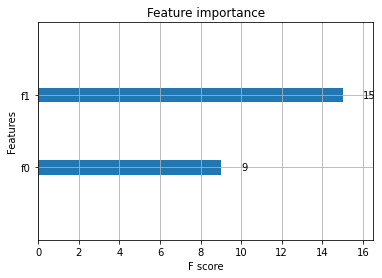

In [12]:
# 1.绘制重要性
xgb.plot_importance(bst)
# 2.绘制输出树
#xgb.plot_tree(bst, num_trees=2)
# 3.使用xgboost.to_graphviz()将目标树转换为graphviz
#xgb.to_graphviz(bst, num_trees=2)

In [18]:
# import graphviz

# # 2.绘制输出树
# xgb.plot_tree(bst, num_trees=2)

In [17]:
# # 3.使用xgboost.to_graphviz()将目标树转换为graphviz
# xgb.to_graphviz(bst, num_trees=2)

### 7. Xgboost算法案例

分类案例

[17:30:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "silent" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[17:30:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softmax' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
accuarcy: 96.67%


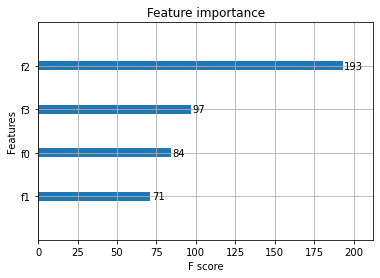

In [20]:
from sklearn.datasets import load_iris
import xgboost as xgb
from xgboost import plot_importance
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score   # 准确率
# 加载样本数据集
iris = load_iris()
X,y = iris.data,iris.target
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1234565) # 数据集分割

# 算法参数
params = {
    'booster': 'gbtree',
    'objective': 'multi:softmax',
    'num_class': 3,
    'gamma': 0.1,
    'max_depth': 6,
    'lambda': 2,
    'subsample': 0.7,
    'colsample_bytree': 0.75,
    'min_child_weight': 3,
    'silent': 0,
    'eta': 0.1,
    'seed': 1,
    'nthread': 4,
}

plst = list(params.items())

dtrain = xgb.DMatrix(X_train, y_train) # 生成数据集格式
num_rounds = 500
model = xgb.train(plst, dtrain, num_rounds) # xgboost模型训练

# 对测试集进行预测
dtest = xgb.DMatrix(X_test)
y_pred = model.predict(dtest)

# 计算准确率
accuracy = accuracy_score(y_test,y_pred)
print("accuarcy: %.2f%%" % (accuracy*100.0))

# 显示重要特征
plot_importance(model)
plt.show()

回归案例

[17:31:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "silent" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




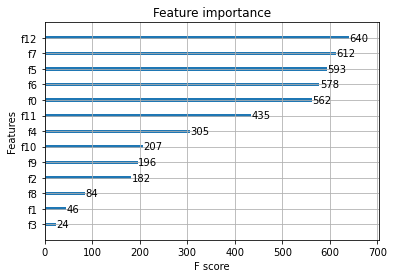

In [21]:
import xgboost as xgb
from xgboost import plot_importance
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_boston
from sklearn.metrics import mean_squared_error

# 加载数据集
boston = load_boston()
X,y = boston.data,boston.target

# XGBoost训练过程
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

params = {
    'booster': 'gbtree',
    'objective': 'reg:squarederror',
    'gamma': 0.1,
    'max_depth': 5,
    'lambda': 3,
    'subsample': 0.7,
    'colsample_bytree': 0.7,
    'min_child_weight': 3,
    'silent': 1,
    'eta': 0.1,
    'seed': 1000,
    'nthread': 4,
}

dtrain = xgb.DMatrix(X_train, y_train)
num_rounds = 300
plst = list(params.items())
model = xgb.train(plst, dtrain, num_rounds)

# 对测试集进行预测
dtest = xgb.DMatrix(X_test)
ans = model.predict(dtest)

# 显示重要特征
plot_importance(model)
plt.show()

XGBoost调参（结合sklearn网格搜索）

代码参考：https://www.jianshu.com/p/1100e333fcab

In [24]:
import xgboost as xgb
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score

iris = load_iris()
X,y = iris.data,iris.target
col = iris.target_names 
train_x, valid_x, train_y, valid_y = train_test_split(X, y, test_size=0.3, random_state=1)   # 分训练集和验证集


parameters = {
              'max_depth': [5, 10, 15, 20, 25],
              'learning_rate': [0.01, 0.02, 0.05, 0.1, 0.15],
              'n_estimators': [500, 1000, 2000, 3000, 5000],
              'min_child_weight': [0, 2, 5, 10, 20],
              'max_delta_step': [0, 0.2, 0.6, 1, 2],
              'subsample': [0.6, 0.7, 0.8, 0.85, 0.95],
              'colsample_bytree': [0.5, 0.6, 0.7, 0.8, 0.9],
              'reg_alpha': [0, 0.25, 0.5, 0.75, 1],
              'reg_lambda': [0.2, 0.4, 0.6, 0.8, 1],
              'scale_pos_weight': [0.2, 0.4, 0.6, 0.8, 1]

}

xlf = xgb.XGBClassifier(max_depth=10,
            learning_rate=0.01,
            n_estimators=2000,
            silent=True,
            objective='multi:softmax',
            num_class=3 ,          
            nthread=-1,
            gamma=0,   # 这里gamma直接取0了，损失函数只要减少0以上，都会进行节点分裂
            min_child_weight=1,
            max_delta_step=0,
            subsample=0.85,
            colsample_bytree=0.7,
            colsample_bylevel=1,
            reg_alpha=0,
            reg_lambda=1,
            scale_pos_weight=1,
            seed=0,
            missing=None)

gs = GridSearchCV(xlf, param_grid=parameters, scoring='accuracy', cv=3)   # 熟悉这里的 GridSearchCV 的使用
gs.fit(train_x, train_y)

print("Best score: %0.3f" % gs.best_score_)
print("Best parameters set: %s" % gs.best_params_ )

#  这个调参方法，太慢了！！！

In [25]:
import gc 
gc.collect()

1360

### 8. LightGBM算法

LightGBM也是像XGBoost一样，是一类集成算法，他跟XGBoost总体来说是一样的，算法本质上与Xgboost没有出入，只是在XGBoost的基础上进行了优化，因此就不对原理进行重复介绍，在这里我们来看看几种算法的差别：
   - 优化速度和内存使用
      - 降低了计算每个分割增益的成本。
      - 使用直方图减法进一步提高速度。
      - 减少内存使用。
      - 减少并行学习的计算成本。
   - 稀疏优化
      - 用离散的bin替换连续的值。如果#bins较小，则可以使用较小的数据类型（例如uint8_t）来存储训练数据 。 
      - 无需存储其他信息即可对特征数值进行预排序  。
   - 精度优化  
      - 使用叶子数为导向的决策树建立算法而不是树的深度导向。
      - 分类特征的编码方式的优化
      - 通信网络的优化
      - 并行学习的优化
      - GPU支持
      
LightGBM的优点：

　　1）更快的训练效率

　　2）低内存使用

　　3）更高的准确率

　　4）支持并行化学习

　　5）可以处理大规模数据

**1.核心参数：**（括号内名称是别名）  
   - objective（objective，app ，application）：默认regression，用于设置损失函数
      - 回归问题：
         - L2损失：regression（regression_l2，l2，mean_squared_error，mse，l2_root，root_mean_squared_error，rmse）
         - L1损失：regression_l1（l1, mean_absolute_error, mae）
         - 其他损失：huber，fair，poisson，quantile，mape，gamma，tweedie
      - 二分类问题：二进制对数损失分类（或逻辑回归）：binary
      - 多类别分类：
         - softmax目标函数： multiclass（softmax）
         -  One-vs-All 目标函数：multiclassova（multiclass_ova，ova，ovr）
      - 交叉熵：
         - 用于交叉熵的目标函数（具有可选的线性权重）：cross_entropy（xentropy）
         - 交叉熵的替代参数化：cross_entropy_lambda（xentlambda） 
   - boosting ：默认gbdt，设置提升类型，选项有gbdt，rf，dart，goss，别名：boosting_type，boost
     - gbdt（gbrt）:传统的梯度提升决策树
     - rf（random_forest）：随机森林
     - dart：多个加性回归树的DROPOUT方法 Dropouts meet Multiple Additive Regression Trees，参见：https://arxiv.org/abs/1505.01866
     - goss：基于梯度的单边采样 Gradient-based One-Side Sampling   
   - data（train，train_data，train_data_file，data_filename）：用于训练的数据或数据file
   - valid （test，valid_data，valid_data_file，test_data，test_data_file，valid_filenames）：验证/测试数据的路径，LightGBM将输出这些数据的指标
   - num_iterations：默认=100，类型= INT
   - n_estimators：提升迭代次数，**LightGBM构造用于多类分类问题的树num_class * num_iterations**
   - learning_rate（shrinkage_rate，eta） ：收缩率，默认=0.1
   - num_leaves（num_leaf，max_leaves，max_leaf） ：默认=31，一棵树上的最大叶子数
   - tree_learner （tree，tree_type，tree_learner_type）：默认=serial，可选：serial，feature，data，voting
     - serial：单台机器的 tree learner
     - feature：特征并行的 tree learner
     - data：数据并行的 tree learner
     - voting：投票并行的 tree learner
   - num_threads（num_thread, nthread）：LightGBM 的线程数，为了更快的速度, 将此设置为真正的 CPU 内核数, 而不是线程的数量 (大多数 CPU 使用超线程来使每个 CPU 内核生成 2 个线程)，当你的数据集小的时候不要将它设置的过大 (比如, 当数据集有 10,000 行时不要使用 64 线程)，对于并行学习, 不应该使用全部的 CPU 内核, 因为这会导致网络性能不佳。  
   - device（device_type）：默认cpu，为树学习选择设备, 你可以使用 GPU 来获得更快的学习速度，可选cpu, gpu。
   - seed （random_seed，random_state）：与其他种子相比，该种子具有较低的优先级，这意味着如果您明确设置其他种子，它将被覆盖。
   
**2.用于控制模型学习过程的参数：**
   - max_depth：限制树模型的最大深度. 这可以在 #data 小的情况下防止过拟合. 树仍然可以通过 leaf-wise 生长。
   - min_data_in_leaf： 默认=20，一个叶子上数据的最小数量. 可以用来处理过拟合。
   - min_sum_hessian_in_leaf（min_sum_hessian_per_leaf, min_sum_hessian, min_hessian）：默认=1e-3，一个叶子上的最小 hessian 和. 类似于 min_data_in_leaf, 可以用来处理过拟合.
   - feature_fraction：default=1.0，如果 feature_fraction 小于 1.0, LightGBM 将会在每次迭代中随机选择部分特征. 例如, 如果设置为 0.8, 将会在每棵树训练之前选择 80% 的特征，可以用来加速训练，可以用来处理过拟合。
   - feature_fraction_seed：默认=2，feature_fraction 的随机数种子。
   - bagging_fraction（sub_row, subsample）：默认=1，不进行重采样的情况下随机选择部分数据
   - bagging_freq（subsample_freq）：bagging 的频率, 0 意味着禁用 bagging. k 意味着每 k 次迭代执行bagging
   - bagging_seed（bagging_fraction_seed） ：默认=3，bagging 随机数种子。
   - early_stopping_round（early_stopping_rounds, early_stopping）：默认=0，如果一个验证集的度量在 early_stopping_round 循环中没有提升, 将停止训练
   - lambda_l1（reg_alpha）：L1正则化系数
   - lambda_l2（reg_lambda）：L2正则化系数
   - min_split_gain（min_gain_to_split）：执行切分的最小增益，默认=0.
   - cat_smooth：默认=10，用于分类特征，可以降低噪声在分类特征中的影响, 尤其是对数据很少的类别
   
**3.度量参数：**
   - metric：default={l2 for regression}, {binary_logloss for binary classification}, {ndcg for lambdarank}, type=multi-enum, options=l1, l2, ndcg, auc, binary_logloss, binary_error …
      - l1, absolute loss, alias=mean_absolute_error, mae
      - l2, square loss, alias=mean_squared_error, mse
      - l2_root, root square loss, alias=root_mean_squared_error, rmse
      - quantile, Quantile regression
      - huber, Huber loss
      - fair, Fair loss
      - poisson, Poisson regression
      -   ndcg, NDCG
      -   map, MAP
      -   auc, AUC
      -   binary_logloss, log loss
      -   binary_error, 样本: 0 的正确分类, 1 错误分类
      -   multi_logloss, mulit-class 损失日志分类
      -   multi_error, error rate for mulit-class 出错率分类
      -   xentropy, cross-entropy (与可选的线性权重), alias=cross_entropy
      -   xentlambda, “intensity-weighted” 交叉熵, alias=cross_entropy_lambda
      -   kldiv, Kullback-Leibler divergence, alias=kullback_leibler
      -   支持多指标, 使用 , 分隔
   - train_metric（training_metric, is_training_metric）：默认=False，如果你需要输出训练的度量结果则设置 true  
   
**4.GPU 参数：**
   - gpu_device_id：default为-1, 这个default意味着选定平台上的设备。         

###  要用的时候，来查一查即可，熟能生巧。

**LightGBM与网格搜索结合调参：**                                                             
参考代码：https://blog.csdn.net/u012735708/article/details/83749703

In [27]:
import lightgbm as lgb
from sklearn import metrics
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
 
canceData=load_breast_cancer()
X=canceData.data
y=canceData.target
X_train,X_test,y_train,y_test=train_test_split(X,y,random_state=0,test_size=0.2)
 
### 数据转换
print('数据转换')
lgb_train = lgb.Dataset(X_train, y_train, free_raw_data=False)
lgb_eval = lgb.Dataset(X_test, y_test, reference=lgb_train,free_raw_data=False)
 
### 设置初始参数--不含交叉验证参数
print('设置参数')
params = {
          'boosting_type': 'gbdt',
          'objective': 'binary',
          'metric': 'auc',
          'nthread':4,
          'learning_rate':0.1
          }
 
### 交叉验证(调参)
print('交叉验证')
max_auc = float('0')
best_params = {}
 
# 准确率
print("调参1：提高准确率")
for num_leaves in range(5,100,5):
    for max_depth in range(3,8,1):
        params['num_leaves'] = num_leaves
        params['max_depth'] = max_depth
 
        cv_results = lgb.cv(
                            params,
                            lgb_train,
                            seed=1,
                            nfold=5,
                            metrics=['auc'],
                            early_stopping_rounds=10,
                            verbose_eval=True
                            )
            
        mean_auc = pd.Series(cv_results['auc-mean']).max()
        boost_rounds = pd.Series(cv_results['auc-mean']).idxmax()
            
        if mean_auc >= max_auc:
            max_auc = mean_auc
            best_params['num_leaves'] = num_leaves
            best_params['max_depth'] = max_depth
if 'num_leaves' and 'max_depth' in best_params.keys():          
    params['num_leaves'] = best_params['num_leaves']
    params['max_depth'] = best_params['max_depth']
 
# 过拟合
print("调参2：降低过拟合")
for max_bin in range(5,256,10):
    for min_data_in_leaf in range(1,102,10):
            params['max_bin'] = max_bin
            params['min_data_in_leaf'] = min_data_in_leaf
            
            cv_results = lgb.cv(
                                params,
                                lgb_train,
                                seed=1,
                                nfold=5,
                                metrics=['auc'],
                                early_stopping_rounds=10,
                                verbose_eval=True
                                )
                    
            mean_auc = pd.Series(cv_results['auc-mean']).max()
            boost_rounds = pd.Series(cv_results['auc-mean']).idxmax()
 
            if mean_auc >= max_auc:
                max_auc = mean_auc
                best_params['max_bin']= max_bin
                best_params['min_data_in_leaf'] = min_data_in_leaf
if 'max_bin' and 'min_data_in_leaf' in best_params.keys():
    params['min_data_in_leaf'] = best_params['min_data_in_leaf']
    params['max_bin'] = best_params['max_bin']
 
print("调参3：降低过拟合")
for feature_fraction in [0.6,0.7,0.8,0.9,1.0]:
    for bagging_fraction in [0.6,0.7,0.8,0.9,1.0]:
        for bagging_freq in range(0,50,5):
            params['feature_fraction'] = feature_fraction
            params['bagging_fraction'] = bagging_fraction
            params['bagging_freq'] = bagging_freq
            
            cv_results = lgb.cv(
                                params,
                                lgb_train,
                                seed=1,
                                nfold=5,
                                metrics=['auc'],
                                early_stopping_rounds=10,
                                verbose_eval=True
                                )
                    
            mean_auc = pd.Series(cv_results['auc-mean']).max()
            boost_rounds = pd.Series(cv_results['auc-mean']).idxmax()
 
            if mean_auc >= max_auc:
                max_auc=mean_auc
                best_params['feature_fraction'] = feature_fraction
                best_params['bagging_fraction'] = bagging_fraction
                best_params['bagging_freq'] = bagging_freq
 
if 'feature_fraction' and 'bagging_fraction' and 'bagging_freq' in best_params.keys():
    params['feature_fraction'] = best_params['feature_fraction']
    params['bagging_fraction'] = best_params['bagging_fraction']
    params['bagging_freq'] = best_params['bagging_freq']
 
 
print("调参4：降低过拟合")
for lambda_l1 in [1e-5,1e-3,1e-1,0.0,0.1,0.3,0.5,0.7,0.9,1.0]:
    for lambda_l2 in [1e-5,1e-3,1e-1,0.0,0.1,0.4,0.6,0.7,0.9,1.0]:
        params['lambda_l1'] = lambda_l1
        params['lambda_l2'] = lambda_l2
        cv_results = lgb.cv(
                            params,
                            lgb_train,
                            seed=1,
                            nfold=5,
                            metrics=['auc'],
                            early_stopping_rounds=10,
                            verbose_eval=True
                            )
                
        mean_auc = pd.Series(cv_results['auc-mean']).max()
        boost_rounds = pd.Series(cv_results['auc-mean']).idxmax()
 
        if mean_auc >= max_auc:
            max_auc=mean_auc
            best_params['lambda_l1'] = lambda_l1
            best_params['lambda_l2'] = lambda_l2
if 'lambda_l1' and 'lambda_l2' in best_params.keys():
    params['lambda_l1'] = best_params['lambda_l1']
    params['lambda_l2'] = best_params['lambda_l2']
 
print("调参5：降低过拟合2")
for min_split_gain in [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]:
    params['min_split_gain'] = min_split_gain
    
    cv_results = lgb.cv(
                        params,
                        lgb_train,
                        seed=1,
                        nfold=5,
                        metrics=['auc'],
                        early_stopping_rounds=10,
                        verbose_eval=True
                        )
            
    mean_auc = pd.Series(cv_results['auc-mean']).max()
    boost_rounds = pd.Series(cv_results['auc-mean']).idxmax()
 
    if mean_auc >= max_auc:
        max_auc=mean_auc
        
        best_params['min_split_gain'] = min_split_gain
if 'min_split_gain' in best_params.keys():
    params['min_split_gain'] = best_params['min_split_gain']
 
print(best_params)

数据转换
设置参数
交叉验证
调参1：提高准确率
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000644 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000714 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 

[65]	cv_agg's auc: 0.990387 + 0.0073339
[66]	cv_agg's auc: 0.990282 + 0.0076473
[67]	cv_agg's auc: 0.990387 + 0.00757558
[68]	cv_agg's auc: 0.990282 + 0.00767581
[69]	cv_agg's auc: 0.990491 + 0.00772402
[70]	cv_agg's auc: 0.990596 + 0.00762156
[71]	cv_agg's auc: 0.990387 + 0.00783072
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[

[10]	cv_agg's auc: 0.978683 + 0.0065373
[11]	cv_agg's auc: 0.979101 + 0.00697839
[12]	cv_agg's auc: 0.98046 + 0.006438
[13]	cv_agg's auc: 0.981714 + 0.00641592
[14]	cv_agg's auc: 0.982341 + 0.00719715
[15]	cv_agg's auc: 0.983177 + 0.00670224
[16]	cv_agg's auc: 0.984117 + 0.00771129
[17]	cv_agg's auc: 0.983751 + 0.00781676
[18]	cv_agg's auc: 0.983333 + 0.00806089
[19]	cv_agg's auc: 0.983438 + 0.00807645
[20]	cv_agg's auc: 0.98396 + 0.00826356
[21]	cv_agg's auc: 0.983856 + 0.00837968
[22]	cv_agg's auc: 0.984587 + 0.00807037
[23]	cv_agg's auc: 0.984483 + 0.00829323
[24]	cv_agg's auc: 0.985737 + 0.00689497
[25]	cv_agg's auc: 0.986364 + 0.00667531
[26]	cv_agg's auc: 0.987513 + 0.00632249
[27]	cv_agg's auc: 0.987774 + 0.00654731
[28]	cv_agg's auc: 0.987774 + 0.00690446
[29]	cv_agg's auc: 0.987774 + 0.00696743
[30]	cv_agg's auc: 0.988401 + 0.006487
[31]	cv_agg's auc: 0.988401 + 0.00629046
[32]	cv_agg's auc: 0.988401 + 0.00705155
[33]	cv_agg's auc: 0.988297 + 0.00672826
[34]	cv_agg's auc: 0.98

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.980251 + 0.00509398
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.981087 + 0.00528853
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.988297 + 0.0056908
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.988297 + 0.00561353
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[7]	cv_agg's auc: 0.977064 + 0.00923657
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.975287 + 0.00984346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.975235 + 0.0105318
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.988506 + 0.00766442
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.988506 + 0.00755682
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number 

[25]	cv_agg's auc: 0.988297 + 0.00545571
[26]	cv_agg's auc: 0.988924 + 0.00502655
[27]	cv_agg's auc: 0.989342 + 0.00477249
[28]	cv_agg's auc: 0.989446 + 0.00468941
[29]	cv_agg's auc: 0.989655 + 0.00489448
[30]	cv_agg's auc: 0.989551 + 0.00592026
[31]	cv_agg's auc: 0.989655 + 0.00593315
[32]	cv_agg's auc: 0.989551 + 0.00623466
[33]	cv_agg's auc: 0.989342 + 0.00637837
[34]	cv_agg's auc: 0.988924 + 0.0063337
[35]	cv_agg's auc: 0.989133 + 0.00635092
[36]	cv_agg's auc: 0.989551 + 0.0067315
[37]	cv_agg's auc: 0.989133 + 0.00699714
[38]	cv_agg's auc: 0.989028 + 0.00715607
[39]	cv_agg's auc: 0.988819 + 0.00702207
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.974138 + 0.00963096
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.97628 + 0.00893921
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.987304 + 0.0054687
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.988036 + 0.00523614
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.986729 + 0.00620482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.986625 + 0.00636123
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.976698 + 0.0110812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.981818 + 0.00535266
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.9814 + 0.00660543
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.989446 + 0.00619425
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.988924 + 0.00629913
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.97581 + 0.00999209
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.973929 + 0.0102946
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

[40]	cv_agg's auc: 0.989237 + 0.00748131
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.988819 + 0.0075177
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.989133 + 0.00758134
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.989133 + 0.0076886
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.984639 + 0.00526214
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.984744 + 0.00662853
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc:

[16]	cv_agg's auc: 0.982706 + 0.00558917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.983124 + 0.00552333
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.982915 + 0.00560672
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.989969 + 0.00652058
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.989551 + 0.0068918
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.987252 + 0.00625739
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.987879 + 0.00583106
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.988088 + 0.00622941
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.960606 + 0.0174048
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.967764 + 0.0124118
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.987147 + 0.00591657
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.987043 + 0.00578406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.987043 + 0.00567928
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.97581 + 0.00999209
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.973929 + 0.0102946
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.975078 + 0.0108159
[LightGBM] [Warning] No further splits with positive gain,

[29]	cv_agg's auc: 0.98861 + 0.00479304
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.989028 + 0.00565616
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.989237 + 0.00596253
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.973615 + 0.0114013
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.974399 + 0.0116124
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.989342 + 0.00717588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.989446 + 0.00739174
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[28]	cv_agg's auc: 0.986991 + 0.0053598
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.987304 + 0.0054687
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.988036 + 0.00523614
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	cv_agg's auc: 0.989655 + 0.00694231
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[61]	cv_agg's auc: 0.98976 + 0.00695174
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[62]	cv_agg's auc: 0.989655 + 0.00686322
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.987879 + 0.00583106
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.988088 + 0.00622941
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.98767 + 0.00638692
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.972727 + 0.0120378
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.973511 + 0.0122703
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.9

[41]	cv_agg's auc: 0.989237 + 0.00718348
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.989028 + 0.00736659
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.988819 + 0.007319
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.984639 + 0.00659716
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.98558 + 0.0066384
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.970063 + 0.0109277
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.970846 + 0.0138838
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.989237 + 0.0075177
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000613 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-w

[14]	cv_agg's auc: 0.982654 + 0.00457449
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.982602 + 0.00547867
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.982706 + 0.00558917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.989133 + 0.00667776
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.989237 + 0.00664662
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.984222 + 0.00552333
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.985057 + 0.00580478
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc:

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Nu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.988192 + 0.00691237
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.988192 + 0.00711475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc:

[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[L

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.986938 + 0.00616421
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.986416 + 0.00689972
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc:

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000190 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000279 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Numbe

[24]	cv_agg's auc: 0.986625 + 0.00514675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.987565 + 0.00547369
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.988192 + 0.00434119
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.982706 + 0.00558917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.983124 + 0.00552333
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.988924 + 0.00681533
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.988924 + 0.00681533
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	cv_agg's auc: 0.989655 + 0.00694231
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[61]	cv_agg's auc: 0.98976 + 0.00695174
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[62]	cv_agg's auc: 

[12]	cv_agg's auc: 0.978892 + 0.00838944
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.977429 + 0.0108361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.983177 + 0.00572714
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[39]	cv_agg's auc: 0.988088 + 0.00630779
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.987983 + 0.00678804
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.988297 + 0.00688863
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.985266 + 0.00585908
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.985266 + 0.00574618
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.988924 + 0.00742123
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.988715 + 0.00745206
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.98861 + 0.00479304
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.989028 + 0.00565616
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.960606 + 0.0174048
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.970063 + 0.0109277
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.97

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.989446 + 0.00619425
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.989342 + 0.00629219
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.989342 + 0.00631817
[LightGBM] [Warning] No further splits with positive

[14]	cv_agg's auc: 0.982654 + 0.00457449
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.982602 + 0.00547867
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.982706 + 0.00558917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.988924 + 0.00681533
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.988924 + 0.00681533
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.986102 + 0.00580478
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.986625 + 0.00649709
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc:

[43]	cv_agg's auc: 0.988297 + 0.00718348
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [I

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.985266 + 0.00585908
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.985266 + 0.00574618
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.960606 + 0.0174048
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.9686 + 0.0119019
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.9695

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.989028 + 0.00442094
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.98861 + 0.00479304
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.980982 + 0.00623116
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.982759 + 0.00545971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.974869 + 0.0103461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.973406 + 0.0106054
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.986991 + 0.0053598
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.987304 + 0.0054687
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.989864 + 0.00651388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.989864 + 0.00679286
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.977064 + 0.00923657
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.975287 + 0.00984346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.988088 + 0.00622941
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.98767 + 0.00638692
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.960606 + 0.0174048
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.967764 + 0.0124118
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

[24]	cv_agg's auc: 0.987043 + 0.00578406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.987043 + 0.00567928
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.986416 + 0.00606601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[14]	cv_agg's auc: 0.982968 + 0.00566195
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.984013 + 0.00531376
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.984744 + 0.00528079
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[35]	cv_agg's auc: 0.989446 + 0.00679929
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.989133 + 0.00695017
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.98861 + 0.00735472
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.98558 + 0.00654731
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.98652 + 0.00647015
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.982915 + 0.00560672
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.98302 + 0.00560769
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.988715 + 0.0070065
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.988924 + 0.00694231
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.988715 + 0.0070065
[LightGBM] [Warning] No further splits with positive g

[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No furth

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.985789 + 0.00621186
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.986102 + 0.00580478
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.986625 + 0.00649709
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009169 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.984848 + 0.00599358
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.984535 + 0.00598993
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.984326 + 0.00549956
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.989237 + 0.00718348
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.989028 + 0.00736659
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.98652 + 0.00657062
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.986938 + 0.00616421
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.984744 + 0.00675094
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.98558 + 0.00654731
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.982706 + 0.00558917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.983124 + 0.00552333
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[46]	cv_agg's auc: 0.989342 + 0.00620482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.989133 + 0.00667776
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.989237 + 0.00664662
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.975287 + 0.00984346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.975235 + 0.0105318
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.988192 + 0.0063268
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.988088 + 0.00630779
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.984744 + 0.00521839
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.984848 + 0.00599358
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.988819 + 0.00674447
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.989237 + 0.00718348
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.989028 + 0.00736659
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.982968 + 0.00566195
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.984013 + 0.00531376
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.984744 + 0.00528079
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.988819 + 0.0075177
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.989133 + 0.00758134
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[14]	cv_agg's auc: 0.982759 + 0.00545971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.984117 + 0.00566195
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.984639 + 0.00526214
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.989446 + 0.00739174
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.989237 + 0.0075177
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.987774 + 0.00586094
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.987461 + 0.00617306
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.989655 + 0.00667776
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg's auc: 0.989551 + 0.00674771
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.977064 + 0.00923657
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.975287 + 0.00984346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000585 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Nu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.988506 + 0.00683612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.988924 + 0.00606061
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.97581 + 0.00999209
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.973929 + 0.0102946
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.989237 + 0.00623992
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.989237 + 0.0066794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.989551 + 0.00639034
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.984744 + 0.00675094
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.98558 + 0.00654731
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.982602 + 0.00547867
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.982706 + 0.00558917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[40]	cv_agg's auc: 0.988924 + 0.00681533
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.988924 + 0.00681533
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.988715 + 0.0070065
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM]

[21]	cv_agg's auc: 0.986102 + 0.00580478
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.986625 + 0.00649709
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.986729 + 0.00620482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000474 seconds.
You can set `force_co

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.984326 + 0.00549956
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.985266 + 0.00585908
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.985266 + 0.00574618
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.989028 + 0.00736659
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.988819 + 0.007319
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[13]	cv_agg's auc: 0.981087 + 0.00642782
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.982968 + 0.00566195
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.984013 + 0.00531376
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.989551 + 0.00639034
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.989446 + 0.00679929
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc:

[5]	cv_agg's auc: 0.977064 + 0.00873222
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.975026 + 0.0096488
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.97628 + 0.0102241
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.984013 + 0.0054482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.985057 + 0.00541301
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.989342 + 0.00620482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.989133 + 0.00667776
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[8]	cv_agg's auc: 0.975287 + 0.00984346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.975235 + 0.0105318
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.975496 + 0.0100068
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.987983 + 0.00678804
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.988297 + 0.00688863
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.987043 + 0.00567928
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.986416 + 0.00606601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.973929 + 0.0102946
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.975078 + 0.0108159
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.989237 + 0.0066794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.989551 + 0.00639034
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[11]	cv_agg's auc: 0.976594 + 0.0110209
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.981609 + 0.00531171
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.980982 + 0.00623116
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.985057 + 0.00541301
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.984639 + 0.00577414
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.985632 + 0.00629132
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.989342 + 0.00620482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.989133 + 0.00667776
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.989237 + 0.00664662
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [bin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.988192 + 0.0061162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.988297 + 0.00624866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[5]	cv_agg's auc: 0.974922 + 0.0108038
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.973145 + 0.0111744
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.974504 + 0.0113624
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.988819 + 0.00674447
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.989237 + 0.00718348
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.973824 + 0.0117205
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.976594 + 0.0110209
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.981609 + 0.00531171
[LightGBM] [Warning] No further splits with positive g

[40]	cv_agg's auc: 0.989237 + 0.00748131
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.988819 + 0.0075177
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.989133 + 0.00758134
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.988192 + 0.00434119
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.989028 + 0.0046379
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.981818 + 0.00516317
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.982654 + 0.00457449
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc:

[37]	cv_agg's auc: 0.988297 + 0.00607141
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.988088 + 0.00671038
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.988506 + 0.00663347
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.947179 + 0.0165749
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.962435 + 0.0172773
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.986102 + 0.00580478
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.986625 + 0.00649709
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.974922 + 0.0108038
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.973145 + 0.0111744
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.974504 + 0.0113624
[LightGBM] [Warning] No further splits with positive gain,

[32]	cv_agg's auc: 0.988924 + 0.00606061
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.989446 + 0.00619425
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.988924 + 0.00629913
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.984013 + 0.00531376
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.984744 + 0.00528079
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.988924 + 0.0077452
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000628 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.989028 + 0.0046379
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.989028 + 0.00516158
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.967503 + 0.0114629
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.970167 + 0.0141466
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.974138 + 0.0096635
[LightGBM] [Warning] No further splits with positive gain,

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.987304 + 0.0054687
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.988036 + 0.00523614
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.988401 + 0.00543365
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.977064 + 0.00923657
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.975287 + 0.00984346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[31]	cv_agg's auc: 0.987983 + 0.00600268
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.988297 + 0.00645494
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.988506 + 0.00620834
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.972727 + 0.0120378
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.973511 + 0.0122703
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.9

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.988506 + 0.00683612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.988924 + 0.00606061
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.96954 + 0.0147754
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.97581 + 0.00999209
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.989551 + 0.00639034
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.989446 + 0.00679929
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.989133 + 0.00695017
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.97628 + 0.0102241
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.973615 + 0.0114013
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.989342 + 0.00629219
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.989342 + 0.00631817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.989133 + 0.00636809
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.987774 + 0.00586094
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.987461 + 0.00617306
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.975235 + 0.0105318
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.975496 + 0.0100068
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.988506 + 0.00620834
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.988506 + 0.00612868
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.973668 + 0.0119717
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.976698 + 0.0110812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.988924 + 0.00629913
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.989551 + 0.00584602
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[6]	cv_agg's auc: 0.973929 + 0.0102946
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.975078 + 0.0108159
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.972832 + 0.011807
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.989028 + 0.00442094
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.98861 + 0.00479304
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.989028 + 0.00565616
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.973563 + 0.0118985
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.976594 + 0.0110209
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.970167 + 0.0141466
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.974138 + 0.0096635
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.97

[34]	cv_agg's auc: 0.987774 + 0.00586094
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.987461 + 0.00617306
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.987879 + 0.0063337
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[63]	cv_agg's auc: 0.98976 + 0.00683293
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data poin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.985371 + 0.00620834
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.985789 + 0.00621186
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.967764 + 0.0124118
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.968757 + 0.0154155
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.974922 + 0.0108038
[LightGBM] [Warning] No further splits with positive gain,

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.989446 + 0.00619425
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.988924 + 0.00629913
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.976594 + 0.0110209
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.981609 + 0.00531171
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.989133 + 0.00695017
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.98861 + 0.00735472
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.984117 + 0.00566195
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.984639 + 0.00526214
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.989342 + 0.00717588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.989446 + 0.00739174
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[9]	cv_agg's auc: 0.978109 + 0.0170834
[10]	cv_agg's auc: 0.977691 + 0.0179918
[11]	cv_agg's auc: 0.977534 + 0.0184254
[12]	cv_agg's auc: 0.977638 + 0.0182808
[13]	cv_agg's auc: 0.97722 + 0.0184093
[14]	cv_agg's auc: 0.977743 + 0.0188981
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000613 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000074 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 150
[LightGBM] [Info] Number of data points in the train set: 364, number of used

[8]	cv_agg's auc: 0.979206 + 0.00928256
[9]	cv_agg's auc: 0.980669 + 0.011299
[10]	cv_agg's auc: 0.978892 + 0.0115858
[11]	cv_agg's auc: 0.979415 + 0.0126037
[12]	cv_agg's auc: 0.979519 + 0.0109451
[13]	cv_agg's auc: 0.97999 + 0.0107691
[14]	cv_agg's auc: 0.981296 + 0.00966294
[15]	cv_agg's auc: 0.981609 + 0.0103846
[16]	cv_agg's auc: 0.981505 + 0.0100109
[17]	cv_agg's auc: 0.982132 + 0.0110172
[18]	cv_agg's auc: 0.981923 + 0.0118583
[19]	cv_agg's auc: 0.982132 + 0.0114426
[20]	cv_agg's auc: 0.982132 + 0.0121933
[21]	cv_agg's auc: 0.982445 + 0.0119134
[22]	cv_agg's auc: 0.983229 + 0.0120806
[23]	cv_agg's auc: 0.983751 + 0.01132
[24]	cv_agg's auc: 0.983229 + 0.0118617
[25]	cv_agg's auc: 0.98396 + 0.0111073
[26]	cv_agg's auc: 0.984169 + 0.0113552
[27]	cv_agg's auc: 0.984378 + 0.0112523
[28]	cv_agg's auc: 0.984587 + 0.0107937
[29]	cv_agg's auc: 0.984274 + 0.0109922
[30]	cv_agg's auc: 0.984483 + 0.0110234
[31]	cv_agg's auc: 0.984483 + 0.0109239
[32]	cv_agg's auc: 0.984274 + 0.0107232
[33]	

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.960084 + 0.017021
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.976332 + 0.00871532
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.977377 + 0.0101802
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.978683 + 0.0107527
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.978213 + 0.00999891
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[29]	cv_agg's auc: 0.984744 + 0.00990428
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.985371 + 0.00970156
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.98558 + 0.00969368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.985371 + 0.00994059
[LightGBM] [

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.941066 + 0.014083
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.960031 + 0.020881
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.984744 + 0.00991117
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.98511 + 0.0105144
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.985737 + 0.0107298
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.986938 + 0.00921675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.986729 + 0.0091131
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.986938 + 0.00918709
[LightGBM] [Info] Number of positive: 232, number of 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.986625 + 0.00999181
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.986729 + 0.0097778
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.986729 + 0.00983347
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.979467 + 0.0128993
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.980878 + 0.0127008
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[1]	cv_agg's auc: 0.922309 + 0.0297753
[2]	cv_agg's auc: 0.954754 + 0.0109062
[3]	cv_agg's auc: 0.958359 + 0.0107527
[4]	cv_agg's auc: 0.965831 + 0.0103856
[5]	cv_agg's auc: 0.974504 + 0.0153329
[6]	cv_agg's auc: 0.974242 + 0.0153329
[7]	cv_agg's auc: 0.97372 + 0.0138494
[8]	cv_agg's auc: 0.974504 + 0.0132902
[9]	cv_agg's auc: 0.97419 + 0.0126404
[10]	cv_agg's auc: 0.975026 + 0.0135283
[11]	cv_agg's auc: 0.976855 + 0.0135334
[12]	cv_agg's auc: 0.976959 + 0.0133084
[13]	cv_agg's auc: 0.979676 + 0.011172
[14]	cv_agg's auc: 0.978945 + 0.0122725
[15]	cv_agg's auc: 0.978422 + 0.0130089
[16]	cv_agg's au

[62]	cv_agg's auc: 0.991641 + 0.00707937
[63]	cv_agg's auc: 0.991954 + 0.00706856
[64]	cv_agg's auc: 0.992059 + 0.00698934
[65]	cv_agg's auc: 0.991641 + 0.00717131
[66]	cv_agg's auc: 0.991745 + 0.00683932
[67]	cv_agg's auc: 0.992059 + 0.00686322
[68]	cv_agg's auc: 0.992268 + 0.00624691
[69]	cv_agg's auc: 0.992163 + 0.0068041
[70]	cv_agg's auc: 0.991954 + 0.00686481
[71]	cv_agg's auc: 0.992163 + 0.0068041
[72]	cv_agg's auc: 0.992372 + 0.00640399
[73]	cv_agg's auc: 0.992059 + 0.00642782
[74]	cv_agg's auc: 0.992163 + 0.00666631
[75]	cv_agg's auc: 0.992268 + 0.00665319
[76]	cv_agg's auc: 0.992163 + 0.00666631
[77]	cv_agg's auc: 0.992163 + 0.00683612
[78]	cv_agg's auc: 0.99185 + 0.00669572
[79]	cv_agg's auc: 0.991954 + 0.00686481
[80]	cv_agg's auc: 0.992059 + 0.00686322
[81]	cv_agg's auc: 0.991954 + 0.00704535
[82]	cv_agg's auc: 0.99185 + 0.00722894
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of

[49]	cv_agg's auc: 0.989342 + 0.00889482
[50]	cv_agg's auc: 0.989237 + 0.00933798
[51]	cv_agg's auc: 0.989342 + 0.0093087
[52]	cv_agg's auc: 0.989446 + 0.00915971
[53]	cv_agg's auc: 0.989655 + 0.00916567
[54]	cv_agg's auc: 0.989551 + 0.00935783
[55]	cv_agg's auc: 0.989446 + 0.00934265
[56]	cv_agg's auc: 0.989655 + 0.00914778
[57]	cv_agg's auc: 0.989446 + 0.00934265
[58]	cv_agg's auc: 0.989446 + 0.00946457
[59]	cv_agg's auc: 0.989655 + 0.00928991
[60]	cv_agg's auc: 0.989864 + 0.00929696
[61]	cv_agg's auc: 0.989864 + 0.00908911
[62]	cv_agg's auc: 0.990073 + 0.00897061
[63]	cv_agg's auc: 0.989969 + 0.0089852
[64]	cv_agg's auc: 0.990073 + 0.00906144
[65]	cv_agg's auc: 0.989969 + 0.0089852
[66]	cv_agg's auc: 0.990073 + 0.00889728
[67]	cv_agg's auc: 0.990387 + 0.00867105
[68]	cv_agg's auc: 0.990491 + 0.00868237
[69]	cv_agg's auc: 0.9907 + 0.00865719
[70]	cv_agg's auc: 0.990909 + 0.00881467
[71]	cv_agg's auc: 0.9907 + 0.00874503
[72]	cv_agg's auc: 0.990909 + 0.00881467
[73]	cv_agg's auc: 0.99

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 450
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 450
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 450
[LightGBM] [Info] Numbe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.989864 + 0.00953468
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.989864 + 0.00926166
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.990073 + 0.00903126
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.989551 + 0.00984124
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.98767 + 0.00872127
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.987461 + 0.00852116
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.980773 + 0.00933973
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.982184 + 0.00960741
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.989551 + 0.0104284
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.989446 + 0.0108512
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[67]	cv_agg's auc: 0.98976 + 0.00962586
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000177 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 450
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000428 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 450
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.986834 + 0.0101224
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.988088 + 0.00839465
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[52]	cv_agg's auc: 0.990178 + 0.00911789
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.990073 + 0.00900705
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.990073 + 0.00900705
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.980617 + 0.00967254
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.980303 + 0.0104449
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[42]	cv_agg's auc: 0.989446 + 0.0087575
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.989237 + 0.00899249
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.989028 + 0.00959405
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, 

[73]	cv_agg's auc: 0.989969 + 0.00836859
[74]	cv_agg's auc: 0.989969 + 0.00843358
[75]	cv_agg's auc: 0.989864 + 0.0085186
[76]	cv_agg's auc: 0.989864 + 0.00831755
[77]	cv_agg's auc: 0.989864 + 0.0084865
[78]	cv_agg's auc: 0.98976 + 0.00855697
[79]	cv_agg's auc: 0.989864 + 0.0084865
[80]	cv_agg's auc: 0.98976 + 0.00874628
[81]	cv_agg's auc: 0.989864 + 0.00867105
[82]	cv_agg's auc: 0.98976 + 0.00874628
[83]	cv_agg's auc: 0.989864 + 0.00867105
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 750
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_col_wi

[13]	cv_agg's auc: 0.981087 + 0.00547369
[14]	cv_agg's auc: 0.9814 + 0.00588882
[15]	cv_agg's auc: 0.981452 + 0.00638179
[16]	cv_agg's auc: 0.982445 + 0.00613403
[17]	cv_agg's auc: 0.98255 + 0.00671201
[18]	cv_agg's auc: 0.982654 + 0.00645325
[19]	cv_agg's auc: 0.983281 + 0.00666631
[20]	cv_agg's auc: 0.983804 + 0.00695488
[21]	cv_agg's auc: 0.984326 + 0.00736659
[22]	cv_agg's auc: 0.984953 + 0.00773109
[23]	cv_agg's auc: 0.984326 + 0.00806698
[24]	cv_agg's auc: 0.984222 + 0.00789183
[25]	cv_agg's auc: 0.985162 + 0.00865214
[26]	cv_agg's auc: 0.985162 + 0.00885792
[27]	cv_agg's auc: 0.98652 + 0.00905782
[28]	cv_agg's auc: 0.986938 + 0.00884805
[29]	cv_agg's auc: 0.98652 + 0.00906987
[30]	cv_agg's auc: 0.987356 + 0.00863192
[31]	cv_agg's auc: 0.987356 + 0.00850449
[32]	cv_agg's auc: 0.987565 + 0.00861293
[33]	cv_agg's auc: 0.987356 + 0.00872002
[34]	cv_agg's auc: 0.987565 + 0.00853013
[35]	cv_agg's auc: 0.987356 + 0.00885669
[36]	cv_agg's auc: 0.987983 + 0.00898885
[37]	cv_agg's auc: 0.

[64]	cv_agg's auc: 0.989655 + 0.00964173
[65]	cv_agg's auc: 0.98976 + 0.00964852
[66]	cv_agg's auc: 0.989551 + 0.00977444
[67]	cv_agg's auc: 0.989551 + 0.00995157
[68]	cv_agg's auc: 0.98976 + 0.00990538
[69]	cv_agg's auc: 0.990178 + 0.00975432
[70]	cv_agg's auc: 0.989969 + 0.0096304
[71]	cv_agg's auc: 0.989655 + 0.010117
[72]	cv_agg's auc: 0.98976 + 0.0100694
[73]	cv_agg's auc: 0.989655 + 0.0102457
[74]	cv_agg's auc: 0.989551 + 0.0102914
[75]	cv_agg's auc: 0.989551 + 0.0102914
[76]	cv_agg's auc: 0.989446 + 0.0104671
[77]	cv_agg's auc: 0.98976 + 0.0104629
[78]	cv_agg's auc: 0.989864 + 0.0100096
[79]	cv_agg's auc: 0.98976 + 0.010188
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 750
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[Ligh

[29]	cv_agg's auc: 0.987147 + 0.00739322
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.987983 + 0.0072921
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.987774 + 0.0070065
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.988192 + 0.00716826
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.979258 + 0.00874347
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.981034 + 0.00747072
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.981766 + 0.00737288
[LightGBM] [Warning] No further splits with positive

[48]	cv_agg's auc: 0.988297 + 0.0102147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.988297 + 0.010358
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.98861 + 0.00969819
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.925601 + 0.00832248
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.966823 + 0.00848103
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.968966 + 0.00986673
[L

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.987356 + 0.0102723
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.987565 + 0.0100574
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.988088 + 0.0103833
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[69]	cv_agg's auc: 0.990073 + 0.00947956
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	cv_agg's auc: 0.989969 + 0.00938928
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[71]	cv_agg's auc: 0.990178 + 0.0091954
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.976698 + 0.00775365
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.976019 + 0.00762765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.988297 + 0.00920845
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.988819 + 0.009053
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0

[6]	cv_agg's auc: 0.9779 + 0.00843358
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.978109 + 0.00758278
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.976646 + 0.00781537
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[34]	cv_agg's auc: 0.985684 + 0.00808456
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.986625 + 0.00791394
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.986938 + 0.00802628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[59]	cv_agg's auc: 0.987774 + 0.00995486
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	cv_agg's auc: 0.987565 + 0.0101493
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[24]	cv_agg's auc: 0.983699 + 0.00985455
[25]	cv_agg's auc: 0.984535 + 0.00908911
[26]	cv_agg's auc: 0.984848 + 0.00919896
[27]	cv_agg's auc: 0.984117 + 0.010091
[28]	cv_agg's auc: 0.984326 + 0.00981903
[29]	cv_agg's auc: 0.9872 + 0.00759645
[30]	cv_agg's auc: 0.9872 + 0.00718652
[31]	cv_agg's auc: 0.986834 + 0.00770279
[32]	cv_agg's auc: 0.987252 + 0.00748131
[33]	cv_agg's auc: 0.986834 + 0.00782932
[34]	cv_agg's auc: 0.9872 + 0.00779858
[35]	cv_agg's auc: 0.987095 + 0.0079022
[36]	cv_agg's auc: 0.987304 + 0.00816051
[37]	cv_agg's auc: 0.988349 + 0.00760291
[38]	cv_agg's auc: 0.988454 + 0.00737473
[39]	cv_agg's auc: 0.988454 + 0.00760435
[40]	cv_agg's auc: 0.988558 + 0.00747035
[41]	cv_agg's auc: 0.988454 + 0.00760435
[42]	cv_agg's auc: 0.988454 + 0.00743739
[43]	cv_agg's auc: 0.988245 + 0.00754235
[44]	cv_agg's auc: 0.989237 + 0.00690446
[45]	cv_agg's auc: 0.989028 + 0.00714079
[46]	cv_agg's auc: 0.988819 + 0.00719108
[47]	cv_agg's auc: 0.98861 + 0.00718956
[48]	cv_agg's auc: 0.98861

[44]	cv_agg's auc: 0.990178 + 0.00838163
[45]	cv_agg's auc: 0.990491 + 0.00835554
[46]	cv_agg's auc: 0.990387 + 0.00853141
[47]	cv_agg's auc: 0.990596 + 0.00854675
[48]	cv_agg's auc: 0.9907 + 0.00856207
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1050
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1050
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warn

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009751 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1050
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[1]	cv_agg's auc: 0.954859 + 0.0178737
[2]	cv_agg'

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.945089 + 0.0162397
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.971421 + 0.0145567
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.974765 + 0.00886131
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.987043 + 0.011847
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.986938 + 0.0122127
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1050
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1050
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1050
[LightGBM] [Info] Number of data points in the train set: 364, number of used features:

[29]	cv_agg's auc: 0.983804 + 0.0130888
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.985057 + 0.0116948
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.985998 + 0.0120707
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[64]	cv_agg's auc: 0.989342 + 0.00986673
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[65]	cv_agg's auc: 0.989342 + 0.00986119
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[66]	cv_agg's auc: 0.989446 + 0.00952781
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.931557 + 0.0123605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.987565 + 0.0107298
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.988192 + 0.0099713
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.971944 + 0.00596756
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.97628 + 0.00904093
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.987147 + 0.00883941
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.987461 + 0.00864835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[1]	cv_agg's auc: 0.912435 + 0.0334417
[2]	cv_agg's auc: 0.937147 + 0.0184288
[3]	cv_agg's auc: 0.949269 + 0.00896513
[4]	cv_agg's auc: 0.948798 + 0.00999673
[5]	cv_agg's auc: 0.948955 + 0.00957069
[6]	cv_agg's auc: 0.95883 + 0.00540089
[7]	cv_agg's auc: 0.966719 + 0.0107463
[8]	cv_agg's auc: 0.967973 + 0.0116904
[9]	cv_agg's auc: 0.96995

[27]	cv_agg's auc: 0.987513 + 0.00736362
[28]	cv_agg's auc: 0.987827 + 0.00763158
[29]	cv_agg's auc: 0.987722 + 0.00769286
[30]	cv_agg's auc: 0.987722 + 0.00779858
[31]	cv_agg's auc: 0.987983 + 0.0082278
[32]	cv_agg's auc: 0.987879 + 0.00839465
[33]	cv_agg's auc: 0.988401 + 0.00807645
[34]	cv_agg's auc: 0.988297 + 0.0084865
[35]	cv_agg's auc: 0.988088 + 0.00785717
[36]	cv_agg's auc: 0.988088 + 0.00816386
[37]	cv_agg's auc: 0.987565 + 0.00883817
[38]	cv_agg's auc: 0.987983 + 0.00854675
[39]	cv_agg's auc: 0.988297 + 0.00858245
[40]	cv_agg's auc: 0.987983 + 0.00871125
[41]	cv_agg's auc: 0.987774 + 0.00884558
[42]	cv_agg's auc: 0.987356 + 0.0094009
[43]	cv_agg's auc: 0.987356 + 0.00944147
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1350
[LightGBM] [Info] Number of data points 

[43]	cv_agg's auc: 0.988506 + 0.00855952
[44]	cv_agg's auc: 0.988819 + 0.00852501
[45]	cv_agg's auc: 0.988715 + 0.00865845
[46]	cv_agg's auc: 0.988924 + 0.00851091
[47]	cv_agg's auc: 0.988924 + 0.00794011
[48]	cv_agg's auc: 0.989028 + 0.00793736
[49]	cv_agg's auc: 0.988924 + 0.00812363
[50]	cv_agg's auc: 0.989028 + 0.00812766
[51]	cv_agg's auc: 0.989133 + 0.00813706
[52]	cv_agg's auc: 0.989237 + 0.00823841
[53]	cv_agg's auc: 0.989237 + 0.00821851
[54]	cv_agg's auc: 0.989237 + 0.00817188
[55]	cv_agg's auc: 0.989237 + 0.00817188
[56]	cv_agg's auc: 0.989446 + 0.00828994
[57]	cv_agg's auc: 0.989551 + 0.00837903
[58]	cv_agg's auc: 0.989342 + 0.00828467
[59]	cv_agg's auc: 0.989237 + 0.00843487
[60]	cv_agg's auc: 0.989551 + 0.00846975
[61]	cv_agg's auc: 0.989655 + 0.00814377
[62]	cv_agg's auc: 0.989655 + 0.00856844
[63]	cv_agg's auc: 0.989551 + 0.00846975
[64]	cv_agg's auc: 0.989342 + 0.00867734
[65]	cv_agg's auc: 0.989655 + 0.00872628
[66]	cv_agg's auc: 0.98976 + 0.00870874
[67]	cv_agg's auc

[32]	cv_agg's auc: 0.987043 + 0.0090819
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.987565 + 0.00863192
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.987983 + 0.00889728
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.987774 + 0.00896208
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.98767 + 0.00955756
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.930878 + 0.014142
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.967189 + 0.0111331
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.971369 + 0.0102563
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.986625 + 0.010188
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.98652 + 0.0104775
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.987147 + 0.0105667
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[68]	cv_agg's auc: 0.989237 + 0.0103316
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[69]	cv_agg's auc: 0.989446 + 0.0104148
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	cv_agg's auc: 0.989133 + 0.0103411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.973824 + 0.00821186
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.977273 + 0.00722062
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.987774 + 0.0101396
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.988192 + 0.0101127
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.980042 + 0.00885823
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.980564 + 0.00688903
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[44]	cv_agg's auc: 0.989864 + 0.00817188
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.989655 + 0.00868237
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.989028 + 0.00859135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.983333 + 0.00734878
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.983647 + 0.00838163
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.988088 + 0.00983236
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.988088 + 0.0100357
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1650
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1650
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [bin

[3]	cv_agg's auc: 0.967868 + 0.0134762
[4]	cv_agg's auc: 0.969279 + 0.01499
[5]	cv_agg's auc: 0.973772 + 0.0107907
[6]	cv_agg's auc: 0.973093 + 0.0100308
[7]	cv_agg's auc: 0.974974 + 0.00781327
[8]	cv_agg's auc: 0.976594 + 0.0071534
[9]	cv_agg's auc: 0.978579 + 0.00749698
[10]	cv_agg's auc: 0.979833 + 0.00790531
[11]	cv_agg's auc: 0.980094 + 0.00830935
[12]	cv_agg's auc: 0.980042 + 0.00764588
[13]	cv_agg's auc: 0.980982 + 0.0093555
[14]	cv_agg's auc: 0.981034 + 0.00990015
[15]	cv_agg's auc: 0.981975 + 0.009333
[16]	cv_agg's auc: 0.982393 + 0.00962898
[17]	cv_agg's auc: 0.983542 + 0.00935783
[18]	cv_agg's auc: 0.983542 + 0.0091125
[19]	cv_agg's auc: 0.983229 + 0.00942237
[20]	cv_agg's auc: 0.98605 + 0.00629913
[21]	cv_agg's auc: 0.986886 + 0.0061872
[22]	cv_agg's auc: 0.986468 + 0.00631817
[23]	cv_agg's auc: 0.986155 + 0.00645832
[24]	cv_agg's auc: 0.986886 + 0.00651388
[25]	cv_agg's auc: 0.987304 + 0.00599722
[26]	cv_agg's auc: 0.98767 + 0.00636123
[27]	cv_agg's auc: 0.987983 + 0.00617

[1]	cv_agg's auc: 0.956635 + 0.0161331
[2]	cv_agg's auc: 0.969854 + 0.0164088
[3]	cv_agg's auc: 0.976698 + 0.0121695
[4]	cv_agg's auc: 0.978892 + 0.0099672
[5]	cv_agg's auc: 0.978892 + 0.011038
[6]	cv_agg's auc: 0.978318 + 0.0098869
[7]	cv_agg's auc: 0.978945 + 0.00905782
[8]	cv_agg's auc: 0.97837 + 0.00961593
[9]	cv_agg's auc: 0.978945 + 0.00967846
[10]	cv_agg's auc: 0.979154 + 0.0100205
[11]	cv_agg's auc: 0.97999 + 0.0099153
[12]	cv_agg's auc: 0.981975 + 0.00901614
[13]	cv_agg's auc: 0.982654 + 0.00911789
[14]	cv_agg's auc: 0.982236 + 0.00947956
[15]	cv_agg's auc: 0.983072 + 0.00927933
[16]	cv_agg's auc: 0.983595 + 0.00912508
[17]	cv_agg's auc: 0.984326 + 0.00831362
[18]	cv_agg's auc: 0.985371 + 0.00772826
[19]	cv_agg's auc: 0.986416 + 0.00669083
[20]	cv_agg's auc: 0.986834 + 0.00655398
[21]	cv_agg's auc: 0.986729 + 0.00709939
[22]	cv_agg's auc: 0.986625 + 0.0074667
[23]	cv_agg's auc: 0.986938 + 0.00739617
[24]	cv_agg's auc: 0.986938 + 0.00754235
[25]	cv_agg's auc: 0.987356 + 0.00704

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.987774 + 0.00831755
[36]	cv_agg's auc: 0.98861 + 0.00804258
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.988715 + 0.00827148
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.988819 + 0.00882705
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.989133 + 0.00866349
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.989446 + 0.00861293
[Ligh

[8]	cv_agg's auc: 0.977011 + 0.00940874
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.977116 + 0.0097669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.976594 + 0.0107234
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.98976 + 0.00904093
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.989446 + 0.00920727
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.928213 + 0.0170914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.957158 + 0.0227923
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.987147 + 0.00980567
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.987252 + 0.00995486
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	cv_agg's auc: 0.990282 + 0.00914898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[61]	cv_agg's auc: 0.990282 + 0.00933798
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[62]	cv_agg's auc:

[90]	cv_agg's auc: 0.991432 + 0.00918471
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[91]	cv_agg's auc: 0.991536 + 0.00917757
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[92]	cv_agg's auc: 0.991432 + 0.00917281
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[11]	cv_agg's auc: 0.980512 + 0.00904727
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.980251 + 0.00927962
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.981661 + 0.00842678
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.989969 + 0.00809671
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.989969 + 0.00847877
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.971003 + 0.0196714
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.980094 + 0.00985288
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.980982 + 0.00759537
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.988088 + 0.00717435
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.988192 + 0.00697526
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[1]	cv_agg's auc: 0.908934 + 0.0384027
[2]	cv_agg's auc: 0.914629 + 0.0391583
[3]	cv_agg's auc: 0.943626 + 0.0210337
[4]	cv_agg's auc: 0.949425 + 0.0153774
[5]	cv_agg's auc: 0.958516 + 0.014753
[6]	cv_agg's auc: 0.958516 + 0.0112632
[7]	cv_agg's auc: 0.961651 + 0.0124665
[8]	cv_agg's auc: 0.963636 + 0.0162246
[9]	cv_agg's auc: 0.963636 + 

[31]	cv_agg's auc: 0.988297 + 0.00718348
[32]	cv_agg's auc: 0.988715 + 0.00769711
[33]	cv_agg's auc: 0.988506 + 0.00714079
[34]	cv_agg's auc: 0.988506 + 0.00756404
[35]	cv_agg's auc: 0.988924 + 0.00711322
[36]	cv_agg's auc: 0.989446 + 0.00686322
[37]	cv_agg's auc: 0.989446 + 0.00686322
[38]	cv_agg's auc: 0.989655 + 0.00650381
[39]	cv_agg's auc: 0.989551 + 0.00654231
[40]	cv_agg's auc: 0.988506 + 0.00655065
[41]	cv_agg's auc: 0.988924 + 0.0061589
[42]	cv_agg's auc: 0.989446 + 0.00587768
[43]	cv_agg's auc: 0.989133 + 0.00610548
[44]	cv_agg's auc: 0.989028 + 0.00602084
[45]	cv_agg's auc: 0.988924 + 0.00624691
[46]	cv_agg's auc: 0.989551 + 0.00670713
[47]	cv_agg's auc: 0.989237 + 0.0061872
[48]	cv_agg's auc: 0.989655 + 0.00635092
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 195

[25]	cv_agg's auc: 0.986834 + 0.00690288
[26]	cv_agg's auc: 0.986729 + 0.00716826
[27]	cv_agg's auc: 0.987147 + 0.00761869
[28]	cv_agg's auc: 0.987356 + 0.00761726
[29]	cv_agg's auc: 0.987356 + 0.00745059
[30]	cv_agg's auc: 0.987461 + 0.00727711
[31]	cv_agg's auc: 0.988192 + 0.00740797
[32]	cv_agg's auc: 0.98861 + 0.00761726
[33]	cv_agg's auc: 0.98861 + 0.00813035
[34]	cv_agg's auc: 0.988715 + 0.00881467
[35]	cv_agg's auc: 0.989133 + 0.00885052
[36]	cv_agg's auc: 0.98976 + 0.00822515
[37]	cv_agg's auc: 0.989864 + 0.00849935
[38]	cv_agg's auc: 0.990282 + 0.00867734
[39]	cv_agg's auc: 0.990178 + 0.00870749
[40]	cv_agg's auc: 0.990178 + 0.00870749
[41]	cv_agg's auc: 0.990178 + 0.00874503
[42]	cv_agg's auc: 0.990282 + 0.00850577
[43]	cv_agg's auc: 0.990178 + 0.00851732
[44]	cv_agg's auc: 0.990073 + 0.00826091
[45]	cv_agg's auc: 0.990596 + 0.00824769
[46]	cv_agg's auc: 0.9907 + 0.00823046
[47]	cv_agg's auc: 0.990491 + 0.0083031
[48]	cv_agg's auc: 0.9907 + 0.00801539
[49]	cv_agg's auc: 0.990

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.989133 + 0.00820388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.989551 + 0.00846975
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.989655 + 0.00849164
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.989237 + 0.00858245
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.962539 + 0.0113492
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.969175 + 0.00807713
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.971787 + 0.0100593
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.970063 + 0.0106941
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

[33]	cv_agg's auc: 0.987147 + 0.0104785
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.987461 + 0.0105791
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.987461 + 0.0103601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[62]	cv_agg's auc: 0.988819 + 0.0100856
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[63]	cv_agg's auc: 0.988715 + 0.00999318
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[64]	cv_agg's auc: 0.988506 + 0.0101579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[91]	cv_agg's auc: 0.989864 + 0.00952322
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[92]	cv_agg's auc: 0.98976 + 0.00959177
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.977429 + 0.00800346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.976907 + 0.00768327
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[44]	cv_agg's auc: 0.988924 + 0.00860659
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.989028 + 0.00864835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.988924 + 0.00889973
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.978683 + 0.00458045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.97722 + 0.00583059
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[37]	cv_agg's auc: 0.987147 + 0.00875875
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.987252 + 0.00870874
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.987356 + 0.00896695
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[1]	cv_agg's auc: 0.900888 + 0.0384879
[2]	cv_agg's auc: 0.927273 + 0.0211251
[3]	cv_agg's auc: 0.935946 + 0.0156036
[4]	cv_agg's auc: 0.953762 + 0.0104611
[5]	cv_agg's auc: 0.95303 + 0.0107575
[6]	cv_agg's auc: 0.948903 + 0.0139759
[7]	cv_agg's auc: 0.955643 + 0.0137105
[8]	cv_agg's auc: 0.965831 + 0.0124544
[9]	cv_agg's auc: 0.967398 + 0.0126814
[10]	cv_agg's auc: 0.965935 + 0.0125844
[11]	cv_agg's auc: 0.966144 + 0.0134128
[12]	cv_agg's auc: 0.969436 + 0.0123196
[13]	cv_agg's auc: 0.973563 + 0.0119762
[14]	cv_agg's auc: 0.976959 + 0.00992465
[15]	cv_agg's auc: 0.979572 + 0.00639973
[16]	cv_agg's auc: 0.983595 + 0.00480953
[17]	cv_agg's auc: 0.984222 + 0.00447799
[18]	cv_agg's auc: 0.984535 + 0.00467717
[19]	cv_agg's auc: 0.

[9]	cv_agg's auc: 0.977952 + 0.00845459
[10]	cv_agg's auc: 0.978109 + 0.00859357
[11]	cv_agg's auc: 0.977534 + 0.00977724
[12]	cv_agg's auc: 0.980355 + 0.00856653
[13]	cv_agg's auc: 0.98046 + 0.00847684
[14]	cv_agg's auc: 0.980669 + 0.00899188
[15]	cv_agg's auc: 0.981348 + 0.00902007
[16]	cv_agg's auc: 0.982184 + 0.00937881
[17]	cv_agg's auc: 0.982811 + 0.00947437
[18]	cv_agg's auc: 0.982706 + 0.0101234
[19]	cv_agg's auc: 0.984222 + 0.0072651
[20]	cv_agg's auc: 0.985057 + 0.00753221
[21]	cv_agg's auc: 0.984796 + 0.00696351
[22]	cv_agg's auc: 0.984692 + 0.00719715
[23]	cv_agg's auc: 0.984796 + 0.00705697
[24]	cv_agg's auc: 0.985005 + 0.00743592
[25]	cv_agg's auc: 0.985214 + 0.00741755
[26]	cv_agg's auc: 0.985684 + 0.00730407
[27]	cv_agg's auc: 0.98652 + 0.00683133
[28]	cv_agg's auc: 0.985893 + 0.00712549
[29]	cv_agg's auc: 0.98652 + 0.00723498
[30]	cv_agg's auc: 0.987461 + 0.00687594
[31]	cv_agg's auc: 0.987565 + 0.00689497
[32]	cv_agg's auc: 0.987774 + 0.00666303
[33]	cv_agg's auc: 0.9

[LightGBM] [Info] Total Bins 2250
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[1]	cv_agg's auc: 0.952351 + 0.00614781
[2]	cv_agg's auc: 0.965935 + 0.00723498
[3]	cv_agg's auc: 0.973668 + 0.010358
[4]	cv_agg's auc: 0.973772 + 0.00807138
[5]	cv_agg's auc: 0.973354 + 0.00838391
[6]	cv_agg's auc:

[70]	cv_agg's auc: 0.991954 + 0.00736362
[71]	cv_agg's auc: 0.99185 + 0.0074006
[72]	cv_agg's auc: 0.991954 + 0.00722894
[73]	cv_agg's auc: 0.991745 + 0.00738435
[74]	cv_agg's auc: 0.991745 + 0.00725005
[75]	cv_agg's auc: 0.991745 + 0.00738435
[76]	cv_agg's auc: 0.991641 + 0.00727711
[77]	cv_agg's auc: 0.991641 + 0.00755682
[78]	cv_agg's auc: 0.991954 + 0.00751044
[79]	cv_agg's auc: 0.991641 + 0.00759285
[80]	cv_agg's auc: 0.991536 + 0.00773109
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2250
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000599 seconds.
You can set `force_c

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[71]	cv_agg's auc: 0.989969 + 0.00883199
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2250
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2250
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001010 secon

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.988819 + 0.0114065
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.989028 + 0.0109194
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.988506 + 0.0107937
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.972727 + 0.00856366
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.971526 + 0.0100932
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.987043 + 0.00883199
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.987252 + 0.0097778
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.973302 + 0.00951319
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.973877 + 0.0110313
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.98652 + 0.00666139
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.986729 + 0.00768292
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[58]	cv_agg's auc: 0.989655 + 0.00885052
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[59]	cv_agg's auc: 0.989864 + 0.00881467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	cv_agg's auc: 0.990387 + 0.00840245
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.960554 + 0.0144639
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.975287 + 0.00746158
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.976071 + 0.0103054
[LightGBM] [Warning] No further splits with positive gain

[28]	cv_agg's auc: 0.986311 + 0.00762442
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.986834 + 0.00727261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.986729 + 0.00724403
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[55]	cv_agg's auc: 0.989551 + 0.00921083
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg's auc: 0.989864 + 0.00915494
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	cv_agg's auc: 0.98976 + 0.00899249
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[28]	cv_agg's auc: 0.986102 + 0.00747948
[29]	cv_agg's auc: 0.986102 + 0.00774837
[30]	cv_agg's auc: 0.986625 + 0.00754489
[31]	cv_agg's auc: 0.986834 + 0.00731564
[32]	cv_agg's auc: 0.986886 + 0.00727411
[33]	cv_agg's auc: 0.987931 + 0.00626611
[34]	cv_agg's auc: 0.988245 + 0.0063
[35]	cv_agg's auc: 0.988245 + 0.00621273
[36]	cv_agg's auc: 0.988767 + 0.00606601
[37]	cv_agg's auc: 0.988767 + 0.00614647
[38]	cv_agg's auc: 0.988297 + 0.00657228
[39]	cv_agg's auc: 0.988192 + 0.00666303
[40]	cv_agg's auc: 0.988036 + 0.00668348
[41]	cv_agg's auc: 0.988297 + 0.00672826
[42]	cv_agg's auc: 0.988401 + 0.00672664
[43]	cv_agg's auc: 0.988924 + 0.00673475
[44]	cv_agg's auc: 0.989133 + 0.0068473
[45]	cv_agg's auc: 0.989237 + 0.00720624
[46]	cv_agg's auc: 0.988924 + 0.00722743
[47]	cv_agg's auc: 0.989237 + 0.00698309
[48]	cv_agg's auc: 0.989237 + 0.00680892
[49]	cv_agg's auc: 0.989446 + 0.00689497
[50]	cv_agg's auc: 0.989446 + 0.0069737
[51]	cv_agg's auc: 0.989446 + 0.00689497
[52]	cv_agg's auc: 0.9

[40]	cv_agg's auc: 0.990909 + 0.00613403
[41]	cv_agg's auc: 0.990805 + 0.006438
[42]	cv_agg's auc: 0.991118 + 0.00633025
[43]	cv_agg's auc: 0.991432 + 0.00644648
[44]	cv_agg's auc: 0.991536 + 0.00619425
[45]	cv_agg's auc: 0.991641 + 0.00619954
[46]	cv_agg's auc: 0.991432 + 0.0061872
[47]	cv_agg's auc: 0.991432 + 0.0061872
[48]	cv_agg's auc: 0.991641 + 0.00643291
[49]	cv_agg's auc: 0.991745 + 0.00624691
[50]	cv_agg's auc: 0.991745 + 0.00624691
[51]	cv_agg's auc: 0.991745 + 0.00643631
[52]	cv_agg's auc: 0.99185 + 0.006438
[53]	cv_agg's auc: 0.991954 + 0.00644648
[54]	cv_agg's auc: 0.991954 + 0.00665483
[55]	cv_agg's auc: 0.99185 + 0.006438
[56]	cv_agg's auc: 0.992059 + 0.00625564
[57]	cv_agg's auc: 0.992163 + 0.00606601
[58]	cv_agg's auc: 0.992059 + 0.00606061
[59]	cv_agg's auc: 0.991954 + 0.00624866
[60]	cv_agg's auc: 0.99185 + 0.00624866
[61]	cv_agg's auc: 0.991954 + 0.00630952
[62]	cv_agg's auc: 0.99185 + 0.00644648
[63]	cv_agg's auc: 0.991641 + 0.00644139
[64]	cv_agg's auc: 0.991641 

[3]	cv_agg's auc: 0.975078 + 0.0133874
[4]	cv_agg's auc: 0.976855 + 0.0124722
[5]	cv_agg's auc: 0.97628 + 0.0137949
[6]	cv_agg's auc: 0.977168 + 0.0134545
[7]	cv_agg's auc: 0.978422 + 0.0128314
[8]	cv_agg's auc: 0.978945 + 0.0113263
[9]	cv_agg's auc: 0.97884 + 0.0111201
[10]	cv_agg's auc: 0.980355 + 0.00964286
[11]	cv_agg's auc: 0.980669 + 0.00985787
[12]	cv_agg's auc: 0.98046 + 0.00985565
[13]	cv_agg's auc: 0.980773 + 0.00989877
[14]	cv_agg's auc: 0.980878 + 0.0105357
[15]	cv_agg's auc: 0.980878 + 0.0106798
[16]	cv_agg's auc: 0.980982 + 0.010608
[17]	cv_agg's auc: 0.980878 + 0.0110318
[18]	cv_agg's auc: 0.984222 + 0.00585908
[19]	cv_agg's auc: 0.984222 + 0.00616776
[20]	cv_agg's auc: 0.984639 + 0.00610727
[21]	cv_agg's auc: 0.984639 + 0.00591657
[22]	cv_agg's auc: 0.985057 + 0.00602628
[23]	cv_agg's auc: 0.985057 + 0.00665483
[24]	cv_agg's auc: 0.985371 + 0.00646677
[25]	cv_agg's auc: 0.985998 + 0.00614114
[26]	cv_agg's auc: 0.986416 + 0.00653396
[27]	cv_agg's auc: 0.987356 + 0.006595

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.988297 + 0.00743739
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.989028 + 0.0072017
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.989237 + 0.00745938
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.989028 + 0.00777755
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg'

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000490 seconds.
You can set `force_col_wise=true` to remove the 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.984117 + 0.0108018
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.984953 + 0.010821
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.984953 + 0.0108814
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.984535 + 0.0108824
[LightGBM] [Warn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.989864 + 0.00939626
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.989237 + 0.00917281
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.975183 + 0.00962104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.97534 + 0.0100126
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.982079 + 0.00754706
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.982236 + 0.00713506
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc:

[44]	cv_agg's auc: 0.989655 + 0.00861926
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.989551 + 0.00879855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.989864 + 0.00868992
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.981818 + 0.00705349
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.982341 + 0.00706895
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.989446 + 0.00912986
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.98976 + 0.00920845
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 

[7]	cv_agg's auc: 0.965256 + 0.0111654
[8]	cv_agg's auc: 0.965778 + 0.0120144
[9]	cv_agg's auc: 0.965987 + 0.0134553
[10]	cv_agg's auc: 0.967241 + 0.0152141
[11]	cv_agg's auc: 0.971996 + 0.01619
[12]	cv_agg's auc: 0.974765 + 0.0133506
[13]	cv_agg's auc: 0.976541 + 0.0119831
[14]	cv_agg's auc: 0.976123 + 0.0127717
[15]	cv_agg's auc: 0.976907 + 0.0126353
[16]	cv_agg's auc: 0.979937 + 0.00940352
[17]	cv_agg's auc: 0.981818 + 0.00832444
[18]	cv_agg's auc: 0.982341 + 0.0080307
[19]	cv_agg's auc: 0.982654 + 0.0080273
[20]	cv_agg's auc: 0.983595 + 0.00750498
[21]	cv_agg's auc: 0.982968 + 0.00816352
[22]	cv_agg's auc: 0.983699 + 0.00806123
[23]	cv_agg's auc: 0.984222 + 0.00768327
[24]	cv_agg's auc: 0.984065 + 0.00819123
[25]	cv_agg's auc: 0.983856 + 0.00796208
[26]	cv_agg's auc: 0.983751 + 0.00767581
[27]	cv_agg's auc: 0.984483 + 0.00767794
[28]	cv_agg's auc: 0.984378 + 0.00725156
[29]	cv_agg's auc: 0.984796 + 0.00732646
[30]	cv_agg's auc: 0.984901 + 0.0071492
[31]	cv_agg's auc: 0.98511 + 0.00

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2850
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2850
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000684 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2850
[LightGBM] [Info] Nu

[28]	cv_agg's auc: 0.986416 + 0.00760004
[29]	cv_agg's auc: 0.986938 + 0.00771412
[30]	cv_agg's auc: 0.987252 + 0.00694389
[31]	cv_agg's auc: 0.988088 + 0.0067671
[32]	cv_agg's auc: 0.988297 + 0.0075177
[33]	cv_agg's auc: 0.988192 + 0.00789322
[34]	cv_agg's auc: 0.988715 + 0.00752496
[35]	cv_agg's auc: 0.988924 + 0.00783629
[36]	cv_agg's auc: 0.989133 + 0.00791256
[37]	cv_agg's auc: 0.989551 + 0.00767154
[38]	cv_agg's auc: 0.990491 + 0.00709015
[39]	cv_agg's auc: 0.990178 + 0.00773109
[40]	cv_agg's auc: 0.990073 + 0.00764302
[41]	cv_agg's auc: 0.989864 + 0.00801675
[42]	cv_agg's auc: 0.989969 + 0.00812363
[43]	cv_agg's auc: 0.990073 + 0.00789598
[44]	cv_agg's auc: 0.990282 + 0.00789322
[45]	cv_agg's auc: 0.990178 + 0.00787798
[46]	cv_agg's auc: 0.990596 + 0.00762156
[47]	cv_agg's auc: 0.990387 + 0.00774661
[48]	cv_agg's auc: 0.990387 + 0.00793461
[49]	cv_agg's auc: 0.990805 + 0.0074227
[50]	cv_agg's auc: 0.990805 + 0.0074227
[51]	cv_agg's auc: 0.990805 + 0.00716064
[52]	cv_agg's auc: 0

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.036168 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2850
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.104988 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2850
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No f

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2850
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.984744 + 0.0111881
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.985371 + 0.0118267
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.986207 + 0.00939626
[LightGBM] [Warning] No further splits with positive g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg's auc: 0.989342 + 0.00893157
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	cv_agg's auc: 0.989342 + 0.00859516
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Info] Total Bins 2850
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2850
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2850
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No furth

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.986416 + 0.00738139
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.986311 + 0.00770279
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc:

[53]	cv_agg's auc: 0.990491 + 0.00845943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.990491 + 0.00845943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.990491 + 0.0086256
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.980146 + 0.0064731
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.980564 + 0.00619425
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[44]	cv_agg's auc: 0.98976 + 0.00850577
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.989655 + 0.00847877
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.990073 + 0.00860405
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[71]	cv_agg's auc: 0.990387 + 0.00627481
[72]	cv_agg's auc: 0.990387 + 0.00642102
[73]	cv_agg's auc: 0.990491 + 0.006487
[74]	cv_agg's auc: 0.990491 + 0.00664498
[75]	cv_agg's auc: 0.9907 + 0.00670224
[76]	cv_agg's auc: 0.9907 + 0.00670224
[77]	cv_agg's auc: 0.990805 + 0.00628351
[78]	cv_agg's auc: 0.9907 + 0.00666139
[79]	cv_agg's auc: 0.990805 + 0.00678482
[80]	cv_agg's auc: 0.990909 + 0.00676871
[81]	cv_agg's auc: 0.991118 + 0.00666631
[82]	cv_agg's auc: 0.990805 + 0.00663017
[83]	cv_agg's auc: 0.990909 + 0.00704535
[84]	cv_agg's auc: 0.990909 + 0.00688863
[85]	cv_agg's auc: 0.991118 + 0.00653396
[86]	cv_agg's auc: 0.991327 + 0.00662194
[87]	cv_agg's auc: 0.991223 + 0.00666139
[88]	cv_agg's auc: 0.991432 + 0.00649709
[89]	cv_agg's auc: 0.991641 + 0.00615535
[90]	cv_agg's auc: 0.991536 + 0.00632508
[91]	cv_agg's auc: 0.991432 + 0.00630952
[92]	cv_agg's auc: 0.991641 + 0.00648363
[93]	cv_agg's auc: 0.991641 + 0.00633887
[94]	cv_agg's auc: 0.991745 + 0.00671852
[95]	cv_agg's auc: 0.992

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training fro

[18]	cv_agg's auc: 0.982445 + 0.00646339
[19]	cv_agg's auc: 0.983386 + 0.0067671
[20]	cv_agg's auc: 0.983856 + 0.0061518
[21]	cv_agg's auc: 0.983647 + 0.00576515
[22]	cv_agg's auc: 0.984378 + 0.00612512
[23]	cv_agg's auc: 0.98511 + 0.00611084
[24]	cv_agg's auc: 0.985946 + 0.00648026
[25]	cv_agg's auc: 0.98605 + 0.00594235
[26]	cv_agg's auc: 0.986155 + 0.00566581
[27]	cv_agg's auc: 0.986259 + 0.00670224
[28]	cv_agg's auc: 0.987304 + 0.00641081
[29]	cv_agg's auc: 0.987722 + 0.00677596
[30]	cv_agg's auc: 0.987931 + 0.00709939
[31]	cv_agg's auc: 0.98908 + 0.00703372
[32]	cv_agg's auc: 0.989603 + 0.00724779
[33]	cv_agg's auc: 0.98908 + 0.0075177
[34]	cv_agg's auc: 0.990021 + 0.00771129
[35]	cv_agg's auc: 0.99023 + 0.00767083
[36]	cv_agg's auc: 0.990543 + 0.00782374
[37]	cv_agg's auc: 0.990334 + 0.00765373
[38]	cv_agg's auc: 0.990648 + 0.0076473
[39]	cv_agg's auc: 0.990334 + 0.00792703
[40]	cv_agg's auc: 0.990334 + 0.00766442
[41]	cv_agg's auc: 0.990596 + 0.00707165
[42]	cv_agg's auc: 0.9904

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.946082 + 0.0111844
[2]	cv_agg's auc: 0.965517 + 0.0184779
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.974451 + 0.00805412
[4]	cv_agg's auc: 0.975026 + 0.0111759
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.976489 + 0.00924041
[6]	cv_agg's auc: 0.977325 + 0.00851379
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.976803 + 0.00878365
[8]	cv_agg's auc: 0.979101 + 0.00931251
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.980355 + 0.00792256
[10]	cv_agg's auc: 0.981557 + 0.00789183
[1

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.978631 + 0.00880847
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.978161 + 0.00956355
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.979049 + 0.0103751
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Nu

[20]	cv_agg's auc: 0.984222 + 0.00907137
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.984013 + 0.00871031
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.983804 + 0.00926549
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.975914 + 0.00974984
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.976332 + 0.0103464
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.978474 + 0.00794698
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.987774 + 0.00793461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.988192 + 0.00813169
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.990178 + 0.00887516
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.98976 + 0.00913703
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.98976 + 0.00885792
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.981087 + 0.00682333
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.981505 + 0.00749589
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.987879 + 0.00766014
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.98767 + 0.00778176
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[58]	cv_agg's auc: 0.989237 + 0.0101234
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[59]	cv_agg's auc: 0.988819 + 0.0101772
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[36]	cv_agg's auc: 0.984692 + 0.00774872
[37]	cv_agg's auc: 0.984744 + 0.00760291
[38]	cv_agg's auc: 0.985162 + 0.00790704
[39]	cv_agg's auc: 0.984222 + 0.00896086
[40]	cv_agg's auc: 0.984639 + 0.0081585
[41]	cv_agg's auc: 0.98302 + 0.00981903
[42]	cv_agg's auc: 0.985946 + 0.00710323
[43]	cv_agg's auc: 0.986155 + 0.00723196
[44]	cv_agg's auc: 0.986677 + 0.00698621
[45]	cv_agg's auc: 0.986782 + 0.00746523
[46]	cv_agg's auc: 0.987356 + 0.00738435
[47]	cv_agg's auc: 0.987252 + 0.00736362
[48]	cv_agg's auc: 0.987565 + 0.00782235
[49]	cv_agg's auc: 0.987461 + 0.00786133
[50]	cv_agg's auc: 0.987356 + 0.00781537
[51]	cv_agg's auc: 0.987356 + 0.00781537
[52]	cv_agg's auc: 0.987565 + 0.00787105
[53]	cv_agg's auc: 0.987774 + 0.00783769
[54]	cv_agg's auc: 0.98767 + 0.00750317
[55]	cv_agg's auc: 0.988401 + 0.00714385
[56]	cv_agg's auc: 0.988297 + 0.007474
[57]	cv_agg's auc: 0.988297 + 0.00764016
[58]	cv_agg's auc: 0.988715 + 0.00707628
[59]	cv_agg's auc: 0.988715 + 0.00706083
[60]	cv_agg's auc: 0.

[19]	cv_agg's auc: 0.984065 + 0.00606601
[20]	cv_agg's auc: 0.984169 + 0.00606511
[21]	cv_agg's auc: 0.985057 + 0.0066384
[22]	cv_agg's auc: 0.984901 + 0.00687276
[23]	cv_agg's auc: 0.98511 + 0.00684012
[24]	cv_agg's auc: 0.985528 + 0.00662853
[25]	cv_agg's auc: 0.985737 + 0.00683932
[26]	cv_agg's auc: 0.986468 + 0.00667122
[27]	cv_agg's auc: 0.986311 + 0.00668593
[28]	cv_agg's auc: 0.987461 + 0.00705619
[29]	cv_agg's auc: 0.98767 + 0.00714538
[30]	cv_agg's auc: 0.988192 + 0.00702984
[31]	cv_agg's auc: 0.98861 + 0.00709785
[32]	cv_agg's auc: 0.988715 + 0.00727411
[33]	cv_agg's auc: 0.988506 + 0.00710246
[34]	cv_agg's auc: 0.988401 + 0.0072651
[35]	cv_agg's auc: 0.988506 + 0.00745499
[36]	cv_agg's auc: 0.988819 + 0.00717588
[37]	cv_agg's auc: 0.988401 + 0.00728761
[38]	cv_agg's auc: 0.988819 + 0.0074227
[39]	cv_agg's auc: 0.98861 + 0.00733986
[40]	cv_agg's auc: 0.988924 + 0.00698152
[41]	cv_agg's auc: 0.989028 + 0.00694703
[42]	cv_agg's auc: 0.98976 + 0.00697526
[43]	cv_agg's auc: 0.989

[25]	cv_agg's auc: 0.985893 + 0.00596619
[26]	cv_agg's auc: 0.985998 + 0.00592394
[27]	cv_agg's auc: 0.985998 + 0.00624691
[28]	cv_agg's auc: 0.986311 + 0.00631644
[29]	cv_agg's auc: 0.987252 + 0.00620482
[30]	cv_agg's auc: 0.987252 + 0.00610727
[31]	cv_agg's auc: 0.98767 + 0.00607141
[32]	cv_agg's auc: 0.987565 + 0.00655398
[33]	cv_agg's auc: 0.987565 + 0.00699714
[34]	cv_agg's auc: 0.987983 + 0.00644986
[35]	cv_agg's auc: 0.987774 + 0.00658887
[36]	cv_agg's auc: 0.988088 + 0.00650381
[37]	cv_agg's auc: 0.988192 + 0.00668757
[38]	cv_agg's auc: 0.988715 + 0.00697526
[39]	cv_agg's auc: 0.988819 + 0.00737103
[40]	cv_agg's auc: 0.988924 + 0.00736955
[41]	cv_agg's auc: 0.988819 + 0.00752496
[42]	cv_agg's auc: 0.98861 + 0.00770279
[43]	cv_agg's auc: 0.988924 + 0.00809671
[44]	cv_agg's auc: 0.989133 + 0.00811018
[45]	cv_agg's auc: 0.989446 + 0.00806969
[46]	cv_agg's auc: 0.989446 + 0.00839465
[47]	cv_agg's auc: 0.989446 + 0.00821053
[48]	cv_agg's auc: 0.989655 + 0.00843358
[49]	cv_agg's auc:

[10]	cv_agg's auc: 0.977952 + 0.012517
[11]	cv_agg's auc: 0.97837 + 0.0105461
[12]	cv_agg's auc: 0.980564 + 0.00827346
[13]	cv_agg's auc: 0.980564 + 0.00847394
[14]	cv_agg's auc: 0.9814 + 0.00841381
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.982811 + 0.00897426
[16]	cv_agg's auc: 0.983386 + 0.00853653
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.98349 + 0.00734135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.983595 + 0.00775365
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.983908 + 0.00777334
[20]	cv_agg's auc: 0.984431 + 0.00761726
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.985371 + 0.00769995
[LightGBM] [Warning] No further splits with positive gain, best g

[1]	cv_agg's auc: 0.934169 + 0.0220162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.957471 + 0.0250508
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.970272 + 0.0133514
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.987565 + 0.00789183
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.98767 + 0.00814511
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.970846 + 0.0133076
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.972884 + 0.0102027
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.98976 + 0.00838293
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.98976 + 0.00844781
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.977064 + 0.0103567
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.97931 + 0.00858881
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.989812 + 0.00792703
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.989916 + 0.00819389
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.979833 + 0.00673637
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.979363 + 0.00702518
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.98861 + 0.0103411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.988506 + 0.010131
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[75]	cv_agg's auc: 0.989864 + 0.0099274
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[76]	cv_agg's auc: 0.989864 + 0.010204
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[4]	cv_agg's auc: 0.946447 + 0.0180209
[5]	cv_agg's auc: 0.950157 + 0.019772
[6]	cv_agg's auc: 0.95256 + 0.0142707
[7]	cv_agg's auc: 0.961129 + 0.0053112
[8]	cv_agg's auc: 0.961651 + 0.00483782
[9]	cv_agg's auc: 0.968025 + 0.0128633
[10]	cv_agg's auc: 0.9721 + 0.0117228
[11]	cv_agg's auc: 0.971891 + 0.0123744
[12]	cv_agg's auc: 0.971944 + 0.0122669
[13]	cv_agg's auc: 0.974451 + 0.0132189
[14]	cv_agg's auc: 0.97581 + 0.0117044
[15]	cv_agg's auc: 0.976959 + 0.0122389
[16]	cv_agg's auc: 0.97722 + 0.0117519
[17]	cv_agg's auc: 0.981714 + 0.00557107
[18]	cv_agg's auc: 0.981296 + 0.00578406
[19]	cv_agg's auc: 0.981557 + 0.00573191
[20]	cv_agg's auc: 0.982288 + 0.00564263
[21]	cv_agg's auc: 0.982497 + 0.00541452
[22]	cv_agg's auc: 0.983124 + 0.00515523
[23]	cv_agg's auc: 0.983229 + 0.00558428
[24]	cv_agg's auc: 0.983647 + 0.00600177
[25]	cv_agg's auc: 0.983542 + 0.00644563
[26]	cv_agg's auc: 0.984326 + 0.00669083
[27]	cv_agg's auc: 0.984431 + 0.0064617
[28]	cv_agg's auc: 0.984848 + 0.00687594


[56]	cv_agg's auc: 0.987879 + 0.008029
[57]	cv_agg's auc: 0.987879 + 0.008029
[58]	cv_agg's auc: 0.987774 + 0.00833722
[59]	cv_agg's auc: 0.988401 + 0.00728761
[60]	cv_agg's auc: 0.98861 + 0.00719715
[61]	cv_agg's auc: 0.988401 + 0.00755248
[62]	cv_agg's auc: 0.988819 + 0.00743005
[63]	cv_agg's auc: 0.989342 + 0.00722138
[64]	cv_agg's auc: 0.989342 + 0.00752496
[65]	cv_agg's auc: 0.989028 + 0.00806021
[66]	cv_agg's auc: 0.988924 + 0.00804937
[67]	cv_agg's auc: 0.989133 + 0.00781537
[68]	cv_agg's auc: 0.989342 + 0.00768292
[69]	cv_agg's auc: 0.989342 + 0.00768292
[70]	cv_agg's auc: 0.989028 + 0.00795797
[71]	cv_agg's auc: 0.989237 + 0.00787937
[72]	cv_agg's auc: 0.989551 + 0.00774942
[73]	cv_agg's auc: 0.989446 + 0.00799493
[74]	cv_agg's auc: 0.989655 + 0.00811691
[75]	cv_agg's auc: 0.990073 + 0.00781257
[76]	cv_agg's auc: 0.990282 + 0.0078655
[77]	cv_agg's auc: 0.989969 + 0.00819722
[78]	cv_agg's auc: 0.990178 + 0.00802219
[79]	cv_agg's auc: 0.990073 + 0.00810749
[80]	cv_agg's auc: 0.9

[18]	cv_agg's auc: 0.985319 + 0.00616067
[19]	cv_agg's auc: 0.985371 + 0.00593867
[20]	cv_agg's auc: 0.985266 + 0.00622064
[21]	cv_agg's auc: 0.985266 + 0.00610548
[22]	cv_agg's auc: 0.985684 + 0.00629219
[23]	cv_agg's auc: 0.985684 + 0.0061872
[24]	cv_agg's auc: 0.986102 + 0.00563295
[25]	cv_agg's auc: 0.986155 + 0.00619954
[26]	cv_agg's auc: 0.986155 + 0.00618632
[27]	cv_agg's auc: 0.986886 + 0.00601267
[28]	cv_agg's auc: 0.986782 + 0.00583574
[29]	cv_agg's auc: 0.987409 + 0.00598993
[30]	cv_agg's auc: 0.988192 + 0.00594419
[31]	cv_agg's auc: 0.988819 + 0.0060534
[32]	cv_agg's auc: 0.988715 + 0.00607141
[33]	cv_agg's auc: 0.989446 + 0.00662029
[34]	cv_agg's auc: 0.989655 + 0.00675094
[35]	cv_agg's auc: 0.990282 + 0.00712242
[36]	cv_agg's auc: 0.990491 + 0.00675094
[37]	cv_agg's auc: 0.989864 + 0.00718348
[38]	cv_agg's auc: 0.990282 + 0.00737103
[39]	cv_agg's auc: 0.989969 + 0.00755971
[40]	cv_agg's auc: 0.989864 + 0.00758998
[41]	cv_agg's auc: 0.98976 + 0.00767581
[42]	cv_agg's auc: 

[8]	cv_agg's auc: 0.977534 + 0.00848585
[9]	cv_agg's auc: 0.977011 + 0.00866884
[10]	cv_agg's auc: 0.979781 + 0.00838652
[11]	cv_agg's auc: 0.97999 + 0.00834082
[12]	cv_agg's auc: 0.980303 + 0.00845459
[13]	cv_agg's auc: 0.981348 + 0.00818223
[14]	cv_agg's auc: 0.980303 + 0.00879017
[15]	cv_agg's auc: 0.980878 + 0.00910561
[16]	cv_agg's auc: 0.980878 + 0.00992603
[17]	cv_agg's auc: 0.981087 + 0.0107945
[18]	cv_agg's auc: 0.981348 + 0.0107957
[19]	cv_agg's auc: 0.984378 + 0.00616067
[20]	cv_agg's auc: 0.984692 + 0.00655398
[21]	cv_agg's auc: 0.984587 + 0.00657975
[22]	cv_agg's auc: 0.985214 + 0.00675094
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.985632 + 0.00659219
[24]	cv_agg's auc: 0.986259 + 0.00720852
[25]	cv_agg's auc: 0.98605 + 0.00736584
[26]	cv_agg's auc: 0.986782 + 0.00730631
[27]	cv_agg's auc: 0.986364 + 0.00758638
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.986155 + 0.0079

[52]	cv_agg's auc: 0.990596 + 0.00872377
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.990805 + 0.00872127
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.990805 + 0.00836337
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.990909 + 0.00843487
[56]	cv_agg's auc: 0.9907 + 0.00853653
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	cv_agg's auc: 0.9907 + 0.00872002
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[58]	cv_

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.979885 + 0.00769995
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.980617 + 0.00837968
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.979833 + 0.0104472
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.989655 + 0.00892423
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.98976 + 0.00918471
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.977743 + 0.00884095
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.978213 + 0.00931192
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[38]	cv_agg's auc: 0.990073 + 0.00904334
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.990596 + 0.00918709
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.9907 + 0.00923687
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.976646 + 0.0111539
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.97884 + 0.00988552
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.97

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.989342 + 0.00794836
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.989655 + 0.00902763
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc:

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3750
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3750
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000661 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3750
[LightGBM] [Info] Nu

[25]	cv_agg's auc: 0.98652 + 0.00708245
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.986834 + 0.00785717
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.987147 + 0.00783769
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg's auc: 0.989551 + 0.00967903
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	cv_agg's auc: 0.98976 + 0.00965418
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000606 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4050
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise m

[34]	cv_agg's auc: 0.983804 + 0.00912747
[35]	cv_agg's auc: 0.984535 + 0.00914301
[36]	cv_agg's auc: 0.984431 + 0.00985455
[37]	cv_agg's auc: 0.98767 + 0.00628351
[38]	cv_agg's auc: 0.988192 + 0.00590733
[39]	cv_agg's auc: 0.988297 + 0.0056908
[40]	cv_agg's auc: 0.988715 + 0.00587954
[41]	cv_agg's auc: 0.98861 + 0.00584041
[42]	cv_agg's auc: 0.988401 + 0.0055921
[43]	cv_agg's auc: 0.988401 + 0.00589623
[44]	cv_agg's auc: 0.988715 + 0.00573857
[45]	cv_agg's auc: 0.988506 + 0.00593867
[46]	cv_agg's auc: 0.988715 + 0.00609832
[47]	cv_agg's auc: 0.988715 + 0.00613403
[48]	cv_agg's auc: 0.988506 + 0.00648363
[49]	cv_agg's auc: 0.988401 + 0.00639375
[50]	cv_agg's auc: 0.98861 + 0.00640229
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4050
[LightGBM] [Info] Number of data points in

[37]	cv_agg's auc: 0.990596 + 0.00724704
[38]	cv_agg's auc: 0.990596 + 0.00773532
[39]	cv_agg's auc: 0.9907 + 0.00788491
[40]	cv_agg's auc: 0.990596 + 0.00790289
[41]	cv_agg's auc: 0.9907 + 0.00788491
[42]	cv_agg's auc: 0.990282 + 0.00813169
[43]	cv_agg's auc: 0.990491 + 0.00808321
[44]	cv_agg's auc: 0.990596 + 0.00810749
[45]	cv_agg's auc: 0.9907 + 0.00808321
[46]	cv_agg's auc: 0.991014 + 0.00780838
[47]	cv_agg's auc: 0.991118 + 0.0079511
[48]	cv_agg's auc: 0.990909 + 0.00787937
[49]	cv_agg's auc: 0.990491 + 0.00831624
[50]	cv_agg's auc: 0.9907 + 0.0084271
[51]	cv_agg's auc: 0.991014 + 0.00830967
[52]	cv_agg's auc: 0.9907 + 0.0083031
[53]	cv_agg's auc: 0.990596 + 0.00835946
[54]	cv_agg's auc: 0.990909 + 0.00823841
[55]	cv_agg's auc: 0.991014 + 0.00844652
[56]	cv_agg's auc: 0.991118 + 0.00839205
[57]	cv_agg's auc: 0.991223 + 0.00829652
[58]	cv_agg's auc: 0.991327 + 0.00824504
[59]	cv_agg's auc: 0.991014 + 0.00827016
[60]	cv_agg's auc: 0.990805 + 0.00838293
[61]	cv_agg's auc: 0.991014 +

[12]	cv_agg's auc: 0.98046 + 0.00932481
[13]	cv_agg's auc: 0.980251 + 0.00933534
[14]	cv_agg's auc: 0.981191 + 0.00923303
[15]	cv_agg's auc: 0.982027 + 0.0095875
[16]	cv_agg's auc: 0.98187 + 0.0103173
[17]	cv_agg's auc: 0.984796 + 0.00713391
[18]	cv_agg's auc: 0.985005 + 0.00629913
[19]	cv_agg's auc: 0.98511 + 0.00645832
[20]	cv_agg's auc: 0.984692 + 0.00645748
[21]	cv_agg's auc: 0.985632 + 0.00626088
[22]	cv_agg's auc: 0.985737 + 0.00687514
[23]	cv_agg's auc: 0.98605 + 0.0067388
[24]	cv_agg's auc: 0.986991 + 0.00725156
[25]	cv_agg's auc: 0.986782 + 0.00763873
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.987409 + 0.00763659
[27]	cv_agg's auc: 0.987304 + 0.00771341
[28]	cv_agg's auc: 0.986886 + 0.00773955
[29]	cv_agg's auc: 0.987304 + 0.00796071
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.987043 + 0.00818389
[31]	cv_agg's auc: 0.988088 + 0.00750171
[32]	cv_agg's auc: 0.987983 + 0.00751

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.98767 + 0.00902884
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.987879 + 0.00928991
[36]	cv_agg's auc: 0.987879 + 0.00940671
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.988715 + 0.00960315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.988819 + 0.00948877
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.974451 + 0.0115716
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.974242 + 0.0132459
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

[33]	cv_agg's auc: 0.988506 + 0.00910351
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.988401 + 0.00906987
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.98861 + 0.0087824
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[63]	cv_agg's auc: 0.989969 + 0.00930752
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4050
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4050
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [I

[22]	cv_agg's auc: 0.98302 + 0.00973246
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.984065 + 0.0103152
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.985162 + 0.00824504
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.989655 + 0.00938928
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.989342 + 0.00964286
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.989446 + 0.00975432
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.978997 + 0.00972068
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.978997 + 0.00990428
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.989655 + 0.00949912
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.989969 + 0.00912986
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4050
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4050
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4050
[LightGBM] [Info] Nu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.986573 + 0.00734358
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.98652 + 0.00753801
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg's auc: 0.989237 + 0.00936133
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	cv_agg's auc: 0.989342 + 0.00956898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[58]	cv_agg's auc: 0.989133 + 0.00924868
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4350
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4350
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4350
[LightGBM] [Info] Number of data points in the train set: 364, number of used features:

[41]	cv_agg's auc: 0.988506 + 0.00611084
[42]	cv_agg's auc: 0.988192 + 0.00606241
[43]	cv_agg's auc: 0.988715 + 0.00630952
[44]	cv_agg's auc: 0.98861 + 0.00632508
[45]	cv_agg's auc: 0.988297 + 0.00664662
[46]	cv_agg's auc: 0.988297 + 0.00648868
[47]	cv_agg's auc: 0.988506 + 0.0065839
[48]	cv_agg's auc: 0.988401 + 0.00709785
[49]	cv_agg's auc: 0.98861 + 0.00679929
[50]	cv_agg's auc: 0.988715 + 0.00685686
[51]	cv_agg's auc: 0.988819 + 0.00653897
[52]	cv_agg's auc: 0.988924 + 0.006487
[53]	cv_agg's auc: 0.989446 + 0.00592394
[54]	cv_agg's auc: 0.989551 + 0.00615535
[55]	cv_agg's auc: 0.989551 + 0.00615535
[56]	cv_agg's auc: 0.989342 + 0.00607141
[57]	cv_agg's auc: 0.989551 + 0.00615535
[58]	cv_agg's auc: 0.989655 + 0.00640229
[59]	cv_agg's auc: 0.98976 + 0.00610727
[60]	cv_agg's auc: 0.990073 + 0.00629566
[61]	cv_agg's auc: 0.989969 + 0.0061766
[62]	cv_agg's auc: 0.989655 + 0.00627307
[63]	cv_agg's auc: 0.989969 + 0.0061766
[64]	cv_agg's auc: 0.990282 + 0.00621361
[65]	cv_agg's auc: 0.990

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4350
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4350
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4350
[LightGBM] [Info] Nu

[37]	cv_agg's auc: 0.98861 + 0.00847233
[38]	cv_agg's auc: 0.988401 + 0.00844652
[39]	cv_agg's auc: 0.988506 + 0.00894623
[40]	cv_agg's auc: 0.988924 + 0.00912986
[41]	cv_agg's auc: 0.989028 + 0.00930518
[42]	cv_agg's auc: 0.988819 + 0.00891322
[43]	cv_agg's auc: 0.989551 + 0.00862939
[44]	cv_agg's auc: 0.989342 + 0.00909511
[45]	cv_agg's auc: 0.989446 + 0.00900341
[46]	cv_agg's auc: 0.989237 + 0.00983902
[47]	cv_agg's auc: 0.989551 + 0.00973527
[48]	cv_agg's auc: 0.989237 + 0.00945418
[49]	cv_agg's auc: 0.989028 + 0.00964512
[50]	cv_agg's auc: 0.989446 + 0.00944725
[51]	cv_agg's auc: 0.989342 + 0.00893157
[52]	cv_agg's auc: 0.989655 + 0.00888745
[53]	cv_agg's auc: 0.990178 + 0.00896695
[54]	cv_agg's auc: 0.989969 + 0.00891199
[55]	cv_agg's auc: 0.990073 + 0.00887885
[56]	cv_agg's auc: 0.990387 + 0.00880227
[57]	cv_agg's auc: 0.990178 + 0.00879483
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[58]	cv_agg's auc: 0.990491 + 0.00861293
[59]	cv_agg's auc: 0.990

[55]	cv_agg's auc: 0.990282 + 0.00821851
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg's auc: 0.990491 + 0.00803579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	cv_agg's auc: 0.990491 + 0.00803579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[58]	cv_agg's auc: 0.990805 + 0.00810479
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[59]	cv_agg's auc: 0.9907 + 0.00800175
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	cv_agg's auc: 0.9907 + 0.00798126
[61]	cv_agg's auc: 0.990909 + 0.00823841
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[62]	cv_agg's auc: 0.990596 + 0.00816118
[

[23]	cv_agg's auc: 0.983699 + 0.0116331
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.983595 + 0.0122065
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.984117 + 0.0121617
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.985266 + 0.0112611
[LightGBM] [War

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.989133 + 0.00956784
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.989133 + 0.00985455
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[84]	cv_agg's auc: 0.989864 + 0.0104629
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[85]	cv_agg's auc: 0.98976 + 0.0106593
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[8]	cv_agg's auc: 0.975914 + 0.00985565
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.976698 + 0.0102307
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.975496 + 0.0111242
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.989342 + 0.00927933
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.989551 + 0.00926991
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.989969 + 0.0094588
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.976855 + 0.00988635
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.977638 + 0.0106596
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.9

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.98767 + 0.00865845
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.987983 + 0.00878613
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	cv_agg's auc: 0.990491 + 0.00909391
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[61]	cv_agg's auc: 0.990596 + 0.00863572
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[62]	cv_agg's auc: 0.990387 + 0.00882705
[LightGBM] [Warning] No further splits with positive

[89]	cv_agg's auc: 0.991014 + 0.00851091
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	cv_agg's auc: 0.990909 + 0.00870247
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[91]	cv_agg's auc: 0.991014 + 0.00889973
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.982497 + 0.00793736
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.982602 + 0.00772402
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.98861 + 0.00944725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.989446 + 0.0087824
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[78]	cv_agg's auc: 0.989969 + 0.010357
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[79]	cv_agg's auc: 0.989969 + 0.0102243
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	cv_agg's auc: 0.

[23]	cv_agg's auc: 0.981452 + 0.00899795
[24]	cv_agg's auc: 0.982132 + 0.00854931
[25]	cv_agg's auc: 0.982968 + 0.00849293
[26]	cv_agg's auc: 0.982968 + 0.00822515
[27]	cv_agg's auc: 0.983386 + 0.00751625
[28]	cv_agg's auc: 0.983699 + 0.00737695
[29]	cv_agg's auc: 0.983751 + 0.00727035
[30]	cv_agg's auc: 0.984431 + 0.00733986
[31]	cv_agg's auc: 0.984431 + 0.00746523
[32]	cv_agg's auc: 0.984378 + 0.00760794
[33]	cv_agg's auc: 0.986834 + 0.00579349
[34]	cv_agg's auc: 0.986625 + 0.00588882
[35]	cv_agg's auc: 0.986625 + 0.00609832
[36]	cv_agg's auc: 0.987252 + 0.00600813
[37]	cv_agg's auc: 0.987356 + 0.00629913
[38]	cv_agg's auc: 0.987983 + 0.00578972
[39]	cv_agg's auc: 0.987983 + 0.00578972
[40]	cv_agg's auc: 0.988192 + 0.0060534
[41]	cv_agg's auc: 0.987252 + 0.00638692
[42]	cv_agg's auc: 0.987774 + 0.0063698
[43]	cv_agg's auc: 0.987774 + 0.00596253
[44]	cv_agg's auc: 0.987356 + 0.0061766
[45]	cv_agg's auc: 0.98861 + 0.00592394
[46]	cv_agg's auc: 0.98861 + 0.00570805
[47]	cv_agg's auc: 0.

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000588 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Nu

[29]	cv_agg's auc: 0.987252 + 0.00769711
[30]	cv_agg's auc: 0.987043 + 0.00866349
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.988088 + 0.00772402
[32]	cv_agg's auc: 0.987461 + 0.00787521
[33]	cv_agg's auc: 0.987983 + 0.00773532
[34]	cv_agg's auc: 0.987879 + 0.00788491
[35]	cv_agg's auc: 0.988401 + 0.00816386
[36]	cv_agg's auc: 0.989237 + 0.00846072
[37]	cv_agg's auc: 0.989028 + 0.00854036
[38]	cv_agg's auc: 0.989655 + 0.00831624
[39]	cv_agg's auc: 0.989446 + 0.00848521
[40]	cv_agg's auc: 0.989237 + 0.00906505
[41]	cv_agg's auc: 0.98976 + 0.00877121
[42]	cv_agg's auc: 0.98976 + 0.00849935
[43]	cv_agg's auc: 0.989342 + 0.00922622
[44]	cv_agg's auc: 0.989133 + 0.0091954
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.989446 + 0.00861293
[46]	cv_agg's auc: 0.989655 + 0.00825033
[47]	cv_agg's auc: 0.990178 + 0.00826356
[48]	cv_agg's auc: 0.989864 + 0.00797578
[49]	cv_agg's auc: 0.989864 + 0.0

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.989655 + 0.00895477
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.989655 + 0.00882581
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.989551 + 0.00899492
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.983072 + 0.0113538
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.984326 + 0.0109942
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.984431 + 0.0116143
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.990491 + 0.00917162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.990282 + 0.00917281
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.975601 + 0.00935287
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.975653 + 0.0103856
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.985893 + 0.00882334
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.986834 + 0.00905179
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.9907 + 0.00883817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg's auc: 0.9907 + 0.00900341
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	cv_agg's auc: 0.9907 + 0.0091119
[LightGBM] [Info] Number of positive: 232, number of negati

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.982863 + 0.00792635
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.983908 + 0.00885052
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.984639 + 0.00904093
[LightGBM] [Warning] No further splits with positive

[49]	cv_agg's auc: 0.990178 + 0.00872628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.990282 + 0.00874628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.990178 + 0.00938928
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.980669 + 0.00690565
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.981139 + 0.00728723
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.98861 + 0.00822382
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.988819 + 0.00806428
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[22]	cv_agg's auc: 0.981348 + 0.00872002
[23]	cv_agg's auc: 0.981452 + 0.00899795
[24]	cv_agg's auc: 0.982132 + 0.00854931
[25]	cv_agg's auc: 0.982968 + 0.00849293
[26]	cv_agg's auc: 0.982968 + 0.00822515
[27]	cv_agg's auc: 0.983386 + 0.00751625
[28]	cv_agg's auc: 0.983699 + 0.00737695
[29]	cv_agg's auc: 0.983751 + 0.00727035
[30]	cv_agg's auc: 0.984431 + 0.00733986
[31]	cv_agg's auc: 0.984431 + 0.00746523
[32]	cv_agg's auc: 0.984378 + 0.00760794
[33]	cv_agg's auc: 0.986834 + 0.00579349
[34]	cv_agg's auc: 0.986625 + 0.00588882
[35]	cv_agg's auc: 0.986625 + 0.00609832
[36]	cv_agg's auc: 0.987252 + 0.00600813
[37]	cv_agg's auc: 0.987356 + 0.00629913
[38]	cv_agg's auc: 0.987983 + 0.00578972
[39]	cv_agg's auc: 0.987983 + 0.00578972
[40]	cv_agg's auc: 0.988192 + 0.0060534
[41]	cv_agg's auc: 0.987252 + 0.00638692
[42]	cv_agg's auc: 0.987774 + 0.0063698
[43]	cv_agg's auc: 0.987774 + 0.00596253
[44]	cv_agg's auc: 0.987356 + 0.0061766
[45]	cv_agg's auc: 0.98861 + 0.00592394
[46]	cv_agg's auc: 0

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_col_wise=true` to remove the 

[29]	cv_agg's auc: 0.987252 + 0.00769711
[30]	cv_agg's auc: 0.987043 + 0.00866349
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.988088 + 0.00772402
[32]	cv_agg's auc: 0.987461 + 0.00787521
[33]	cv_agg's auc: 0.987983 + 0.00773532
[34]	cv_agg's auc: 0.987879 + 0.00788491
[35]	cv_agg's auc: 0.988401 + 0.00816386
[36]	cv_agg's auc: 0.989237 + 0.00846072
[37]	cv_agg's auc: 0.989028 + 0.00854036
[38]	cv_agg's auc: 0.989655 + 0.00831624
[39]	cv_agg's auc: 0.989446 + 0.00848521
[40]	cv_agg's auc: 0.989237 + 0.00906505
[41]	cv_agg's auc: 0.98976 + 0.00877121
[42]	cv_agg's auc: 0.98976 + 0.00849935
[43]	cv_agg's auc: 0.989342 + 0.00922622
[44]	cv_agg's auc: 0.989133 + 0.0091954
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.989446 + 0.00861293
[46]	cv_agg's auc: 0.989655 + 0.00825033
[47]	cv_agg's auc: 0.990178 + 0.00826356
[48]	cv_agg's auc: 0.989864 + 0.00797578
[49]	cv_agg's auc: 0.989864 + 0.0

[48]	cv_agg's auc: 0.989133 + 0.00910591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.989655 + 0.00895477
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.989655 + 0.00882581
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.989551 + 0.00899492
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in th

[19]	cv_agg's auc: 0.982236 + 0.00906144
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.982341 + 0.0109961
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.983072 + 0.0113538
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.984326 + 0.0109942
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Wa

[50]	cv_agg's auc: 0.990491 + 0.00917162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.990282 + 0.00917281
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.990387 + 0.00860151
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.976646 + 0.00957211
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.976385 + 0.0096488
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.976803 + 0.00903942
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.990491 + 0.00888745
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.990596 + 0.00916924
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.978788 + 0.00929255
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.979467 + 0.00967564
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.988715 + 0.00828467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.989237 + 0.0085442
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.924922 + 0.0149206
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[28]	cv_agg's auc: 0.987147 + 0.00804394
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.987043 + 0.00800857
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.987252 + 0.0081384
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[1]	cv_agg's auc: 0.913009 + 0.0358295
[2]	cv_agg's auc: 0.934744 + 0.0317797
[3]	cv_agg's auc: 0.940543 + 0.0287473
[4]	cv_agg's auc: 0.948589 + 0.0194449
[5]	cv_agg's auc: 0.9593 + 0.00990538
[6]	cv_agg's auc: 0.961129 + 0.00477535
[7]	cv_agg's auc: 0.964838 + 0.0139476
[8]	cv_agg's auc: 0.967973 + 0.013323
[9]	cv_agg's auc: 0.969331 + 0.0141805
[10]	cv_agg's auc: 0.969383 + 0.0139836
[11]	cv_agg's auc: 0.969436 + 0.0135358
[12]	cv_agg's auc: 0.977429 + 0.00953926
[13]	cv_agg's auc: 0.977482 + 0.00929696
[14]	cv_agg's auc: 0.979937 + 0.00666508
[15]	cv_agg's auc: 0.981452 + 0.00551443
[16]	cv_ag

[23]	cv_agg's auc: 0.985162 + 0.00699871
[24]	cv_agg's auc: 0.985893 + 0.0065839
[25]	cv_agg's auc: 0.987043 + 0.00610548
[26]	cv_agg's auc: 0.987461 + 0.00609295
[27]	cv_agg's auc: 0.987461 + 0.00644139
[28]	cv_agg's auc: 0.987983 + 0.00615535
[29]	cv_agg's auc: 0.987879 + 0.00602447
[30]	cv_agg's auc: 0.987983 + 0.00646677
[31]	cv_agg's auc: 0.988192 + 0.00642102
[32]	cv_agg's auc: 0.988192 + 0.00684889
[33]	cv_agg's auc: 0.988088 + 0.00636809
[34]	cv_agg's auc: 0.98861 + 0.006487
[35]	cv_agg's auc: 0.988401 + 0.00660377
[36]	cv_agg's auc: 0.988297 + 0.00652225
[37]	cv_agg's auc: 0.988401 + 0.0065373
[38]	cv_agg's auc: 0.988401 + 0.00642782
[39]	cv_agg's auc: 0.98861 + 0.00647015
[40]	cv_agg's auc: 0.988401 + 0.00691079
[41]	cv_agg's auc: 0.988401 + 0.00706702
[42]	cv_agg's auc: 0.988819 + 0.00727411
[43]	cv_agg's auc: 0.988924 + 0.00733986
[44]	cv_agg's auc: 0.98861 + 0.00728011
[45]	cv_agg's auc: 0.988819 + 0.0070376
[46]	cv_agg's auc: 0.988401 + 0.00757414
[47]	cv_agg's auc: 0.988

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Nu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.985893 + 0.00772826
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.985266 + 0.00782932
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.985789 + 0.00823709
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.986311 + 0.00788491
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.986207 + 0.00798946
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.986729 + 0.00834377
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.986416 + 0.0121769
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.987774 + 0.00999318
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.988401 + 0.0106275
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Nu

[26]	cv_agg's auc: 0.985841 + 0.00877743
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.985893 + 0.00882334
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.986834 + 0.00905179
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Nu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.983908 + 0.00885052
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.984639 + 0.00904093
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.990387 + 0.00883323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.990596 + 0.00892179
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.982602 + 0.00786411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.982288 + 0.00738583
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.988924 + 0.00918946
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001020 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000321 secon

[14]	cv_agg's auc: 0.982288 + 0.00639546
[15]	cv_agg's auc: 0.982915 + 0.00682733
[16]	cv_agg's auc: 0.983542 + 0.0072508
[17]	cv_agg's auc: 0.984378 + 0.00660956
[18]	cv_agg's auc: 0.983542 + 0.00795453
[19]	cv_agg's auc: 0.98349 + 0.00743188
[20]	cv_agg's auc: 0.983908 + 0.00686322
[21]	cv_agg's auc: 0.984639 + 0.00672014
[22]	cv_agg's auc: 0.985266 + 0.00675902
[23]	cv_agg's auc: 0.985162 + 0.00699871
[24]	cv_agg's auc: 0.985893 + 0.0065839
[25]	cv_agg's auc: 0.987043 + 0.00610548
[26]	cv_agg's auc: 0.987461 + 0.00609295
[27]	cv_agg's auc: 0.987461 + 0.00644139
[28]	cv_agg's auc: 0.987983 + 0.00615535
[29]	cv_agg's auc: 0.987879 + 0.00602447
[30]	cv_agg's auc: 0.987983 + 0.00646677
[31]	cv_agg's auc: 0.988192 + 0.00642102
[32]	cv_agg's auc: 0.988192 + 0.00684889
[33]	cv_agg's auc: 0.988088 + 0.00636809
[34]	cv_agg's auc: 0.98861 + 0.006487
[35]	cv_agg's auc: 0.988401 + 0.00660377
[36]	cv_agg's auc: 0.988297 + 0.00652225
[37]	cv_agg's auc: 0.988401 + 0.0065373
[38]	cv_agg's auc: 0.98

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[1]	cv_agg's auc: 0.955277 + 0.00736177
[2]	cv_agg's auc: 0.973093 + 0.00707937
[3]	cv_agg's auc: 0.975705 + 0.00854356
[4]	cv_agg's auc: 0.976594 + 0.00859865
[5]	cv_agg's auc: 0.97628 + 0.00929255
[6]	cv_agg's auc: 0.97628 + 0.00931016
[7]	cv_agg's auc: 0.97628 + 0.00884404
[8]	cv_agg's auc: 0.977273 + 0.0107709
[9]	cv_agg's auc: 0.9766

[30]	cv_agg's auc: 0.987983 + 0.00824769
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.987879 + 0.00899734
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.988192 + 0.00896817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.988506 + 0.00897061
[34]	cv_agg's auc: 0.988819 + 0.00841543
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.988924 + 0.00822382
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

[8]	cv_agg's auc: 0.976489 + 0.0114562
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.978579 + 0.00910351
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.978213 + 0.0103675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.989446 + 0.00974872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.989969 + 0.00936017
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.975496 + 0.007926
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.975601 + 0.00935287
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.985423 + 0.00847684
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.985841 + 0.00877743
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[54]	cv_agg's auc: 0.990491 + 0.00937182
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.9907 + 0.00883817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg's auc: 0.9907 + 0.00900341
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.982863 + 0.00792635
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.983908 + 0.00885052
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[50]	cv_agg's auc: 0.990282 + 0.00874628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.990178 + 0.00938928
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.990178 + 0.00885052
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.980721 + 0.00754127
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.981139 + 0.0077765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 

[47]	cv_agg's auc: 0.98861 + 0.00852373
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.989237 + 0.00792083
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.989133 + 0.00872628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[32]	cv_agg's auc: 0.984378 + 0.00760794
[33]	cv_agg's auc: 0.986834 + 0.00579349
[34]	cv_agg's auc: 0.986625 + 0.00588882
[35]	cv_agg's auc: 0.986625 + 0.00609832
[36]	cv_agg's auc: 0.987252 + 0.00600813
[37]	cv_agg's auc: 0.987356 + 0.00629913
[38]	cv_agg's auc: 0.987983 + 0.00578972
[39]	cv_agg's auc: 0.987983 + 0.00578972
[40]	cv_agg's auc: 0.988192 + 0.0060534
[41]	cv_agg's auc: 0.987252 + 0.00638692
[42]	cv_agg's auc: 0.987774 + 0.0063698
[43]	cv_agg's auc: 0.987774 + 0.00596253
[44]	cv_agg's auc: 0.987356 + 0.0061766
[45]	cv_agg's auc: 0.98861 + 0.00592394
[46]	cv_agg's auc: 0.98861 + 0.00570805
[47]	cv_agg's auc: 0.988924 + 0.00615003
[48]	cv_agg's auc: 0.988506 + 0.00595703
[49]	cv_agg's auc: 0.98861 + 0.00596069
[50]	cv_agg's auc: 0.98861 + 0.0061589
[51]	cv_agg's auc: 0.989028 + 0.00620834
[52]	cv_agg's auc: 0.989342 + 0.00631817
[53]	cv_agg's auc: 0.989342 + 0.00659716
[54]	cv_agg's auc: 0.988924 + 0.00666958
[55]	cv_agg's auc: 0.988924 + 0.00694231
[56]	cv_agg's auc: 0.989

[7]	cv_agg's auc: 0.972362 + 0.00824338
[8]	cv_agg's auc: 0.973511 + 0.00864614
[9]	cv_agg's auc: 0.972936 + 0.00885514
[10]	cv_agg's auc: 0.977482 + 0.0084865
[11]	cv_agg's auc: 0.981087 + 0.00435124
[12]	cv_agg's auc: 0.981818 + 0.00461903
[13]	cv_agg's auc: 0.982341 + 0.00398447
[14]	cv_agg's auc: 0.98255 + 0.00511483
[15]	cv_agg's auc: 0.98349 + 0.00580478
[16]	cv_agg's auc: 0.983699 + 0.00575567
[17]	cv_agg's auc: 0.983699 + 0.00552333
[18]	cv_agg's auc: 0.984326 + 0.00519322
[19]	cv_agg's auc: 0.984431 + 0.00491674
[20]	cv_agg's auc: 0.985893 + 0.00491229
[21]	cv_agg's auc: 0.985371 + 0.00483387
[22]	cv_agg's auc: 0.986102 + 0.00509344
[23]	cv_agg's auc: 0.986834 + 0.00474726
[24]	cv_agg's auc: 0.987356 + 0.00550353
[25]	cv_agg's auc: 0.987356 + 0.0056407
[26]	cv_agg's auc: 0.988088 + 0.00643631
[27]	cv_agg's auc: 0.987879 + 0.00671038
[28]	cv_agg's auc: 0.988088 + 0.00724252
[29]	cv_agg's auc: 0.987879 + 0.00721987
[30]	cv_agg's auc: 0.989133 + 0.00735472
[31]	cv_agg's auc: 0.98

[51]	cv_agg's auc: 0.990073 + 0.00796482
[52]	cv_agg's auc: 0.990282 + 0.00785161
[53]	cv_agg's auc: 0.990178 + 0.00817054
[54]	cv_agg's auc: 0.990178 + 0.00777334
[55]	cv_agg's auc: 0.990282 + 0.00804394
[56]	cv_agg's auc: 0.990073 + 0.00823444
[57]	cv_agg's auc: 0.990805 + 0.00815181
[58]	cv_agg's auc: 0.990387 + 0.00806428
[59]	cv_agg's auc: 0.990282 + 0.0085186
[60]	cv_agg's auc: 0.990282 + 0.0085442
[61]	cv_agg's auc: 0.990387 + 0.00855697
[62]	cv_agg's auc: 0.990387 + 0.00855697
[63]	cv_agg's auc: 0.990596 + 0.00857863
[64]	cv_agg's auc: 0.990491 + 0.00835554
[65]	cv_agg's auc: 0.990805 + 0.00785161
[66]	cv_agg's auc: 0.9907 + 0.00785022
[67]	cv_agg's auc: 0.990805 + 0.00785161
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points i

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.974974 + 0.0133739
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.976489 + 0.0114562
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.988401 + 0.00983791
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.989028 + 0.00994608
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.975496 + 0.007926
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.975601 + 0.00935287
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.975653 + 0.0103856
[LightGBM] [Warning] No further splits with positive gain,

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.988297 + 0.00920845
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.988297 + 0.00907107
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.931505 + 0.0182096
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.987774 + 0.00768292
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.987879 + 0.0076957
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000537 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.985737 + 0.00765658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.986468 + 0.00752496
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc:

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Nu

[28]	cv_agg's auc: 0.987983 + 0.00615535
[29]	cv_agg's auc: 0.987879 + 0.00602447
[30]	cv_agg's auc: 0.987983 + 0.00646677
[31]	cv_agg's auc: 0.988192 + 0.00642102
[32]	cv_agg's auc: 0.988192 + 0.00684889
[33]	cv_agg's auc: 0.988088 + 0.00636809
[34]	cv_agg's auc: 0.98861 + 0.006487
[35]	cv_agg's auc: 0.988401 + 0.00660377
[36]	cv_agg's auc: 0.988297 + 0.00652225
[37]	cv_agg's auc: 0.988401 + 0.0065373
[38]	cv_agg's auc: 0.988401 + 0.00642782
[39]	cv_agg's auc: 0.98861 + 0.00647015
[40]	cv_agg's auc: 0.988401 + 0.00691079
[41]	cv_agg's auc: 0.988401 + 0.00706702
[42]	cv_agg's auc: 0.988819 + 0.00727411
[43]	cv_agg's auc: 0.988924 + 0.00733986
[44]	cv_agg's auc: 0.98861 + 0.00728011
[45]	cv_agg's auc: 0.988819 + 0.0070376
[46]	cv_agg's auc: 0.988401 + 0.00757414
[47]	cv_agg's auc: 0.988506 + 0.00714844
[48]	cv_agg's auc: 0.988506 + 0.00742564
[49]	cv_agg's auc: 0.988819 + 0.00681693
[50]	cv_agg's auc: 0.989133 + 0.00688705
[51]	cv_agg's auc: 0.989446 + 0.00694231
[52]	cv_agg's auc: 0.98

[5]	cv_agg's auc: 0.97628 + 0.00929255
[6]	cv_agg's auc: 0.97628 + 0.00931016
[7]	cv_agg's auc: 0.97628 + 0.00884404
[8]	cv_agg's auc: 0.977273 + 0.0107709
[9]	cv_agg's auc: 0.976698 + 0.0111879
[10]	cv_agg's auc: 0.975601 + 0.0118849
[11]	cv_agg's auc: 0.976489 + 0.0101914
[12]	cv_agg's auc: 0.979467 + 0.00869494
[13]	cv_agg's auc: 0.98255 + 0.00608039
[14]	cv_agg's auc: 0.982341 + 0.00606961
[15]	cv_agg's auc: 0.982759 + 0.00518269
[16]	cv_agg's auc: 0.983908 + 0.00576515
[17]	cv_agg's auc: 0.983595 + 0.00553518
[18]	cv_agg's auc: 0.98349 + 0.00563295
[19]	cv_agg's auc: 0.984013 + 0.00596253
[20]	cv_agg's auc: 0.984639 + 0.00561353
[21]	cv_agg's auc: 0.984744 + 0.00556273
[22]	cv_agg's auc: 0.98558 + 0.00547568
[23]	cv_agg's auc: 0.986207 + 0.00586094
[24]	cv_agg's auc: 0.986834 + 0.00584975
[25]	cv_agg's auc: 0.98767 + 0.00587954
[26]	cv_agg's auc: 0.988088 + 0.00614114
[27]	cv_agg's auc: 0.988401 + 0.00606061
[28]	cv_agg's auc: 0.98861 + 0.00625564
[29]	cv_agg's auc: 0.989237 + 0.0

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.987356 + 0.00872002
[29]	cv_agg's auc: 0.987147 + 0.00888868
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.987983 + 0.00824769
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.987879 + 0.00899734
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.988192 + 0.00896817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.988506 + 0.00897061
[34]	cv_agg's auc: 0.988819 + 0.00841543
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits

[6]	cv_agg's auc: 0.975601 + 0.0133639
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.974974 + 0.0133739
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.976489 + 0.0114562
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[37]	cv_agg's auc: 0.988088 + 0.0099318
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.988819 + 0.0096372
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.988297 + 0.00966548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[60]	cv_agg's auc: 0.989969 + 0.0097319
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000811 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001075 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [In

[31]	cv_agg's auc: 0.987879 + 0.00885052
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.987879 + 0.00902158
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.988297 + 0.00920845
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.979467 + 0.00967564
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.978631 + 0.00943684
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.979781 + 0.0080324
[LightGBM] [Warning] No further splits with positive g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.990178 + 0.00938928
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.990178 + 0.00885052
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[15]	cv_agg's auc: 0.980303 + 0.00734915
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.980721 + 0.00754127
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.981139 + 0.0077765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.987565 + 0.00791256
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.987565 + 0.00838814
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.987879 + 0.00881343
[LightGBM] [Warning] No further splits with positive

[23]	cv_agg's auc: 0.982863 + 0.00642782
[24]	cv_agg's auc: 0.983438 + 0.00625128
[25]	cv_agg's auc: 0.982759 + 0.00666426
[26]	cv_agg's auc: 0.984744 + 0.00580525
[27]	cv_agg's auc: 0.984169 + 0.00675498
[28]	cv_agg's auc: 0.984222 + 0.00662853
[29]	cv_agg's auc: 0.984535 + 0.00674447
[30]	cv_agg's auc: 0.984848 + 0.00632162
[31]	cv_agg's auc: 0.985841 + 0.00639546
[32]	cv_agg's auc: 0.985737 + 0.00640229
[33]	cv_agg's auc: 0.984222 + 0.00870749
[34]	cv_agg's auc: 0.983908 + 0.00924868
[35]	cv_agg's auc: 0.983908 + 0.00926048
[36]	cv_agg's auc: 0.984744 + 0.00902158
[37]	cv_agg's auc: 0.984848 + 0.00910951
[38]	cv_agg's auc: 0.984431 + 0.00964739
[39]	cv_agg's auc: 0.984326 + 0.00963946
[40]	cv_agg's auc: 0.984326 + 0.00957126
[41]	cv_agg's auc: 0.984117 + 0.00977221
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000683 seconds.
You can set `force_col_wise=true` to remove the

[5]	cv_agg's auc: 0.972936 + 0.0100248
[6]	cv_agg's auc: 0.973668 + 0.00993702
[7]	cv_agg's auc: 0.97372 + 0.0105282
[8]	cv_agg's auc: 0.975549 + 0.00973891
[9]	cv_agg's auc: 0.97581 + 0.00914181
[10]	cv_agg's auc: 0.975914 + 0.00949596
[11]	cv_agg's auc: 0.978265 + 0.00695763
[12]	cv_agg's auc: 0.980042 + 0.0060403
[13]	cv_agg's auc: 0.981452 + 0.00644986
[14]	cv_agg's auc: 0.982288 + 0.00639546
[15]	cv_agg's auc: 0.982915 + 0.00682733
[16]	cv_agg's auc: 0.983542 + 0.0072508
[17]	cv_agg's auc: 0.984378 + 0.00660956
[18]	cv_agg's auc: 0.983542 + 0.00795453
[19]	cv_agg's auc: 0.98349 + 0.00743188
[20]	cv_agg's auc: 0.983908 + 0.00686322
[21]	cv_agg's auc: 0.984639 + 0.00672014
[22]	cv_agg's auc: 0.985266 + 0.00675902
[23]	cv_agg's auc: 0.985162 + 0.00699871
[24]	cv_agg's auc: 0.985893 + 0.0065839
[25]	cv_agg's auc: 0.987043 + 0.00610548
[26]	cv_agg's auc: 0.987461 + 0.00609295
[27]	cv_agg's auc: 0.987461 + 0.00644139
[28]	cv_agg's auc: 0.987983 + 0.00615535
[29]	cv_agg's auc: 0.987879 +

[11]	cv_agg's auc: 0.976489 + 0.0101914
[12]	cv_agg's auc: 0.979467 + 0.00869494
[13]	cv_agg's auc: 0.98255 + 0.00608039
[14]	cv_agg's auc: 0.982341 + 0.00606961
[15]	cv_agg's auc: 0.982759 + 0.00518269
[16]	cv_agg's auc: 0.983908 + 0.00576515
[17]	cv_agg's auc: 0.983595 + 0.00553518
[18]	cv_agg's auc: 0.98349 + 0.00563295
[19]	cv_agg's auc: 0.984013 + 0.00596253
[20]	cv_agg's auc: 0.984639 + 0.00561353
[21]	cv_agg's auc: 0.984744 + 0.00556273
[22]	cv_agg's auc: 0.98558 + 0.00547568
[23]	cv_agg's auc: 0.986207 + 0.00586094
[24]	cv_agg's auc: 0.986834 + 0.00584975
[25]	cv_agg's auc: 0.98767 + 0.00587954
[26]	cv_agg's auc: 0.988088 + 0.00614114
[27]	cv_agg's auc: 0.988401 + 0.00606061
[28]	cv_agg's auc: 0.98861 + 0.00625564
[29]	cv_agg's auc: 0.989237 + 0.0063698
[30]	cv_agg's auc: 0.989028 + 0.00629566
[31]	cv_agg's auc: 0.989446 + 0.00619425
[32]	cv_agg's auc: 0.989237 + 0.00697526
[33]	cv_agg's auc: 0.989028 + 0.00747693
[34]	cv_agg's auc: 0.989864 + 0.00728161
[35]	cv_agg's auc: 0.98

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.976855 + 0.010759
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.978265 + 0.0102627
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.979833 + 0.00691434
[9]	cv_agg's auc: 0.979467 + 0.00793667
[10]	cv_agg's auc: 0.979467 + 0.00725382
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.979572 + 0.00817855
[12]	cv_agg's auc: 0.97999 + 0.00683133
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.981087 + 0.00660377
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.980146 + 0.00793736
[15]	cv_agg's auc: 0.981087 + 0.0072651
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.982132 + 0.00706702
[LightGBM] [Warning] No further s

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.975601 + 0.0133639
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.974974 + 0.0133739
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.987983 + 0.0099351
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.988192 + 0.00980567
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.988715 + 0.00976103
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.975601 + 0.00935287
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.975653 + 0.0103856
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.97581 + 0.00950199
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.990909 + 0.00880847
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.990909 + 0.00880847
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.979781 + 0.0080324
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.979363 + 0.0077459
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[37]	cv_agg's auc: 0.989342 + 0.00842192
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.989133 + 0.00852373
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.989133 + 0.00839465
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.982811 + 0.00729285
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.983647 + 0.00758854
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.984901 + 0.00689259
[LightGBM] [Warning] No further splits with positive

[46]	cv_agg's auc: 0.988401 + 0.00887516
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.98861 + 0.00852373
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.989237 + 0.00792083
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[24]	cv_agg's auc: 0.982132 + 0.00854931
[25]	cv_agg's auc: 0.982968 + 0.00849293
[26]	cv_agg's auc: 0.982968 + 0.00822515
[27]	cv_agg's auc: 0.983386 + 0.00751625
[28]	cv_agg's auc: 0.983699 + 0.00737695
[29]	cv_agg's auc: 0.983751 + 0.00727035
[30]	cv_agg's auc: 0.984431 + 0.00733986
[31]	cv_agg's auc: 0.984431 + 0.00746523
[32]	cv_agg's auc: 0.984378 + 0.00760794
[33]	cv_agg's auc: 0.986834 + 0.00579349
[34]	cv_agg's auc: 0.986625 + 0.00588882
[35]	cv_agg's auc: 0.986625 + 0.00609832
[36]	cv_agg's auc: 0.987252 + 0.00600813
[37]	cv_agg's auc: 0.987356 + 0.00629913
[38]	cv_agg's auc: 0.987983 + 0.00578972
[39]	cv_agg's auc: 0.987983 + 0.00578972
[40]	cv_agg's auc: 0.988192 + 0.0060534
[41]	cv_agg's auc: 0.987252 + 0.00638692
[42]	cv_agg's auc: 0.987774 + 0.0063698
[43]	cv_agg's auc: 0.987774 + 0.00596253
[44]	cv_agg's auc: 0.987356 + 0.0061766
[45]	cv_agg's auc: 0.98861 + 0.00592394
[46]	cv_agg's auc: 0.98861 + 0.00570805
[47]	cv_agg's auc: 0.988924 + 0.00615003
[48]	cv_agg's auc: 0.

[38]	cv_agg's auc: 0.989864 + 0.0078655
[39]	cv_agg's auc: 0.990387 + 0.00769002
[40]	cv_agg's auc: 0.990491 + 0.00761726
[41]	cv_agg's auc: 0.990491 + 0.00775928
[42]	cv_agg's auc: 0.991118 + 0.00739617
[43]	cv_agg's auc: 0.991118 + 0.00735917
[44]	cv_agg's auc: 0.990909 + 0.00764016
[45]	cv_agg's auc: 0.991223 + 0.00782932
[46]	cv_agg's auc: 0.991536 + 0.00776631
[47]	cv_agg's auc: 0.991223 + 0.00786411
[48]	cv_agg's auc: 0.991536 + 0.00795385
[49]	cv_agg's auc: 0.991432 + 0.0078863
[50]	cv_agg's auc: 0.991432 + 0.00777474
[51]	cv_agg's auc: 0.991432 + 0.0078863
[52]	cv_agg's auc: 0.991327 + 0.00776772
[53]	cv_agg's auc: 0.991118 + 0.00798536
[54]	cv_agg's auc: 0.991014 + 0.00825033
[55]	cv_agg's auc: 0.991223 + 0.00795385
[56]	cv_agg's auc: 0.991536 + 0.00787798
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the ov

[48]	cv_agg's auc: 0.989864 + 0.00797578
[49]	cv_agg's auc: 0.989864 + 0.00855058
[50]	cv_agg's auc: 0.989551 + 0.00873003
[51]	cv_agg's auc: 0.990073 + 0.00796482
[52]	cv_agg's auc: 0.990282 + 0.00785161
[53]	cv_agg's auc: 0.990178 + 0.00817054
[54]	cv_agg's auc: 0.990178 + 0.00777334
[55]	cv_agg's auc: 0.990282 + 0.00804394
[56]	cv_agg's auc: 0.990073 + 0.00823444
[57]	cv_agg's auc: 0.990805 + 0.00815181
[58]	cv_agg's auc: 0.990387 + 0.00806428
[59]	cv_agg's auc: 0.990282 + 0.0085186
[60]	cv_agg's auc: 0.990282 + 0.0085442
[61]	cv_agg's auc: 0.990387 + 0.00855697
[62]	cv_agg's auc: 0.990387 + 0.00855697
[63]	cv_agg's auc: 0.990596 + 0.00857863
[64]	cv_agg's auc: 0.990491 + 0.00835554
[65]	cv_agg's auc: 0.990805 + 0.00785161
[66]	cv_agg's auc: 0.9907 + 0.00785022
[67]	cv_agg's auc: 0.990805 + 0.00785161
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000331 seconds.
You can se

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Nu

[24]	cv_agg's auc: 0.984117 + 0.0122199
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.984744 + 0.0117265
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.985684 + 0.0108824
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.985998 + 0.01181
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warni

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.985893 + 0.00882334
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.986834 + 0.00905179
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.990491 + 0.00909391
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.990491 + 0.00937182
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[10]	cv_agg's auc: 0.978631 + 0.00943684
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.979781 + 0.0080324
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.979363 + 0.0077459
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.989133 + 0.00852373
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.989133 + 0.00839465
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.924922 + 0.0149206
[LightGBM] [Warning] No further splits with positive gain,

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.988819 + 0.00824504
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.988401 + 0.00887516
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.98861 + 0.00852373
[LightGBM] [Warning] No further splits with positive 

[20]	cv_agg's auc: 0.981034 + 0.00907889
[21]	cv_agg's auc: 0.981243 + 0.00894074
[22]	cv_agg's auc: 0.981348 + 0.00872002
[23]	cv_agg's auc: 0.981452 + 0.00899795
[24]	cv_agg's auc: 0.982132 + 0.00854931
[25]	cv_agg's auc: 0.982968 + 0.00849293
[26]	cv_agg's auc: 0.982968 + 0.00822515
[27]	cv_agg's auc: 0.983386 + 0.00751625
[28]	cv_agg's auc: 0.983699 + 0.00737695
[29]	cv_agg's auc: 0.983751 + 0.00727035
[30]	cv_agg's auc: 0.984431 + 0.00733986
[31]	cv_agg's auc: 0.984431 + 0.00746523
[32]	cv_agg's auc: 0.984378 + 0.00760794
[33]	cv_agg's auc: 0.986834 + 0.00579349
[34]	cv_agg's auc: 0.986625 + 0.00588882
[35]	cv_agg's auc: 0.986625 + 0.00609832
[36]	cv_agg's auc: 0.987252 + 0.00600813
[37]	cv_agg's auc: 0.987356 + 0.00629913
[38]	cv_agg's auc: 0.987983 + 0.00578972
[39]	cv_agg's auc: 0.987983 + 0.00578972
[40]	cv_agg's auc: 0.988192 + 0.0060534
[41]	cv_agg's auc: 0.987252 + 0.00638692
[42]	cv_agg's auc: 0.987774 + 0.0063698
[43]	cv_agg's auc: 0.987774 + 0.00596253
[44]	cv_agg's auc:

[13]	cv_agg's auc: 0.982341 + 0.00398447
[14]	cv_agg's auc: 0.98255 + 0.00511483
[15]	cv_agg's auc: 0.98349 + 0.00580478
[16]	cv_agg's auc: 0.983699 + 0.00575567
[17]	cv_agg's auc: 0.983699 + 0.00552333
[18]	cv_agg's auc: 0.984326 + 0.00519322
[19]	cv_agg's auc: 0.984431 + 0.00491674
[20]	cv_agg's auc: 0.985893 + 0.00491229
[21]	cv_agg's auc: 0.985371 + 0.00483387
[22]	cv_agg's auc: 0.986102 + 0.00509344
[23]	cv_agg's auc: 0.986834 + 0.00474726
[24]	cv_agg's auc: 0.987356 + 0.00550353
[25]	cv_agg's auc: 0.987356 + 0.0056407
[26]	cv_agg's auc: 0.988088 + 0.00643631
[27]	cv_agg's auc: 0.987879 + 0.00671038
[28]	cv_agg's auc: 0.988088 + 0.00724252
[29]	cv_agg's auc: 0.987879 + 0.00721987
[30]	cv_agg's auc: 0.989133 + 0.00735472
[31]	cv_agg's auc: 0.989864 + 0.00748131
[32]	cv_agg's auc: 0.990178 + 0.00731751
[33]	cv_agg's auc: 0.990282 + 0.00728161
[34]	cv_agg's auc: 0.990178 + 0.00728761
[35]	cv_agg's auc: 0.990387 + 0.00712242
[36]	cv_agg's auc: 0.990073 + 0.00730706
[37]	cv_agg's auc: 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.988088 + 0.00772402
[32]	cv_agg's auc: 0.987461 + 0.00787521
[33]	cv_agg's auc: 0.987983 + 0.00773532
[34]	cv_agg's auc: 0.987879 + 0.00788491
[35]	cv_agg's auc: 0.988401 + 0.00816386
[36]	cv_agg's auc: 0.989237 + 0.00846072
[37]	cv_agg's auc: 0.989028 + 0.00854036
[38]	cv_agg's auc: 0.989655 + 0.00831624
[39]	cv_agg's auc: 0.989446 + 0.00848521
[40]	cv_agg's auc: 0.989237 + 0.00906505
[41]	cv_agg's auc: 0.98976 + 0.00877121
[42]	cv_agg's auc: 0.98976 + 0.00849935
[43]	cv_agg's auc: 0.989342 + 0.00922622
[44]	cv_agg's auc: 0.989133 + 0.0091954
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.989446 + 0.00861293
[46]	cv_agg's auc: 0.989655 + 0.00825033
[47]	cv_agg's auc: 0.990178 + 0.00826356
[48]	cv_agg's auc: 0.989864 + 0.00797578
[49]	cv_agg's auc: 0.989864 + 0.00855058
[50]	cv_agg's auc: 0.989551 + 0.00873003
[51]	cv_agg's auc: 0.990073 + 0.0

[34]	cv_agg's auc: 0.988819 + 0.00841543
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.988924 + 0.00822382
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.989342 + 0.00795522
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.989551 + 0.00820787
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg

[22]	cv_agg's auc: 0.984326 + 0.0109942
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.984431 + 0.0116143
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.984117 + 0.0122199
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.984744 + 0.0117265
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.990387 + 0.00860151
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.990282 + 0.0086142
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.976646 + 0.00957211
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.976385 + 0.0096488
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[39]	cv_agg's auc: 0.989342 + 0.0093087
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.98976 + 0.00960883
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.990282 + 0.00911909
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.978213 + 0.00962331
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.977011 + 0.0100918
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.986938 + 0.00845685
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.987147 + 0.00879607
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg's auc: 0.990491 + 0.00892423
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	cv_agg's auc: 0.990596 + 0.00874253
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[58]	cv_agg's auc:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.981139 + 0.0077765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.981975 + 0.00748058
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.988819 + 0.00824504
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.988401 + 0.00887516
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[18]	cv_agg's auc: 0.98046 + 0.00769002
[19]	cv_agg's auc: 0.981034 + 0.00872315
[20]	cv_agg's auc: 0.981034 + 0.00907889
[21]	cv_agg's auc: 0.981243 + 0.00894074
[22]	cv_agg's auc: 0.981348 + 0.00872002
[23]	cv_agg's auc: 0.981452 + 0.00899795
[24]	cv_agg's auc: 0.982132 + 0.00854931
[25]	cv_agg's auc: 0.982968 + 0.00849293
[26]	cv_agg's auc: 0.982968 + 0.00822515
[27]	cv_agg's auc: 0.983386 + 0.00751625
[28]	cv_agg's auc: 0.983699 + 0.00737695
[29]	cv_agg's auc: 0.983751 + 0.00727035
[30]	cv_agg's auc: 0.984431 + 0.00733986
[31]	cv_agg's auc: 0.984431 + 0.00746523
[32]	cv_agg's auc: 0.984378 + 0.00760794
[33]	cv_agg's auc: 0.986834 + 0.00579349
[34]	cv_agg's auc: 0.986625 + 0.00588882
[35]	cv_agg's auc: 0.986625 + 0.00609832
[36]	cv_agg's auc: 0.987252 + 0.00600813
[37]	cv_agg's auc: 0.987356 + 0.00629913
[38]	cv_agg's auc: 0.987983 + 0.00578972
[39]	cv_agg's auc: 0.987983 + 0.00578972
[40]	cv_agg's auc: 0.988192 + 0.0060534
[41]	cv_agg's auc: 0.987252 + 0.00638692
[42]	cv_agg's auc:

[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[1]	cv_agg's auc: 0.951672 + 0.00841316
[2]	cv_agg's auc: 0.959091 + 0.0140946
[3]	cv_agg's auc: 0.969436 + 0.0127892
[4]	cv_agg's auc: 0.970324 + 0.0111673
[5]	cv_agg's auc: 0.972675 + 0.008068
[6]	cv_agg's auc: 0.972362 + 0.00786376
[7]	cv_agg's auc: 0.972362 + 0.00824338
[8]	cv_agg's auc: 0.973511 + 0.00864614
[9]	cv_agg's auc: 0.972936 + 0.00885514
[10]	cv_agg's auc: 0.977482 + 0.0084865
[11]	cv_agg's auc: 0.981087 + 0.00435124
[12]	cv_agg's auc: 0.981818 + 0.00461903
[13]	cv_agg's auc: 0.982341 + 0.00398447
[14]	cv_agg's auc: 0.98255 + 0.00511483
[15]	cv_agg's auc: 0.98349 + 0.00580478
[16]	cv_agg's auc: 0.983699 + 0.00575567
[17]	cv_agg's auc: 0.983699 + 0.00552333
[18]	cv_agg's auc: 0.984326 + 0.00519322
[19]	cv_agg's auc: 0.984431 + 0.00491674
[20]	cv_agg's auc: 0.985893 + 0.00491229
[21]	cv_agg'

[28]	cv_agg's auc: 0.9872 + 0.00769286
[29]	cv_agg's auc: 0.987252 + 0.00769711
[30]	cv_agg's auc: 0.987043 + 0.00866349
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.988088 + 0.00772402
[32]	cv_agg's auc: 0.987461 + 0.00787521
[33]	cv_agg's auc: 0.987983 + 0.00773532
[34]	cv_agg's auc: 0.987879 + 0.00788491
[35]	cv_agg's auc: 0.988401 + 0.00816386
[36]	cv_agg's auc: 0.989237 + 0.00846072
[37]	cv_agg's auc: 0.989028 + 0.00854036
[38]	cv_agg's auc: 0.989655 + 0.00831624
[39]	cv_agg's auc: 0.989446 + 0.00848521
[40]	cv_agg's auc: 0.989237 + 0.00906505
[41]	cv_agg's auc: 0.98976 + 0.00877121
[42]	cv_agg's auc: 0.98976 + 0.00849935
[43]	cv_agg's auc: 0.989342 + 0.00922622
[44]	cv_agg's auc: 0.989133 + 0.0091954
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.989446 + 0.00861293
[46]	cv_agg's auc: 0.989655 + 0.00825033
[47]	cv_agg's auc: 0.990178 + 0.00826356
[48]	cv_agg's auc: 0.989864 + 0.007

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.989342 + 0.00925576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.989551 + 0.00921083
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.989446 + 0.00920727
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.989446 + 0.00888131
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.989133 + 0.00899734
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.985684 + 0.0108824
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.985998 + 0.01181
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.985998 + 0.0118377
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.986102 + 0.0123267
[LightGBM] [Warni

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.990282 + 0.00917281
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.990387 + 0.00860151
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.975653 + 0.0103856
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.97581 + 0.00950199
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

[26]	cv_agg's auc: 0.985841 + 0.00877743
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.985893 + 0.00882334
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.986834 + 0.00905179
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.991118 + 0.00879234
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.990909 + 0.00880847
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.977638 + 0.0110839
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.978892 + 0.00885638
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.978788 + 0.00929255
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.987879 + 0.0076957
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.988297 + 0.00773955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.98861 + 0.00807645
[LightGBM] [Warning] No further splits with positive g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.990178 + 0.00938928
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.990178 + 0.00885052
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.979049 + 0.00820022
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.97837 + 0.00862053
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.987147 + 0.00804394
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.987043 + 0.00800857
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000808 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4548
[LightGBM] [Info] Number of data points in the train set: 364, number of used features:

[1]	cv_agg's auc: 0.945873 + 0.0158768
[2]	cv_agg's auc: 0.955799 + 0.0233896
[3]	cv_agg's auc: 0.964525 + 0.0140459
[4]	cv_agg's auc: 0.972884 + 0.010822
[5]	cv_agg's auc: 0.972936 + 0.0100248
[6]	cv_agg's auc: 0.973668 + 0.00993702
[7]	cv_agg's auc: 0.97372 + 0.0105282
[8]	cv_agg's auc: 0.975549 + 0.00973891
[9]	cv_agg's auc: 0.97581 + 0.00914181
[10]	cv_agg's auc: 0.975914 + 0.00949596
[11]	cv_agg's auc: 0.978265 + 0.00695763
[12]	cv_agg's auc: 0.980042 + 0.0060403
[13]	cv_agg's auc: 0.981452 + 0.00644986
[14]	cv_agg's auc: 0.982288 + 0.00639546
[15]	cv_agg's auc: 0.982915 + 0.00682733
[16]	cv_agg's auc: 0.983542 + 0.0072508
[17]	cv_agg's auc: 0.984378 + 0.00660956
[18]	cv_agg's auc: 0.983542 + 0.00795453
[19]	cv_agg's auc: 0.98349 + 0.00743188
[20]	cv_agg's auc: 0.983908 + 0.00686322
[21]	cv_agg's auc: 0.984639 + 0.00672014
[22]	cv_agg's auc: 0.985266 + 0.00675902
[23]	cv_agg's auc: 0.985162 + 0.00699871
[24]	cv_agg's auc: 0.985893 + 0.0065839
[25]	cv_agg's auc: 0.987043 + 0.006105

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[1]	cv_agg's auc: 0.955277 + 0.00736177
[2]	cv_agg's auc: 0.973093 + 0.00707937
[3]	cv_agg's auc: 0.975705 + 0.00854356
[4]	cv_agg's auc: 0.976594 + 0.00859865
[5]	cv_agg's auc: 0.97628 + 0.00929255
[6]	cv_agg's auc: 0.97628 + 0.00931016
[7]	cv_agg's auc: 0.97628 + 0.00884404
[8]	cv_agg's auc: 0.977273 + 0.0107709
[9]	cv_agg's auc: 0.9766

[12]	cv_agg's auc: 0.97999 + 0.00683133
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.981087 + 0.00660377
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.980146 + 0.00793736
[15]	cv_agg's auc: 0.981087 + 0.0072651
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.982132 + 0.00706702
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.982863 + 0.00688705
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.983281 + 0.00707165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.983177 + 0.00741386
[20]	cv_agg's auc: 0.983804 + 0.00718652
[LightGBM] [Warning] No further s

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.982236 + 0.00906144
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.982341 + 0.0109961
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.983072 + 0.0113538
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.984326 + 0.0109942
[LightGBM] [Wa

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.990178 + 0.00910591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.990491 + 0.00917162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[13]	cv_agg's auc: 0.976385 + 0.0096488
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.976803 + 0.00903942
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.977482 + 0.00936133
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[40]	cv_agg's auc: 0.98976 + 0.00960883
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.990282 + 0.00911909
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.990491 + 0.00888745
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.97675 + 0.0098232
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.978213 + 0.00962331
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.97

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.990178 + 0.00885052
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.990282 + 0.00885792
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.978683 + 0.00711322
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.977952 + 0.00800687
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.986468 + 0.00752496
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.986729 + 0.00811825
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc:

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Nu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.976541 + 0.00998088
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.977586 + 0.00970634
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.985475 + 0.00766727
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.98558 + 0.00792083
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.989028 + 0.00942758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.989237 + 0.00932042
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000267 sec

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.984326 + 0.00646677
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.984639 + 0.00677677
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.989864 + 0.00740797
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.990387 + 0.0073339
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.975287 + 0.00979899
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.978056 + 0.00856271
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.985475 + 0.00629913
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.984848 + 0.00679608
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc:

[50]	cv_agg's auc: 0.990805 + 0.00745206
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.990805 + 0.00745206
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.9907 + 0.00715912
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[79]	cv_agg's auc: 0.991327 + 0.00695174
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	cv_agg's auc: 0.991432 + 0.00676871
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[81]	cv_agg's auc: 0.991432 + 0.00676871
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[8]	cv_agg's auc: 0.981975 + 0.00758206
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.983124 + 0.00786585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.982654 + 0.0074451
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[49]	cv_agg's auc: 0.990282 + 0.00748131
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.990596 + 0.00735917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.9907 + 0.00679929
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.934483 + 0.0194981
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.96745 + 0.0165866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.975287 + 0.00979899
[Ligh

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.985475 + 0.00652894
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.985371 + 0.00693917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.989237 + 0.00823841
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.989446 + 0.00817722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[73]	cv_agg's auc: 0.992163 + 0.00711015
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[74]	cv_agg's auc: 0.992163 + 0.00710246
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[9]	cv_agg's auc: 0.983124 + 0.00786585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.982654 + 0.0074451
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.9814 + 0.00822681
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.985266 + 0.00809671
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.985371 + 0.00803307
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.988924 + 0.00877619
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg's auc: 0.989028 + 0.00860405
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	cv_agg's auc:

[21]	cv_agg's auc: 0.983804 + 0.00700962
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.984744 + 0.00616776
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.985266 + 0.00691868
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.988506 + 0.00794423
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.988401 + 0.00803579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.989133 + 0.00787798
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.978056 + 0.00856271
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.976541 + 0.00998088
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.985371 + 0.00693917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.985057 + 0.00696743
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.988192 + 0.00804394
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.988506 + 0.00816787
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg's auc:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[81]	cv_agg's auc: 0.991118 + 0.00679608
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[82]	cv_agg's auc: 0.991014 + 0.00686322
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[83]	cv_agg's auc: 0.991432 + 0.00650549
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.934483 + 0.0194981
[Ligh

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.987147 + 0.00722138
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.987252 + 0.00696743
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.981452 + 0.00647731
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.981975 + 0.00612423
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.989655 + 0.0091954
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.989655 + 0.00873253
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.989551 + 0.00884805
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.982236 + 0.00781257
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.982445 + 0.00779578
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.933229 + 0.0192049
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.962853 + 0.0173246
[LightGBM] [Warning] No further splits with positive gain,

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.983699 + 0.00798126
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.984222 + 0.00838814
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.982288 + 0.00812498
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.982706 + 0.00879917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[38]	cv_agg's auc: 0.987147 + 0.00785856
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.987043 + 0.00844652
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.987043 + 0.00866979
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.987356 + 0.00873253
[LightGBM] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[62]	cv_agg's auc: 0.989864 + 0.00920845
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[63]	cv_agg's auc: 0.989969 + 0.00956784
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[64]	cv_agg's auc: 0.989969 + 0.00967
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[86]	cv_agg's auc: 0.990596 + 0.00917519
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[87]	cv_agg's auc: 0.990491 + 0.0091954
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005317 seconds.
You can set `

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.984587 + 0.00487884
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.984953 + 0.00436376
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.984431 + 0.00475875
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.989342 + 0.00758278
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.989551 + 0.00723196
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.989446 + 0.00731004
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.984431 + 0.00475875
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.985057 + 0.00505038
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.985789 + 0.00365577
[LightGBM] [Warning] No further splits with positive

[55]	cv_agg's auc: 0.988715 + 0.0068807
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg's auc: 0.988506 + 0.00690763
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	cv_agg's auc: 0.988715 + 0.00662194
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [War

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.987565 + 0.00358032
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.987356 + 0.0042239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[70]	cv_agg's auc: 0.990073 + 0.00583667
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[71]	cv_agg's auc: 0.990073 + 0.00577083
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[72]	cv_agg's auc: 0.990073 + 0.00587397
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.975601 + 0.00806123
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.977534 + 0.00740355
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[32]	cv_agg's auc: 0.987356 + 0.0042239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.987461 + 0.00437126
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.987879 + 0.00449928
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.989028 + 0.00455475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.989551 + 0.00438374
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.989551 + 0.00416665
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000518 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Nu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.988819 + 0.00915494
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.989342 + 0.00796208
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.989655 + 0.00802219
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.989655 + 0.00752351
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.98976 + 0.00730407
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.987356 + 0.00802219
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.987461 + 0.00951405
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.987983 + 0.00902521
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.989133 + 0.00765301
[LightGBM] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.990805 + 0.00912508
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.990909 + 0.00914301
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.990805 + 0.00877121
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.990805 + 0.00877121
[LightGBM] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.987147 + 0.0111744
[38]	cv_agg's auc: 0.986625 + 0.0114209
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.986834 + 0.0116612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.987147 + 0.0108623
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.987043 + 0.0109862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.987356 + 0.0104305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Nu

[74]	cv_agg's auc: 0.990282 + 0.00821186
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[75]	cv_agg's auc: 0.990491 + 0.00809671
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[76]	cv_agg's auc: 0.990805 + 0.0078655
[77]	cv_agg's auc: 0.9907 + 0.00775224
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[78]	cv_agg's auc: 0.990387 + 0.00779578
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[79]	cv_agg's auc: 0.990282 + 0.00750317
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	cv_agg's auc: 0.990596 + 0.00736659
[81]	cv_agg's auc: 0.990491 + 0.00802219
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[68]	cv_agg's auc: 0.991432 + 0.00755393
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[69]	cv_agg's auc: 0.991432 + 0.00771836
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	cv_agg's auc: 0.991014 + 0.00789875
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[71]	cv_agg's auc: 0.991014 + 0.00818389
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[72]	cv_agg's auc: 0.9907 + 0.00816386
[73]	cv_agg's auc: 0.9907 + 0.00840765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[74]	cv_

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.975601 + 0.00264659
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.977064 + 0.00362503
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.974399 + 0.00539179
[6]	cv_agg's auc: 0.976594 + 0.00608308
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.978161 + 0.0063337
[8]	cv_agg's auc: 0.978265 + 0.00604211
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.979467 + 0.00708245
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.981243 + 0.00738213
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

[24]	cv_agg's auc: 0.984848 + 0.00785439
[25]	cv_agg's auc: 0.985057 + 0.00791394
[26]	cv_agg's auc: 0.98558 + 0.00753221
[27]	cv_agg's auc: 0.986834 + 0.00781537
[28]	cv_agg's auc: 0.987147 + 0.00757558
[29]	cv_agg's auc: 0.98767 + 0.00762586
[30]	cv_agg's auc: 0.987774 + 0.00769002
[31]	cv_agg's auc: 0.987983 + 0.00778457
[32]	cv_agg's auc: 0.988088 + 0.00777334
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.988401 + 0.00779438
[34]	cv_agg's auc: 0.988088 + 0.00796071
[35]	cv_agg's auc: 0.98861 + 0.00735472
[36]	cv_agg's auc: 0.988819 + 0.0074006
[37]	cv_agg's auc: 0.988401 + 0.00733986
[38]	cv_agg's auc: 0.988715 + 0.00719866
[39]	cv_agg's auc: 0.989237 + 0.00792083
[40]	cv_agg's auc: 0.989237 + 0.00779578
[41]	cv_agg's auc: 0.989342 + 0.00798262
[42]	cv_agg's auc: 0.989342 + 0.00829784
[43]	cv_agg's auc: 0.989133 + 0.00850449
[44]	cv_agg's auc: 0.989237 + 0.0085186
[45]	cv_agg's auc: 0.989237 + 0.00848006
[46]	cv_agg's auc: 0.989969 

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000688 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Nu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.990596 + 0.00811422
[44]	cv_agg's auc: 0.990909 + 0.00809806
[45]	cv_agg's auc: 0.9907 + 0.00800175
[46]	cv_agg's auc: 0.990596 + 0.00807375
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.990805 + 0.00801675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.990596 + 0.00818122
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.9907 + 0.00808996
[50]	cv_agg's auc: 0.9907 + 0.00789183
[51]	cv_agg's auc: 0.9907 + 0.00770279
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.990596 + 0.00792359
[53]	cv_agg's auc: 0.990596 + 0.00797852
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.990805 + 0.00776772
[LightGBM] [Info] Number of positive: 232, number of negative: 132

[44]	cv_agg's auc: 0.98976 + 0.00794836
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.989969 + 0.00783629
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.990282 + 0.00768292
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.990073 + 0.00744033
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.98976 + 0.00769711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.990178 + 0.00745059
[50]	cv_agg's auc: 0.990491 + 0.00766014
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.990596 + 0.00743299

[1]	cv_agg's auc: 0.960293 + 0.0135771
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.974138 + 0.0068041
[3]	cv_agg's auc: 0.979676 + 0.010268
[4]	cv_agg's auc: 0.980669 + 0.00968608
[5]	cv_agg's auc: 0.978056 + 0.0120993
[6]	cv_agg's auc: 0.980303 + 0.00919837
[7]	cv_agg's auc: 0.981505 + 0.00965842
[8]	cv_agg's auc: 0.982027 + 0.0103685
[9]	cv_agg's auc: 0.981243 + 0.0105538
[10]	cv_agg's auc: 0.982236 + 0.00939422
[11]	cv_agg's auc: 0.983281 + 0.00935637
[12]	cv_agg's auc: 0.983124 + 0.00987115
[13]	cv_agg's auc: 0.982497 + 0.0108164
[14]	cv_agg's auc: 0.98302 + 0.0104702
[15]	cv_agg's auc: 0.983333 + 0.0117623
[16]	cv_agg's auc: 0.98396 + 0.00906083
[17]	cv_agg's auc: 0.984535 + 0.00851219
[18]	cv_agg's auc: 0.984117 + 0.00894379
[19]	cv_agg's auc: 0.985475 + 0.00754525
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.986416 + 0.00723196
[21]	cv_agg's auc: 0.986207 + 0.00716064
[LightGBM]

[25]	cv_agg's auc: 0.98767 + 0.0066794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.988506 + 0.00692341
[27]	cv_agg's auc: 0.988715 + 0.00698309
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.989028 + 0.00727711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.988506 + 0.00768576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.988819 + 0.0073339
[31]	cv_agg's auc: 0.989028 + 0.00751335
[32]	cv_agg's auc: 0.988819 + 0.00778878
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.989133 + 0.00770279
[34]	cv_agg's auc: 0.989342 + 0.00745206
[35]	cv_agg's auc: 0.989342 + 0.00756837
[36]	cv_agg's auc: 0.989237 + 0.00756837
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[39]	cv_agg's auc: 0.98976 + 0.00757558
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.989864 + 0.00739322
[41]	cv_agg's auc: 0.989969 + 0.00761726
[42]	cv_agg's auc: 0.989655 + 0.00810345
[43]	cv_agg's auc: 0.98976 + 0.00794148
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.98976 + 0.00794148
[45]	cv_agg's auc: 0.989655 + 0.00797441
[46]	cv_agg's auc: 0.989864 + 0.00793461
[47]	cv_agg's auc: 0.990282 + 0.00772543
[48]	cv_agg's auc: 0.990282 + 0.00772543
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.990387 + 0.00769711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.990282 + 0.00731154
[51]	cv_agg's auc: 0.990596 + 0.00706393
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0

[58]	cv_agg's auc: 0.990073 + 0.00751335
[59]	cv_agg's auc: 0.990491 + 0.00683133
[60]	cv_agg's auc: 0.990387 + 0.00710707
[61]	cv_agg's auc: 0.990909 + 0.00671201
[62]	cv_agg's auc: 0.991223 + 0.00647015
[63]	cv_agg's auc: 0.991014 + 0.00654565
[64]	cv_agg's auc: 0.9907 + 0.00664498
[65]	cv_agg's auc: 0.990596 + 0.00668267
[66]	cv_agg's auc: 0.990909 + 0.00676064
[67]	cv_agg's auc: 0.991118 + 0.00641592
[68]	cv_agg's auc: 0.990909 + 0.00662194
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[69]	cv_agg's auc: 0.991223 + 0.00641081
[70]	cv_agg's auc: 0.991118 + 0.00674771
[71]	cv_agg's auc: 0.991014 + 0.00705155
[72]	cv_agg's auc: 0.991223 + 0.00708245
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[1]	cv_agg's auc: 0.951881 + 0.0123676
[2]	cv_agg's auc: 0.967189 + 0.0158003
[3]	cv_agg's auc: 0.974399 + 0.0103838
[4]	cv_agg's auc: 0.976646 + 0.0132861
[5]	cv_agg's auc: 0.975026 + 0.0135706
[6]	cv_agg's auc: 0.975131 + 0.0131775
[7]	cv_agg's auc: 0.975705 + 0.0120008
[8]	cv_agg's auc: 0.976019 + 0.0116434
[9]	cv_agg's auc: 0.980042 + 0.00812363
[10]	cv_agg's auc: 0.980251 + 0.00894867
[11]	cv_agg's auc: 0.980669 + 0.00933447
[12]	cv_agg's auc: 0.982027 + 0.00849935
[13]	cv_agg's auc: 0.982759 + 0.00821452
[14]	cv_agg's auc: 0.982863 + 0.00796071
[15]	cv_agg's auc: 0.981818 + 0.00827676
[16]	c

[3]	cv_agg's auc: 0.974399 + 0.0103838
[4]	cv_agg's auc: 0.976646 + 0.0132861
[5]	cv_agg's auc: 0.975026 + 0.0135706
[6]	cv_agg's auc: 0.975131 + 0.0131775
[7]	cv_agg's auc: 0.975705 + 0.0120008
[8]	cv_agg's auc: 0.976019 + 0.0116434
[9]	cv_agg's auc: 0.980042 + 0.00812363
[10]	cv_agg's auc: 0.980251 + 0.00894867
[11]	cv_agg's auc: 0.980669 + 0.00933447
[12]	cv_agg's auc: 0.982027 + 0.00849935
[13]	cv_agg's auc: 0.982759 + 0.00821452
[14]	cv_agg's auc: 0.982863 + 0.00796071
[15]	cv_agg's auc: 0.981818 + 0.00827676
[16]	cv_agg's auc: 0.982132 + 0.0089852
[17]	cv_agg's auc: 0.982759 + 0.0091155
[18]	cv_agg's auc: 0.983804 + 0.00834638
[19]	cv_agg's auc: 0.983804 + 0.00832674
[20]	cv_agg's auc: 0.983804 + 0.00820787
[21]	cv_agg's auc: 0.983595 + 0.00811153
[22]	cv_agg's auc: 0.984117 + 0.00692814
[23]	cv_agg's auc: 0.984953 + 0.00755248
[24]	cv_agg's auc: 0.984848 + 0.00785439
[25]	cv_agg's auc: 0.985057 + 0.00791394
[26]	cv_agg's auc: 0.98558 + 0.00753221
[27]	cv_agg's auc: 0.986834 + 0.

[65]	cv_agg's auc: 0.990596 + 0.00668267
[66]	cv_agg's auc: 0.990909 + 0.00676064
[67]	cv_agg's auc: 0.991118 + 0.00641592
[68]	cv_agg's auc: 0.990909 + 0.00662194
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[69]	cv_agg's auc: 0.991223 + 0.00641081
[70]	cv_agg's auc: 0.991118 + 0.00674771
[71]	cv_agg's auc: 0.991014 + 0.00705155
[72]	cv_agg's auc: 0.991223 + 0.00708245
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if m

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[1]	cv_agg's auc: 0.951881 + 0.0123676
[2]	cv_agg's auc: 0.967189 + 0.0158003
[3]	cv_agg's auc: 0.974399 + 0.0103838
[4]	cv_agg's auc: 0.976646 + 0.0132861
[5]	cv_agg's auc: 0.975026 + 0.0135706
[6]	cv_agg's auc: 0.975131 + 0.0131775
[7]	cv_agg's auc: 0.975705 + 0.0120008
[8]	cv_agg's auc: 0.976019 + 0.0116434
[9]	cv_agg's auc: 0.980042 + 0.00812363
[10]	cv_agg's auc: 0.980251 + 0.00894867
[11]	cv_agg's auc: 0.980669 + 0.00933447
[12]	cv_agg's auc: 0.982027 + 0.00849935
[13]	cv_agg's auc: 0.982759 + 0.00821452
[14]	cv_agg's auc: 0.982863 + 0.00796071
[15]	cv_agg's auc: 0.981818 + 0.00827676
[16]	cv_agg's auc: 0.982132 + 0.0089852
[17]	cv_agg's auc: 0.982759 + 0.0091155
[18]	cv_agg's auc: 0.983804 + 0.00834638
[19]	cv_agg's auc: 0.983804 + 0.00832674
[20]	cv_agg's auc: 0.983804 + 0.00820787
[21]	cv_agg's auc: 0.983595 + 0.00811153
[22]	cv_agg's auc: 0.98411

[25]	cv_agg's auc: 0.985057 + 0.00791394
[26]	cv_agg's auc: 0.98558 + 0.00753221
[27]	cv_agg's auc: 0.986834 + 0.00781537
[28]	cv_agg's auc: 0.987147 + 0.00757558
[29]	cv_agg's auc: 0.98767 + 0.00762586
[30]	cv_agg's auc: 0.987774 + 0.00769002
[31]	cv_agg's auc: 0.987983 + 0.00778457
[32]	cv_agg's auc: 0.988088 + 0.00777334
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.988401 + 0.00779438
[34]	cv_agg's auc: 0.988088 + 0.00796071
[35]	cv_agg's auc: 0.98861 + 0.00735472
[36]	cv_agg's auc: 0.988819 + 0.0074006
[37]	cv_agg's auc: 0.988401 + 0.00733986
[38]	cv_agg's auc: 0.988715 + 0.00719866
[39]	cv_agg's auc: 0.989237 + 0.00792083
[40]	cv_agg's auc: 0.989237 + 0.00779578
[41]	cv_agg's auc: 0.989342 + 0.00798262
[42]	cv_agg's auc: 0.989342 + 0.00829784
[43]	cv_agg's auc: 0.989133 + 0.00850449
[44]	cv_agg's auc: 0.989237 + 0.0085186
[45]	cv_agg's auc: 0.989237 + 0.00848006
[46]	cv_agg's auc: 0.989969 + 0.0083228
[47]	cv_agg's auc: 0.989864 +

[18]	cv_agg's auc: 0.981348 + 0.00626654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.981296 + 0.006581
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.981087 + 0.00768682
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[42]	cv_agg's auc: 0.98767 + 0.0104733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.988819 + 0.0099274
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.988715 + 0.0097218
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.97675 + 0.0108
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.976907 + 0.00944436
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.97795

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.987565 + 0.00801539
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.987252 + 0.00756837
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.988088 + 0.00760291
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.985057 + 0.00677677
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.984953 + 0.00695017
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.991223 + 0.00647015
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.991432 + 0.00716826
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.990805 + 0.00662194
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.980512 + 0.00881962
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.980303 + 0.0102056
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.98861 + 0.00753076
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.98861 + 0.00766014
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.969697 + 0.0103469
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.975862 + 0.00813539
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.977586 + 0.00985011
[LightGBM] [Warning] No further splits with positive gai

[30]	cv_agg's auc: 0.984848 + 0.00703294
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.985371 + 0.00672339
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.985684 + 0.00684091
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	cv_agg's auc: 0.991432 + 0.00654731
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[58]	cv_agg's auc: 0.991223 + 0.00703605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[10]	cv_agg's auc: 0.97884 + 0.0103377
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.978527 + 0.0101032
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.978997 + 0.0112429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[37]	cv_agg's auc: 0.986729 + 0.00749589
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.986834 + 0.00758854
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.987147 + 0.00780978
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000690 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [bin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.984639 + 0.00764016
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.984639 + 0.00775365
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.984639 + 0.00790013
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg's auc: 0.989446 + 0.00742858
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	cv_agg's auc: 0.989237 + 0.00748131
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[58]	cv_agg's auc:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[85]	cv_agg's auc: 0.991014 + 0.00652058
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[86]	cv_agg's auc: 0.990909 + 0.00677677
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.982968 + 0.00771836
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.983072 + 0.00716826
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.987774 + 0.00852501
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.987879 + 0.00846588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[71]	cv_agg's auc: 0.989551 + 0.00796482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[72]	cv_agg's auc: 0.989864 + 0.00743739
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[73]	cv_agg's auc: 0.989655 + 0.00725005
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[6]	cv_agg's auc: 0.978736 + 0.0107742
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.97675 + 0.0108
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.976907 + 0.00944436
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.986729 + 0.00709939
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.986729 + 0.00737103
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[61]	cv_agg's auc: 0.989133 + 0.00712855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[62]	cv_agg's auc: 0.989551 + 0.00650045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[63]	cv_agg's auc: 0.989864 + 0.00637837
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[89]	cv_agg's auc: 0.991118 + 0.00671526
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	cv_agg's auc: 0.991014 + 0.00665319
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.985371 + 0.00912747
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.986207 + 0.00844781
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.986311 + 0.00842062
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.986729 + 0.00846072
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.989864 + 0.00893768
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000599 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000704 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000675 secon

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.983595 + 0.00686481
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.983281 + 0.00700182
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.98349 + 0.00695174
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[64]	cv_agg's auc: 0.990387 + 0.00798946
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[65]	cv_agg's auc: 0.990073 + 0.00806698
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[66]	cv_agg's auc: 0.990178 + 0.00819056
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.984431 + 0.0096304
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.98558 + 0.0103052
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.985893 + 0.0103707
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.979572 + 0.00817689
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.979572 + 0.00906053
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.987252 + 0.00762586
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.987252 + 0.00773955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.987252 + 0.00818523
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.98187 + 0.00912986
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.982706 + 0.00957468
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.983751 + 0.0067242
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.989551 + 0.00700182
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.990073 + 0.00699402
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.98976 + 0.00709169
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.984639 + 0.00664662
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.985893 + 0.00600268
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.985893 + 0.00577083
[LightGBM] [Warning] No further splits with positive

[3]	cv_agg's auc: 0.977691 + 0.0102922
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.976594 + 0.0121922
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.979833 + 0.00981819
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.985893 + 0.00577083
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.985684 + 0.00596253
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.986416 + 0.00644986
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[69]	cv_agg's auc: 0.990073 + 0.00565616
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	cv_agg's auc: 0.990178 + 0.00575567
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[71]	cv_agg's auc: 0.990073 + 0.00601177
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.94023 + 0.0222539
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.98652 + 0.00660377
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.987252 + 0.00566195
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 

[5]	cv_agg's auc: 0.979833 + 0.00981819
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.978318 + 0.00996254
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.978422 + 0.00803579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.986729 + 0.00570039
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.987043 + 0.00530142
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[31]	cv_agg's auc: 0.986207 + 0.00679286
[32]	cv_agg's auc: 0.98652 + 0.00698934
[33]	cv_agg's auc: 0.986938 + 0.00703294
[34]	cv_agg's auc: 0.987043 + 0.00701273
[35]	cv_agg's auc: 0.987879 + 0.00668593
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.988088 + 0.00668593
[37]	cv_agg's auc: 0.98861 + 0.0069737
[38]	cv_agg's auc: 0.988715 + 0.00693602
[39]	cv_agg's auc: 0.989133 + 0.00711322
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.989237 + 0.00722894
[41]	cv_agg's auc: 0.98976 + 0.00725156
[42]	cv_agg's auc: 0.98976 + 0.00775365
[43]	cv_agg's auc: 0.989655 + 0.00752351
[44]	cv_agg's auc: 0.98976 + 0.00763301
[45]	cv_agg's auc: 0.990073 + 0.00751335
[46]	cv_agg's auc: 0.989969 + 0.00753076
[47]	cv_agg's auc: 0.990282 + 0.00750317
[48]	cv_agg's auc: 0.990073 + 0.00753511
[49]	cv_agg's auc: 0.990178 + 0.00751625
[50]	cv_agg's auc: 0.990282 + 0.00752496
[51]	cv_agg's auc: 0.990805 + 0.0075

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.987461 + 0.00863572
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.987461 + 0.00855314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.987461 + 0.00863572
[LightGBM] [Warning] No further splits with positive

[43]	cv_agg's auc: 0.990178 + 0.00826356
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.990178 + 0.00853653
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.990387 + 0.00855058
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.990282 + 0.0084284
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.990596 + 0.00846975
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.990178 + 0.00808996
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg's auc: 0.990073 + 0.00828072
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	cv_agg's auc: 0.990178 + 0.00808996
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[58]	cv_agg's auc: 0.990596 + 0.00800584
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.985371 + 0.00865466
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.985371 + 0.00906746
[32]	cv_agg's auc: 0.985475 + 0.00979342
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.98558 + 0.0101826
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.985684 + 0.010268
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.985998 + 0.010545
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_ag

[32]	cv_agg's auc: 0.986102 + 0.00702207
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.98652 + 0.00664498
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.98652 + 0.00665319
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.986416 + 0.0068918
[36]	cv_agg's auc: 0.987043 + 0.00681533
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.987252 + 0.00697526
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv

[48]	cv_agg's auc: 0.98861 + 0.00781537
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.98861 + 0.00821718
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.988819 + 0.00787244
[51]	cv_agg's auc: 0.989028 + 0.00754235
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.989028 + 0.00810749
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.989028 + 0.00834638
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	c

[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000610 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No furth

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.976019 + 0.00786724
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.976541 + 0.008517
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.975235 + 0.00769534
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.976489 + 0.00813438
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.976698 + 0.00771129
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.97722 + 0.00737843
[15]	cv_

[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[1]	cv_agg's auc: 0.950366 + 0.0131709
[2]	cv_agg's auc: 0.964681 + 0.0115007
[3]	cv_agg's auc: 0.977952 + 0.00640868
[4]	cv_agg's auc: 0.978474 + 0.00698739
[5]	cv_agg's auc: 0.97837 + 0.00857131
[6]	cv_agg's auc: 

[37]	cv_agg's auc: 0.988401 + 0.00712855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.988297 + 0.00676064
[39]	cv_agg's auc: 0.988715 + 0.0069909
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.988715 + 0.0070376
[41]	cv_agg's auc: 0.988506 + 0.00700182
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.987983 + 0.00749151
[43]	cv_agg's auc: 0.98861 + 0.00724252
[44]	cv_agg's auc: 0.98861 + 0.00758134
[45]	cv_agg's auc: 0.988506 + 0.00742564
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.988819 + 0.00725156
[47]	cv_agg's auc: 0.989028 + 0.00726209
[48]	cv_agg's auc: 0.989237 + 0.00732646
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.989028 + 0.00820122
[50]	cv_agg's auc: 0.

[58]	cv_agg's auc: 0.9907 + 0.00728761
[59]	cv_agg's auc: 0.991118 + 0.00639888
[60]	cv_agg's auc: 0.991327 + 0.00636123
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[61]	cv_agg's auc: 0.991118 + 0.00644986
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[62]	cv_agg's auc: 0.991118 + 0.00633025
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[63]	cv_agg's auc: 0.9907 + 0.00700494
[64]	cv_agg's auc: 0.9907 + 0.00700494
[65]	cv_agg's auc: 0.990805 + 0.00696743
[66]	cv_agg's auc: 0.990805 + 0.00696743
[67]	cv_agg's auc: 0.990909 + 0.00712242
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[68]	cv_agg's auc: 0.991327 + 0.00696743
[69]	cv_agg's auc: 0.991223 + 0.00715149
[70]	cv_agg's auc: 0.991327 + 0.00696743
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choos

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.949425 + 0.00674892
[2]	cv_agg's auc: 0.966719 + 0.00474726
[3]	cv_agg's auc: 0.977795 + 0.00651304
[4]	cv_agg's auc: 0.979728 + 0.00556764
[5]	cv_agg's auc: 0.980564 + 0.00847072
[6]	cv_agg's auc: 0.980199 + 0.00827313
[7]	cv_agg's auc: 0.980303 + 0.00876374
[8]	cv_agg's auc: 0.980042 + 0.00931778
[9]	cv_agg's auc: 0.981348 + 0.00786932
[10]	cv_agg's auc: 0.981609 + 0.00768682
[11]	cv_agg's auc: 0.982445 + 0.00675862
[12]	cv_agg's auc: 0.981609 + 0.00757954
[13]	cv_agg's auc: 0.981452 + 0.00756765
[14]	cv_agg's auc: 0.982654 + 0.00765301
[15]	cv_agg's auc: 0.

[42]	cv_agg's auc: 0.989028 + 0.00697839
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.98976 + 0.00739322
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.989655 + 0.00751625
[45]	cv_agg's auc: 0.98976 + 0.00749589
[46]	cv_agg's auc: 0.989551 + 0.00768576
[47]	cv_agg's auc: 0.98976 + 0.00764016
[48]	cv_agg's auc: 0.989864 + 0.00761153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.990073 + 0.00758566
[50]	cv_agg's auc: 0.989969 + 0.00758854
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.989864 + 0.00761153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.989969 + 0.00758854
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.949425 + 0.00674892
[2]	cv_agg's auc: 0.966719 + 0.00474726
[3]	cv_agg's auc: 0.977795 + 0.00651304
[4]	cv_agg's auc: 0.979728 + 0.00556764
[5]	cv_agg's auc: 0.980564 + 0.00847072
[6]	cv_agg's auc: 0.980199 + 0.00827313
[7]	cv_agg's auc: 0.980303 + 0.00876374
[8]	cv_agg's auc: 0.980042 + 0.00931778
[9]	cv_agg's auc: 0.981348 + 0.00786932
[10]	cv_agg's auc: 0.981609 + 0.00768682
[11]	cv_agg's auc: 0.982445 + 0.00675862
[12]	cv_agg's auc: 0.981609 + 0.00757954
[13]	cv_agg's auc: 0.981452 + 0.00756765
[14]	cv_agg's auc: 0.982654 + 0.00765301
[15]	cv_agg's auc: 0.983908 + 0.00762442
[16]	cv_agg's auc: 0.984326 + 0.0072395
[17]	cv_agg's auc: 0.984639 + 0.00719108
[18]	cv_agg's auc: 0.984953 + 0.00675902
[19]	cv_agg's auc: 0.985684 + 0.00636123
[20]	cv_agg's auc: 0.986

[34]	cv_agg's auc: 0.98976 + 0.0078655
[35]	cv_agg's auc: 0.989551 + 0.00755682
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.989551 + 0.00767865
[37]	cv_agg's auc: 0.990073 + 0.00778457
[38]	cv_agg's auc: 0.989864 + 0.00740797
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.989969 + 0.00749443
[40]	cv_agg's auc: 0.990387 + 0.00714538
[41]	cv_agg's auc: 0.990387 + 0.00756837
[42]	cv_agg's auc: 0.990387 + 0.00766869
[43]	cv_agg's auc: 0.990491 + 0.00768149
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.990491 + 0.00770987
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.990491 + 0.00768149
[46]	cv_agg's auc: 0.990178 + 0.00728761
[47]	cv_agg's auc: 0.990178 + 0.00708245
[LightGBM] [Warning] No further splits with positive 

[56]	cv_agg's auc: 0.991223 + 0.00670224
[57]	cv_agg's auc: 0.991118 + 0.00704845
[58]	cv_agg's auc: 0.991432 + 0.00716826
[59]	cv_agg's auc: 0.991536 + 0.00709015
[60]	cv_agg's auc: 0.991641 + 0.00678804
[61]	cv_agg's auc: 0.99185 + 0.00674447
[62]	cv_agg's auc: 0.991745 + 0.00673475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[63]	cv_agg's auc: 0.991745 + 0.00673475
[64]	cv_agg's auc: 0.99185 + 0.00671201
[65]	cv_agg's auc: 0.991745 + 0.00688705
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[66]	cv_agg's auc: 0.99185 + 0.00687276
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[67]	cv_agg's auc: 0.99185 + 0.00687276
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[68]	cv_agg's auc: 0.99185 + 0.00687276
[69]	cv_agg's auc: 0.991745 + 0.00688705
[70]	cv_agg's auc: 0.991641 + 0.00690763
[LightGBM] [War

[14]	cv_agg's auc: 0.981818 + 0.0068473
[15]	cv_agg's auc: 0.981296 + 0.00770279
[16]	cv_agg's auc: 0.981191 + 0.00881095
[17]	cv_agg's auc: 0.981609 + 0.00711322
[18]	cv_agg's auc: 0.982341 + 0.00711322
[19]	cv_agg's auc: 0.982968 + 0.00727411
[20]	cv_agg's auc: 0.983386 + 0.00717435
[21]	cv_agg's auc: 0.983281 + 0.00666631
[22]	cv_agg's auc: 0.983281 + 0.00650045
[23]	cv_agg's auc: 0.984431 + 0.00639375
[24]	cv_agg's auc: 0.984744 + 0.00660377
[25]	cv_agg's auc: 0.984431 + 0.00666139
[26]	cv_agg's auc: 0.985893 + 0.00619954
[27]	cv_agg's auc: 0.985789 + 0.00635951
[28]	cv_agg's auc: 0.986102 + 0.00653062
[29]	cv_agg's auc: 0.98558 + 0.00664662
[30]	cv_agg's auc: 0.985789 + 0.0068473
[31]	cv_agg's auc: 0.986207 + 0.00679286
[32]	cv_agg's auc: 0.98652 + 0.00698934
[33]	cv_agg's auc: 0.986938 + 0.00703294
[34]	cv_agg's auc: 0.987043 + 0.00701273
[35]	cv_agg's auc: 0.987879 + 0.00668593
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.988088

[39]	cv_agg's auc: 0.989133 + 0.00711322
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.989237 + 0.00722894
[41]	cv_agg's auc: 0.98976 + 0.00725156
[42]	cv_agg's auc: 0.98976 + 0.00775365
[43]	cv_agg's auc: 0.989655 + 0.00752351
[44]	cv_agg's auc: 0.98976 + 0.00763301
[45]	cv_agg's auc: 0.990073 + 0.00751335
[46]	cv_agg's auc: 0.989969 + 0.00753076
[47]	cv_agg's auc: 0.990282 + 0.00750317
[48]	cv_agg's auc: 0.990073 + 0.00753511
[49]	cv_agg's auc: 0.990178 + 0.00751625
[50]	cv_agg's auc: 0.990282 + 0.00752496
[51]	cv_agg's auc: 0.990805 + 0.00752496
[52]	cv_agg's auc: 0.9907 + 0.00754525
[53]	cv_agg's auc: 0.990596 + 0.00753511
[54]	cv_agg's auc: 0.990073 + 0.0077635
[55]	cv_agg's auc: 0.990073 + 0.00760004
[56]	cv_agg's auc: 0.990073 + 0.00760004
[57]	cv_agg's auc: 0.990282 + 0.00765444
[58]	cv_agg's auc: 0.990387 + 0.00762586
[59]	cv_agg's auc: 0.9907 + 0.00723498
[60]	cv_agg's auc: 0.990805 + 0.00719108
[61]	cv_agg's auc: 0.9907 + 0.0

[61]	cv_agg's auc: 0.9907 + 0.0070438
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000642 seconds.
You can se

[33]	cv_agg's auc: 0.986938 + 0.00703294
[34]	cv_agg's auc: 0.987043 + 0.00701273
[35]	cv_agg's auc: 0.987879 + 0.00668593
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.988088 + 0.00668593
[37]	cv_agg's auc: 0.98861 + 0.0069737
[38]	cv_agg's auc: 0.988715 + 0.00693602
[39]	cv_agg's auc: 0.989133 + 0.00711322
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.989237 + 0.00722894
[41]	cv_agg's auc: 0.98976 + 0.00725156
[42]	cv_agg's auc: 0.98976 + 0.00775365
[43]	cv_agg's auc: 0.989655 + 0.00752351
[44]	cv_agg's auc: 0.98976 + 0.00763301
[45]	cv_agg's auc: 0.990073 + 0.00751335
[46]	cv_agg's auc: 0.989969 + 0.00753076
[47]	cv_agg's auc: 0.990282 + 0.00750317
[48]	cv_agg's auc: 0.990073 + 0.00753511
[49]	cv_agg's auc: 0.990178 + 0.00751625
[50]	cv_agg's auc: 0.990282 + 0.00752496
[51]	cv_agg's auc: 0.990805 + 0.00752496
[52]	cv_agg's auc: 0.9907 + 0.00754525
[53]	cv_agg's auc: 0.990596 + 0.00753

[54]	cv_agg's auc: 0.990073 + 0.0077635
[55]	cv_agg's auc: 0.990073 + 0.00760004
[56]	cv_agg's auc: 0.990073 + 0.00760004
[57]	cv_agg's auc: 0.990282 + 0.00765444
[58]	cv_agg's auc: 0.990387 + 0.00762586
[59]	cv_agg's auc: 0.9907 + 0.00723498
[60]	cv_agg's auc: 0.990805 + 0.00719108
[61]	cv_agg's auc: 0.9907 + 0.0070438
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000565 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total B

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.979676 + 0.00685287
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.979624 + 0.00690565
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.986834 + 0.00937765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.987043 + 0.00985455
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[61]	cv_agg's auc: 0.989969 + 0.00856207
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[62]	cv_agg's auc: 0.990073 + 0.00851475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.979049 + 0.00749042
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.979049 + 0.00681493
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.988715 + 0.00593499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.988401 + 0.00620306
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[63]	cv_agg's auc: 0.989446 + 0.00800175
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[64]	cv_agg's auc: 0.989551 + 0.00842451
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[18]	cv_agg's auc: 0.981505 + 0.00721382
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.981505 + 0.00740797
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.981923 + 0.00709169
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[41]	cv_agg's auc: 0.989133 + 0.00796756
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.989237 + 0.00764016
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.989446 + 0.00781537
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[3]	cv_agg's auc: 0.967346 + 0.00906896
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.975549 + 0.00714767
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.975392 + 0.00896969
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.984222 + 0.00687117
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.984953 + 0.00662853
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[58]	cv_agg's auc: 0.990596 + 0.00624341
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[59]	cv_agg's auc: 0.990805 + 0.00712242
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.981243 + 0.00605114
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.98046 + 0.00649499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[36]	cv_agg's auc: 0.986416 + 0.00684411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.987356 + 0.00691079
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.987043 + 0.00694231
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[64]	cv_agg's auc: 0.990805 + 0.00706083
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[65]	cv_agg's auc: 0.991014 + 0.00715912
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[66]	cv_agg's auc: 0.990909 + 0.00717588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000608 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Nu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.985475 + 0.00629913
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.98558 + 0.0061872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.988297 + 0.00815181
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.988297 + 0.00801675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	cv_agg's auc: 0.991118 + 0.00697839
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[81]	cv_agg's auc: 0.991014 + 0.00698934
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.981243 + 0.00605114
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.98046 + 0.00649499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.980617 + 0.00682293
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.986311 + 0.00727261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.987043 + 0.00708245
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc:

[67]	cv_agg's auc: 0.991014 + 0.00629046
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[68]	cv_agg's auc: 0.991014 + 0.00629046
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[69]	cv_agg's auc: 0.990805 + 0.00651388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.975549 + 0.00714767
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.975392 + 0.00896969
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.986311 + 0.00576515
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.985893 + 0.00581794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.927011 + 0.0274086
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.956479 + 0.0198699
[LightGBM] [Warning] No further splits with positive gain,

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.985998 + 0.00528079
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.986311 + 0.00576515
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.985893 + 0.00581794
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.986102 + 0.00840245
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.986207 + 0.00838293
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive

[13]	cv_agg's auc: 0.984378 + 0.00766157
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.984483 + 0.00693051
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.985214 + 0.0068473
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.988819 + 0.00973863
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.989028 + 0.00978561
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.989446 + 0.00885669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.989446 + 0.00897304
[LightGBM] 

[5]	cv_agg's auc: 0.972989 + 0.0126353
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.976176 + 0.00826653
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.978109 + 0.00872909
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.98976 + 0.00660543
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.990073 + 0.00679608
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.990909 + 0.00766869
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.972989 + 0.0126353
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.976176 + 0.00826653
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.9

[34]	cv_agg's auc: 0.986207 + 0.010746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.986834 + 0.0109164
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.986625 + 0.0116762
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.987356 + 0.0120571
[LightGBM] [Warn

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000279 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000545 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Nu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.984587 + 0.00561256
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.985005 + 0.00533734
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.985528 + 0.00512869
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.985057 + 0.00609832
[LightGBM] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.990282 + 0.00870247
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.990073 + 0.009352
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.989969 + 0.00933096
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.983072 + 0.00816686
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.982759 + 0.0071159
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.984326 + 0.00577792
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.989655 + 0.00687911
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.989655 + 0.00679929
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.989342 + 0.00666303
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.976176 + 0.00826653
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.978109 + 0.00872909
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.987461 + 0.00525591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.988088 + 0.00532198
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.988088 + 0.00532198
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[61]	cv_agg's auc: 0.990491 + 0.00615003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[62]	cv_agg's auc: 0.990491 + 0.00640229
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[63]	cv_agg's auc:

[9]	cv_agg's auc: 0.978056 + 0.00810244
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.978004 + 0.00811321
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.979728 + 0.00807307
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.987879 + 0.00574618
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.988088 + 0.00608757
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.988401 + 0.00576515
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.982759 + 0.0071159
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.984326 + 0.00577792
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.98861 + 0.00438871
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.98861 + 0.00475875
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.98861 + 0.0047702
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[14]	cv_agg's auc: 0.981348 + 0.00842548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.982027 + 0.00834213
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.981975 + 0.00783525
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.988819 + 0.00469173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.98861 + 0.00452348
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.988819 + 0.00463319
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.987147 + 0.00865845
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.987879 + 0.00854931
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.987565 + 0.00851091
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.987879 + 0.00817054
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] 

[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.933542 + 0.0163237
[2]	cv_agg's auc: 0.961494 + 0.0118366
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.966249 + 0.0138038
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.968391 + 0.0103522
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.973041 + 0.0079792
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6

[15]	cv_agg's auc: 0.978265 + 0.00686481
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.97837 + 0.00800993
[17]	cv_agg's auc: 0.980251 + 0.00800857
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.980355 + 0.0084284
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.98046 + 0.00918471
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.982759 + 0.00768576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.982132 + 0.0076886
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.974504 + 0.00884589
[7]	cv_agg's auc: 0.973877 + 0.0093213
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.973511 + 0.0104892
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.974242 + 0.0109239
[10]	cv_agg's auc: 0.976385 + 0.00984346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.975914 + 0.00819189
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.976541 + 0.00821851
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.977429 + 0.00737695
[Lig

[28]	cv_agg's auc: 0.987879 + 0.00573667
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.98861 + 0.00591472
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.988715 + 0.00576704
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.989028 + 0.00620834
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.988401 + 0.00543365
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.988297 + 0.00639546
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

[42]	cv_agg's auc: 0.990178 + 0.00806969
[43]	cv_agg's auc: 0.989864 + 0.00821851
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.989864 + 0.00794148
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.990282 + 0.00756837
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.990909 + 0.0075177
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.990805 + 0.00782374
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.990387 + 0.00853141
[LightGBM] [Warning] No further splits 

[61]	cv_agg's auc: 0.9907 + 0.00800175
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[62]	cv_agg's auc: 0.990805 + 0.00797578
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[63]	cv_agg's auc: 0.990909 + 0.00779578
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[64]	cv_agg's auc: 0.990805 + 0.00809131
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[65]	cv_agg's auc: 0.9907 + 0.00827016
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[66]	cv_agg's auc: 0.990805 + 0.00826488
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[67]	cv_agg's auc: 0.990909 + 0.0084284
[68]	cv_agg's auc: 0.991327 + 0.00785856
[L

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.988924 + 0.0050913
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.988401 + 0.0058029
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.988401 + 0.00556273
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.989133 + 0.00483839
[35]	cv_agg's auc: 0.988192 + 0.00571951
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

[51]	cv_agg's auc: 0.990596 + 0.00613759
[52]	cv_agg's auc: 0.989969 + 0.00652894
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.989551 + 0.00714844
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.989655 + 0.00666139
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.989655 + 0.00720473
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg's auc: 0.989342 + 0.00809131
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]

[37]	cv_agg's auc: 0.98861 + 0.00662029
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.988819 + 0.00639546
[39]	cv_agg's auc: 0.989446 + 0.00658722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.988924 + 0.0069737
[41]	cv_agg's auc: 0.989028 + 0.00692341
[42]	cv_agg's auc: 0.988715 + 0.00712242
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.988715 + 0.00697526
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.988506 + 0.00765729
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.989237 + 0.00688863
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.989551 + 0.0069313
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.98976 + 0.00701429
[48]	cv_agg's auc: 0.989342 

[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000729 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binar

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.989969 + 0.00876374
[49]	cv_agg's auc: 0.990282 + 0.00863319
[50]	cv_agg's auc: 0.98976 + 0.00920845
[51]	cv_agg's auc: 0.989551 + 0.00938696
[52]	cv_agg's auc: 0.989655 + 0.00899734
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.990178 + 0.00843358
[54]	cv_agg's auc: 0.990491 + 0.00806292
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of nega

[12]	cv_agg's auc: 0.981452 + 0.00660873
[13]	cv_agg's auc: 0.981661 + 0.0067566
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.982811 + 0.00699871
[15]	cv_agg's auc: 0.983333 + 0.00669165
[16]	cv_agg's auc: 0.983438 + 0.00590086
[17]	cv_agg's auc: 0.984326 + 0.00532813
[18]	cv_agg's auc: 0.984117 + 0.00532403
[19]	cv_agg's auc: 0.984222 + 0.00575567
[20]	cv_agg's auc: 0.984848 + 0.00569464
[21]	cv_agg's auc: 0.984639 + 0.00574808
[22]	cv_agg's auc: 0.986416 + 0.00543967
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.985998 + 0.00573667
[24]	cv_agg's auc: 0.98652 + 0.00613225
[25]	cv_agg's auc: 0.986416 + 0.00570422
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.986938 + 0.00578972
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg'

[49]	cv_agg's auc: 0.990073 + 0.00737399
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.990282 + 0.00708399
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.990282 + 0.00695174
[52]	cv_agg's auc: 0.990596 + 0.0068918
[53]	cv_agg's auc: 0.990491 + 0.00707474
[54]	cv_agg's auc: 0.990491 + 0.00706702
[55]	cv_agg's auc: 0.990073 + 0.00762872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg's auc: 0.990491 + 0.00715149
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	cv_agg's auc: 0.990073 + 0.0072921
[58]	cv_agg's auc: 0.990491 + 0.00737695
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[59]	cv_agg's auc: 0.990387 + 0.00777474
[60]	cv_agg's auc: 0.98996

[14]	cv_agg's auc: 0.982811 + 0.00699871
[15]	cv_agg's auc: 0.983333 + 0.00669165
[16]	cv_agg's auc: 0.983438 + 0.00590086
[17]	cv_agg's auc: 0.984326 + 0.00532813
[18]	cv_agg's auc: 0.984117 + 0.00532403
[19]	cv_agg's auc: 0.984222 + 0.00575567
[20]	cv_agg's auc: 0.984848 + 0.00569464
[21]	cv_agg's auc: 0.984639 + 0.00574808
[22]	cv_agg's auc: 0.986416 + 0.00543967
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.985998 + 0.00573667
[24]	cv_agg's auc: 0.98652 + 0.00613225
[25]	cv_agg's auc: 0.986416 + 0.00570422
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.986938 + 0.00578972
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.986834 + 0.0060786
[28]	cv_agg's auc: 0.987461 + 0.00642442
[29]	cv_agg's auc: 0.987147 + 0.00696743
[LightGBM] [Warning] No further splits with po

[15]	cv_agg's auc: 0.981191 + 0.00615535
[16]	cv_agg's auc: 0.981609 + 0.00661203
[17]	cv_agg's auc: 0.981818 + 0.00675902
[18]	cv_agg's auc: 0.981505 + 0.00668757
[19]	cv_agg's auc: 0.982236 + 0.00716369
[20]	cv_agg's auc: 0.983177 + 0.00718956
[21]	cv_agg's auc: 0.983386 + 0.00687911
[22]	cv_agg's auc: 0.983908 + 0.00706702
[23]	cv_agg's auc: 0.984013 + 0.0068807
[24]	cv_agg's auc: 0.984639 + 0.00702984
[25]	cv_agg's auc: 0.984326 + 0.00762872
[26]	cv_agg's auc: 0.984639 + 0.00758998
[27]	cv_agg's auc: 0.985266 + 0.00770279
[28]	cv_agg's auc: 0.98558 + 0.00751044
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.985684 + 0.00777474
[30]	cv_agg's auc: 0.98558 + 0.00823178
[31]	cv_agg's auc: 0.985893 + 0.00822117
[32]	cv_agg's auc: 0.98652 + 0.00838163
[33]	cv_agg's auc: 0.986938 + 0.00793736
[34]	cv_agg's auc: 0.987147 + 0.00782374
[35]	cv_agg's auc: 0.987147 + 0.00816519
[36]	cv_agg's auc: 0.986834 + 0.00823709
[LightGBM] [Warning] No fur

[77]	cv_agg's auc: 0.9907 + 0.00747254
[78]	cv_agg's auc: 0.991118 + 0.00704845
[79]	cv_agg's auc: 0.991327 + 0.00692026
[80]	cv_agg's auc: 0.991536 + 0.00687911
[81]	cv_agg's auc: 0.991745 + 0.0067671
[82]	cv_agg's auc: 0.991536 + 0.00683133
[83]	cv_agg's auc: 0.991432 + 0.00674447
[84]	cv_agg's auc: 0.991432 + 0.00699871
[85]	cv_agg's auc: 0.991536 + 0.00695802
[86]	cv_agg's auc: 0.991641 + 0.00677193
[87]	cv_agg's auc: 0.991641 + 0.00695488
[88]	cv_agg's auc: 0.99185 + 0.00671201
[89]	cv_agg's auc: 0.991745 + 0.00696587
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	cv_agg's auc: 0.991432 + 0.00719108
[91]	cv_agg's auc: 0.991432 + 0.00725908
[92]	cv_agg's auc: 0.991536 + 0.00709785
[93]	cv_agg's auc: 0.990909 + 0.00749589
[94]	cv_agg's auc: 0.991327 + 0.00725908
[95]	cv_agg's auc: 0.991432 + 0.00725908
[96]	cv_agg's auc: 0.991536 + 0.00733242
[97]	cv_agg's auc: 0.991223 + 0.00755248
[98]	cv_agg's auc: 0.991327 + 0.00737103
[LightGBM] [Info] Number of

[19]	cv_agg's auc: 0.982236 + 0.00716369
[20]	cv_agg's auc: 0.983177 + 0.00718956
[21]	cv_agg's auc: 0.983386 + 0.00687911
[22]	cv_agg's auc: 0.983908 + 0.00706702
[23]	cv_agg's auc: 0.984013 + 0.0068807
[24]	cv_agg's auc: 0.984639 + 0.00702984
[25]	cv_agg's auc: 0.984326 + 0.00762872
[26]	cv_agg's auc: 0.984639 + 0.00758998
[27]	cv_agg's auc: 0.985266 + 0.00770279
[28]	cv_agg's auc: 0.98558 + 0.00751044
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.985684 + 0.00777474
[30]	cv_agg's auc: 0.98558 + 0.00823178
[31]	cv_agg's auc: 0.985893 + 0.00822117
[32]	cv_agg's auc: 0.98652 + 0.00838163
[33]	cv_agg's auc: 0.986938 + 0.00793736
[34]	cv_agg's auc: 0.987147 + 0.00782374
[35]	cv_agg's auc: 0.987147 + 0.00816519
[36]	cv_agg's auc: 0.986834 + 0.00823709
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.98652 + 0.00838163
[38]	cv_agg's auc: 0.987461 + 0.00792359
[39]	cv_agg's auc: 0.988401 + 0.007

[87]	cv_agg's auc: 0.991641 + 0.00695488
[88]	cv_agg's auc: 0.99185 + 0.00671201
[89]	cv_agg's auc: 0.991745 + 0.00696587
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	cv_agg's auc: 0.991432 + 0.00719108
[91]	cv_agg's auc: 0.991432 + 0.00725908
[92]	cv_agg's auc: 0.991536 + 0.00709785
[93]	cv_agg's auc: 0.990909 + 0.00749589
[94]	cv_agg's auc: 0.991327 + 0.00725908
[95]	cv_agg's auc: 0.991432 + 0.00725908
[96]	cv_agg's auc: 0.991536 + 0.00733242
[97]	cv_agg's auc: 0.991223 + 0.00755248
[98]	cv_agg's auc: 0.991327 + 0.00737103
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000609 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM]

[33]	cv_agg's auc: 0.986938 + 0.00793736
[34]	cv_agg's auc: 0.987147 + 0.00782374
[35]	cv_agg's auc: 0.987147 + 0.00816519
[36]	cv_agg's auc: 0.986834 + 0.00823709
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.98652 + 0.00838163
[38]	cv_agg's auc: 0.987461 + 0.00792359
[39]	cv_agg's auc: 0.988401 + 0.00783629
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.988401 + 0.00808321
[41]	cv_agg's auc: 0.988715 + 0.0081585
[42]	cv_agg's auc: 0.98861 + 0.00840765
[43]	cv_agg's auc: 0.988819 + 0.00844781
[44]	cv_agg's auc: 0.989446 + 0.00851732
[45]	cv_agg's auc: 0.989342 + 0.00848006
[46]	cv_agg's auc: 0.989342 + 0.00862053
[47]	cv_agg's auc: 0.989969 + 0.00846588
[48]	cv_agg's auc: 0.989551 + 0.00850192
[49]	cv_agg's auc: 0.98976 + 0.00831755
[50]	cv_agg's auc: 0.989864 + 0.0081384
[51]	cv_agg's auc: 0.990073 + 0.00811422
[52]	cv_agg's auc: 0.989864 + 0.00796208
[53]	cv_agg's auc: 0.990178 + 0.008

[94]	cv_agg's auc: 0.991327 + 0.00725908
[95]	cv_agg's auc: 0.991432 + 0.00725908
[96]	cv_agg's auc: 0.991536 + 0.00733242
[97]	cv_agg's auc: 0.991223 + 0.00755248
[98]	cv_agg's auc: 0.991327 + 0.00737103
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000468 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info]

[1]	cv_agg's auc: 0.951254 + 0.0153258
[2]	cv_agg's auc: 0.961808 + 0.0201271
[3]	cv_agg's auc: 0.969383 + 0.0131475
[4]	cv_agg's auc: 0.970272 + 0.0118985
[5]	cv_agg's auc: 0.971891 + 0.0120944
[6]	cv_agg's auc: 0.976385 + 0.00882736
[7]	cv_agg's auc: 0.976176 + 0.00810984
[8]	cv_agg's auc: 0.976176 + 0.00881002
[9]	cv_agg's auc: 0.976123 + 0.00926932
[10]	cv_agg's auc: 0.976489 + 0.00903579
[11]	cv_agg's auc: 0.977795 + 0.00853077
[12]	cv_agg's auc: 0.977691 + 0.00977947
[13]	cv_agg's auc: 0.978474 + 0.00994828
[14]	cv_agg's auc: 0.9814 + 0.00628351
[15]	cv_agg's auc: 0.981191 + 0.00615535
[16]	cv_agg's auc: 0.981609 + 0.00661203
[17]	cv_agg's auc: 0.981818 + 0.00675902
[18]	cv_agg's auc: 0.981505 + 0.00668757
[19]	cv_agg's auc: 0.982236 + 0.00716369
[20]	cv_agg's auc: 0.983177 + 0.00718956
[21]	cv_agg's auc: 0.983386 + 0.00687911
[22]	cv_agg's auc: 0.983908 + 0.00706702
[23]	cv_agg's auc: 0.984013 + 0.0068807
[24]	cv_agg's auc: 0.984639 + 0.00702984
[25]	cv_agg's auc: 0.984326 + 0.0

[76]	cv_agg's auc: 0.991223 + 0.00729509
[77]	cv_agg's auc: 0.991014 + 0.00755971
[78]	cv_agg's auc: 0.991014 + 0.00755971
[79]	cv_agg's auc: 0.991223 + 0.00714385
[80]	cv_agg's auc: 0.991536 + 0.00720473
[81]	cv_agg's auc: 0.991536 + 0.00711322
[82]	cv_agg's auc: 0.991745 + 0.00716674
[83]	cv_agg's auc: 0.99185 + 0.00713774
[84]	cv_agg's auc: 0.992163 + 0.0072017
[85]	cv_agg's auc: 0.992163 + 0.0072017
[86]	cv_agg's auc: 0.992268 + 0.00701273
[87]	cv_agg's auc: 0.992163 + 0.00700182
[88]	cv_agg's auc: 0.992059 + 0.00718956
[89]	cv_agg's auc: 0.992163 + 0.00755682
[90]	cv_agg's auc: 0.992372 + 0.00727411
[91]	cv_agg's auc: 0.992476 + 0.00719108
[92]	cv_agg's auc: 0.992685 + 0.00716369
[93]	cv_agg's auc: 0.99279 + 0.0069737
[94]	cv_agg's auc: 0.99279 + 0.0069737
[95]	cv_agg's auc: 0.992581 + 0.00707474
[96]	cv_agg's auc: 0.992476 + 0.00706856
[97]	cv_agg's auc: 0.992372 + 0.00680089
[98]	cv_agg's auc: 0.992476 + 0.00661369
[99]	cv_agg's auc: 0.99279 + 0.00668593
[100]	cv_agg's auc: 0.99

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.985371 + 0.00800584
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.985998 + 0.00865088
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[63]	cv_agg's auc: 0.990387 + 0.00868363
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[64]	cv_agg's auc: 0.990491 + 0.00847233
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.982184 + 0.00675862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.981661 + 0.00713582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.988819 + 0.0075177
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.989237 + 0.00722894
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.989446 + 0.00747254
[LightGBM] [Warning] No further splits with positive 

[63]	cv_agg's auc: 0.9907 + 0.00730257
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[64]	cv_agg's auc: 0.990596 + 0.00745499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[65]	cv_agg's auc: 0.990282 + 0.0074886
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.980825 + 0.00572476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.982184 + 0.00675862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.989028 + 0.00702518
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.989446 + 0.00739912
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc:

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000465 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Numbe

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000565 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features:

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000650 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [bin

[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.926646 + 0.0273052
[Ligh

[1]	cv_agg's auc: 0.926646 + 0.0273052
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.956583 + 0.0197644
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.968182 + 0.0101893
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[7]	cv_agg's auc: 0.976123 + 0.0117591
[8]	cv_agg's auc: 0.975131 + 0.010981
[9]	cv_agg's auc: 0.976855 + 0.00899734
[10]	cv_agg's auc: 0.977638 + 0.0081085
[11]	cv_agg's auc: 0.979049 + 0.00761511
[12]	cv_agg's auc: 0.979572 + 0.00793117
[13]	cv_agg's auc: 0.981348 + 0.00753439
[14]	cv_agg's auc: 0.98187 + 0.00741755
[15]	cv_agg's auc: 0.982393 + 0.00805954
[16]	cv_agg's auc: 0.98349 + 0.00701429
[17]	cv_agg's auc: 0.983908 + 0.00656231
[18]	cv_agg's auc: 0.983908 + 0.0065373
[19]	cv_agg's auc: 0.984222 + 0.00670224
[20]	cv_agg's auc: 0.984431 + 0.00738435
[21]	cv_agg's auc: 0.984117 + 0.00736362
[22]	cv_agg's auc: 0.984535 + 0.0070376
[23]	cv_agg's auc: 0.984326 + 0.00703294
[24]	cv_agg's auc: 0.984848 + 0.00682813
[25]	cv_agg's auc: 0.985475 + 0.00656231
[26]	cv_agg's auc: 0.98652 + 0.00736955
[27]	cv_agg's auc: 0.986416 + 0.00706393
[28]	cv_agg's auc: 0.986729 + 0.00644648
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.986938 + 0.006

[26]	cv_agg's auc: 0.985266 + 0.00911789
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.985475 + 0.00899734
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.985998 + 0.00893035
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.98558 + 0.0104211
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.985684 + 0.00989435
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000585 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000613 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000603 seconds.
You can set `force_co

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.984431 + 0.00668593
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.985475 + 0.00661203
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000729 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features:

[23]	cv_agg's auc: 0.983177 + 0.00732497
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.982968 + 0.00713774
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.982759 + 0.00735175
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.983804 + 0.00717892
[LightGBM] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.991118 + 0.00994059
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.991014 + 0.0101385
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.990909 + 0.0103369
[LightGBM] [Warning] No further splits with positive g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.980042 + 0.00703217
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.98046 + 0.00769711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[41]	cv_agg's auc: 0.98861 + 0.00705155
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.989133 + 0.00736955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.989342 + 0.00717588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.977847 + 0.00769889
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.978265 + 0.00790876
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.978527 + 0.00892699
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.987461 + 0.00589253
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.98861 + 0.00584041
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.945298 + 0.0105347
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.966771 + 0.0121987
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.985057 + 0.00566195
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.986207 + 0.00574808
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.986729 + 0.0061518
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.989969 + 0.00482709
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.989864 + 0.00524135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.989864 + 0.0049851
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[16]	cv_agg's auc: 0.982132 + 0.00869651
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.982602 + 0.00885669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.98396 + 0.00743592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[44]	cv_agg's auc: 0.988088 + 0.0051127
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.98767 + 0.0056523
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.988088 + 0.00551344
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.981034 + 0.00798297
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.982132 + 0.00869651
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[42]	cv_agg's auc: 0.987983 + 0.00451865
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.988297 + 0.00418756
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.988297 + 0.00486315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.980042 + 0.00800687
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.980042 + 0.00703217
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.988819 + 0.004416
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.987879 + 0.00459533
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.988192 + 0.00429059
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[81]	cv_agg's auc: 0.991536 + 0.00711322
[82]	cv_agg's auc: 0.991745 + 0.00716674
[83]	cv_agg's auc: 0.99185 + 0.00713774
[84]	cv_agg's auc: 0.992163 + 0.0072017
[85]	cv_agg's auc: 0.992163 + 0.0072017
[86]	cv_agg's auc: 0.992268 + 0.00701273
[87]	cv_agg's auc: 0.992163 + 0.00700182
[88]	cv_agg's auc: 0.992059 + 0.00718956
[89]	cv_agg's auc: 0.992163 + 0.00755682
[90]	cv_agg's auc: 0.992372 + 0.00727411
[91]	cv_agg's auc: 0.992476 + 0.00719108
[92]	cv_agg's auc: 0.992685 + 0.00716369
[93]	cv_agg's auc: 0.99279 + 0.0069737
[94]	cv_agg's auc: 0.99279 + 0.0069737
[95]	cv_agg's auc: 0.992581 + 0.00707474
[96]	cv_agg's auc: 0.992476 + 0.00706856
[97]	cv_agg's auc: 0.992372 + 0.00680089
[98]	cv_agg's auc: 0.992476 + 0.00661369
[99]	cv_agg's auc: 0.99279 + 0.00668593
[100]	cv_agg's auc: 0.99279 + 0.00669409
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.98976 + 0.00862686
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg's auc: 0.989551 + 0.00857227
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	cv_agg's auc: 0.989342 + 0.00868363
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000373 seconds.
You can set `force_col_wise=true` to remove the

[67]	cv_agg's auc: 0.990491 + 0.00891199
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[68]	cv_agg's auc: 0.9907 + 0.00923096
[69]	cv_agg's auc: 0.989969 + 0.00924278
[70]	cv_agg's auc: 0.990805 + 0.00954613
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[71]	cv_agg's auc: 0.991014 + 0.00865719
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[72]	cv_agg's auc: 0.991014 + 0.00838163
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[73]	cv_agg's auc: 0.990805 + 0.00860151
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[74]	cv_agg's auc: 0.9907 + 0.00824371
[

[41]	cv_agg's auc: 0.989969 + 0.00890586
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.989446 + 0.00928403
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.98976 + 0.00889482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.98976 + 0.00908911
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.989969 + 0.00946457
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.977482 + 0.00818189
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.978213 + 0.00729135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.97884 + 0.00639034
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.979049 + 0.00638692
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.980721 + 0.00617837
[LightGBM] [Warning] No further splits with po

[17]	cv_agg's auc: 0.980721 + 0.00617837
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.982132 + 0.00656231
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.981923 + 0.00642952
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.982759 + 0.00692341
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.982132 + 0.00712855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.984326 + 0.00494552
[23]	cv_agg's auc: 0.984431 + 0.00539331
[LightGBM] [Warning] No further splits

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[75]	cv_agg's auc: 0.990491 + 0.00787798
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[76]	cv_agg's auc: 0.9907 + 0.00767438
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[77]	cv_agg's auc: 0.991118 + 0.00759285
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[78]	cv_agg's auc: 0.990805 + 0.00790704
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[79]	cv_agg's auc: 0.991014 + 0.00803579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	cv_agg's auc: 0.991223 + 0.00803579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Light

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.982759 + 0.00692341
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.982132 + 0.00712855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.984326 + 0.00494552
[23]	cv_agg's auc: 0.984431 + 0.00539331
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.988297 + 0.00637837
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.988715 + 0.00583293
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.988401 + 0.00562131
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.989133 + 0.00583106
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.988924 + 0.00586839
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.988819 + 0.00623116
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]

[14]	cv_agg's auc: 0.978213 + 0.00729135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.97884 + 0.00639034
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.979049 + 0.00638692
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.980721 + 0.00617837
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.982132 + 0.00656231
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.981923 + 0.00642952
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.982759 + 0.00692341
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.978213 + 0.00729135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.97884 + 0.00639034
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.979049 + 0.00638692
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.980721 + 0.00617837
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.982132 + 0.00656231
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.981923 + 0.00642952
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.982759 + 0.00692341
[LightGBM] [Warning] No further splits 

[14]	cv_agg's auc: 0.98187 + 0.00741755
[15]	cv_agg's auc: 0.982393 + 0.00805954
[16]	cv_agg's auc: 0.98349 + 0.00701429
[17]	cv_agg's auc: 0.983908 + 0.00656231
[18]	cv_agg's auc: 0.983908 + 0.0065373
[19]	cv_agg's auc: 0.984222 + 0.00670224
[20]	cv_agg's auc: 0.984431 + 0.00738435
[21]	cv_agg's auc: 0.984117 + 0.00736362
[22]	cv_agg's auc: 0.984535 + 0.0070376
[23]	cv_agg's auc: 0.984326 + 0.00703294
[24]	cv_agg's auc: 0.984848 + 0.00682813
[25]	cv_agg's auc: 0.985475 + 0.00656231
[26]	cv_agg's auc: 0.98652 + 0.00736955
[27]	cv_agg's auc: 0.986416 + 0.00706393
[28]	cv_agg's auc: 0.986729 + 0.00644648
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.986938 + 0.00684411
[30]	cv_agg's auc: 0.987461 + 0.00726209
[31]	cv_agg's auc: 0.987879 + 0.00708245
[32]	cv_agg's auc: 0.988297 + 0.00672826
[33]	cv_agg's auc: 0.988192 + 0.00684091
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.988506 + 0.006

[54]	cv_agg's auc: 0.990178 + 0.00748714
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.990073 + 0.00762872
[56]	cv_agg's auc: 0.990073 + 0.00732944
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	cv_agg's auc: 0.9907 + 0.00692657
[58]	cv_agg's auc: 0.990596 + 0.00710246
[59]	cv_agg's auc: 0.9907 + 0.00675094
[60]	cv_agg's auc: 0.990805 + 0.00673637
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[61]	cv_agg's auc: 0.990909 + 0.00740797
[62]	cv_agg's auc: 0.990805 + 0.00710707
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[63]	cv_agg's auc: 0.990596 + 0.00748422
[64]	cv_agg's auc: 0.990282 + 0.00775365
[65]	cv_agg's auc: 0.990387 + 0.00756115
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[66]	cv_agg's auc: 0.9907 + 0.00747254
[LightGBM] [Warning] No

[12]	cv_agg's auc: 0.981766 + 0.00717588
[13]	cv_agg's auc: 0.98302 + 0.00582731
[14]	cv_agg's auc: 0.984901 + 0.0046684
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.98511 + 0.00450049
[16]	cv_agg's auc: 0.984848 + 0.00460245
[17]	cv_agg's auc: 0.985371 + 0.00475415
[18]	cv_agg's auc: 0.985475 + 0.00473574
[19]	cv_agg's auc: 0.986311 + 0.00515523
[20]	cv_agg's auc: 0.986102 + 0.00579537
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.986207 + 0.00524135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.986729 + 0.00533427
[23]	cv_agg's auc: 0.987147 + 0.0056523
[24]	cv_agg's auc: 0.987147 + 0.00596253
[25]	cv_agg's auc: 0.987252 + 0.00608039
[26]	cv_agg's auc: 0.988088 + 0.00668593
[27]	cv_agg's auc: 0.988297 + 0.0066794
[28]	cv_agg's auc: 0.988506 + 0.00679608
[29]	cv_agg's auc: 0.988088 + 0.00766727
[30]	cv_agg's auc: 0.988088 + 0.00789875
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.98976 + 0.00771129
[45]	cv_agg's auc: 0.98976 + 0.00809806
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.989446 + 0.0083228
[47]	cv_agg's auc: 0.989864 + 0.00825827
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.98976 + 0.00836337
[49]	cv_agg's auc: 0.989655 + 0.00854292
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.989446 + 0.00872628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[5]	cv_agg's auc: 0.977116 + 0.0117114
[6]	cv_agg's auc: 0.977847 + 0.00989297
[7]	cv_agg's auc: 0.978474 + 0.0104449
[8]	cv_agg's auc: 0.978318 + 0.0110967
[9]	cv_agg's auc: 0.980042 + 0.00851572
[10]	cv_agg's auc: 0.981191 + 0.007031
[11]	cv_agg's auc: 0.981243 + 0.00662194
[12]	cv_agg's auc: 0.981766 + 0.00717588
[13]	cv_agg's auc: 0.98302 + 0.00582731
[14]	cv_agg's auc: 0.984901 + 0.0046684
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.98511 + 0.00450049
[16]	cv_agg's auc: 0.985266 + 0.00543365
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.985162 + 0.00523093
[18]	cv_agg's auc: 0.985998 + 0.00491674
[19]	cv_agg's auc: 0.986311 + 0.0057176
[20]	cv_agg's auc: 0.98652 + 0.00586839
[21]	cv_agg's auc: 0.986834 + 0.00598811
[22]	cv_agg's auc: 0.987252 + 0.00630952
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.986416 + 0.00635607
[24]	cv_agg

[59]	cv_agg's auc: 0.990909 + 0.0074006
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	cv_agg's auc: 0.991223 + 0.00695802
[61]	cv_agg's auc: 0.9907 + 0.00750171
[62]	cv_agg's auc: 0.990282 + 0.0077042
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[63]	cv_agg's auc: 0.990491 + 0.00787105
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[64]	cv_agg's auc: 0.990491 + 0.00812363
[65]	cv_agg's auc: 0.990909 + 0.00764016
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[66]	cv_agg's auc: 0.991118 + 0.00753511
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[67]	cv_agg's auc: 0.990805 + 0.00800312
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[68]	cv_agg's auc: 0.990909 + 0.00781676
[69]	cv_agg's auc: 0.990805 + 0.00800993
[70]	cv_agg's auc: 0.991327 + 0.0077042
[71]	cv_agg's auc: 0.991223 + 0.00771695
[LightGBM] [Warning] N

[7]	cv_agg's auc: 0.978474 + 0.0104449
[8]	cv_agg's auc: 0.978318 + 0.0110967
[9]	cv_agg's auc: 0.980042 + 0.00851572
[10]	cv_agg's auc: 0.981191 + 0.007031
[11]	cv_agg's auc: 0.981243 + 0.00662194
[12]	cv_agg's auc: 0.981766 + 0.00717588
[13]	cv_agg's auc: 0.98302 + 0.00582731
[14]	cv_agg's auc: 0.984901 + 0.0046684
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.98511 + 0.00450049
[16]	cv_agg's auc: 0.985266 + 0.00543365
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.985162 + 0.00523093
[18]	cv_agg's auc: 0.985998 + 0.00491674
[19]	cv_agg's auc: 0.986311 + 0.0057176
[20]	cv_agg's auc: 0.98652 + 0.00586839
[21]	cv_agg's auc: 0.986834 + 0.00598811
[22]	cv_agg's auc: 0.987252 + 0.00630952
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.986416 + 0.00635607
[24]	cv_agg's auc: 0.987461 + 0.00693917
[25]	cv_agg's auc: 0.987147 + 0.00730407
[26]	cv_

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[1]	cv_agg's auc: 0.951097 + 0.0152497
[2]	cv_agg'

[50]	cv_agg's auc: 0.990282 + 0.00798946
[51]	cv_agg's auc: 0.990387 + 0.00780278
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.990178 + 0.00800857
[53]	cv_agg's auc: 0.990073 + 0.00826752
[54]	cv_agg's auc: 0.990178 + 0.00808321
[55]	cv_agg's auc: 0.990178 + 0.00827676
[56]	cv_agg's auc: 0.990282 + 0.00836337
[57]	cv_agg's auc: 0.990387 + 0.00815181
[58]	cv_agg's auc: 0.990387 + 0.00798946
[59]	cv_agg's auc: 0.990387 + 0.00815181
[60]	cv_agg's auc: 0.9907 + 0.00798126
[61]	cv_agg's auc: 0.9907 + 0.00798126
[62]	cv_agg's auc: 0.9907 + 0.00802219
[63]	cv_agg's auc: 0.9907 + 0.00787105
[64]	cv_agg's auc: 0.990491 + 0.00803579
[65]	cv_agg's auc: 0.990596 + 0.00785439
[66]	cv_agg's auc: 0.9907 + 0.00767438
[67]	cv_agg's auc: 0.990805 + 0.00769002
[68]	cv_agg's auc: 0.990805 + 0.00769002
[69]	cv_agg's auc: 0.991118 + 0.00764302
[70]	cv_agg's auc: 0.991118 + 0.00769995
[71]	cv_agg's auc: 0.991118 + 0.00764302
[72]	cv_agg's auc: 0.991327 + 0.0

[100]	cv_agg's auc: 0.99279 + 0.00669409
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can

[32]	cv_agg's auc: 0.988297 + 0.00672826
[33]	cv_agg's auc: 0.988192 + 0.00684091
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.988506 + 0.00676387
[35]	cv_agg's auc: 0.98861 + 0.00687117
[36]	cv_agg's auc: 0.988819 + 0.0073339
[37]	cv_agg's auc: 0.988924 + 0.00717435
[38]	cv_agg's auc: 0.989133 + 0.00775224
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.989969 + 0.00799493
[40]	cv_agg's auc: 0.989864 + 0.00818523
[41]	cv_agg's auc: 0.989969 + 0.00800175
[42]	cv_agg's auc: 0.989864 + 0.00804394
[43]	cv_agg's auc: 0.989969 + 0.00815717
[44]	cv_agg's auc: 0.990178 + 0.00794698
[45]	cv_agg's auc: 0.990282 + 0.00810479
[46]	cv_agg's auc: 0.989655 + 0.00864456
[47]	cv_agg's auc: 0.98976 + 0.00827148
[48]	cv_agg's auc: 0.990178 + 0.00808996
[49]	cv_agg's auc: 0.990073 + 0.00810075
[50]	cv_agg's auc: 0.990282 + 0.00798946
[51]	cv_agg's auc: 0.990387 + 0.00780278
[LightGBM] [Warning] No further s

[64]	cv_agg's auc: 0.990491 + 0.00803579
[65]	cv_agg's auc: 0.990596 + 0.00785439
[66]	cv_agg's auc: 0.9907 + 0.00767438
[67]	cv_agg's auc: 0.990805 + 0.00769002
[68]	cv_agg's auc: 0.990805 + 0.00769002
[69]	cv_agg's auc: 0.991118 + 0.00764302
[70]	cv_agg's auc: 0.991118 + 0.00769995
[71]	cv_agg's auc: 0.991118 + 0.00764302
[72]	cv_agg's auc: 0.991327 + 0.0073339
[73]	cv_agg's auc: 0.991223 + 0.00717435
[74]	cv_agg's auc: 0.991118 + 0.00717131
[75]	cv_agg's auc: 0.990909 + 0.00732646
[76]	cv_agg's auc: 0.991223 + 0.00729509
[77]	cv_agg's auc: 0.991014 + 0.00755971
[78]	cv_agg's auc: 0.991014 + 0.00755971
[79]	cv_agg's auc: 0.991223 + 0.00714385
[80]	cv_agg's auc: 0.991536 + 0.00720473
[81]	cv_agg's auc: 0.991536 + 0.00711322
[82]	cv_agg's auc: 0.991745 + 0.00716674
[83]	cv_agg's auc: 0.99185 + 0.00713774
[84]	cv_agg's auc: 0.992163 + 0.0072017
[85]	cv_agg's auc: 0.992163 + 0.0072017
[86]	cv_agg's auc: 0.992268 + 0.00701273
[87]	cv_agg's auc: 0.992163 + 0.00700182
[88]	cv_agg's auc: 0.9

[11]	cv_agg's auc: 0.979049 + 0.00761511
[12]	cv_agg's auc: 0.979572 + 0.00793117
[13]	cv_agg's auc: 0.981348 + 0.00753439
[14]	cv_agg's auc: 0.98187 + 0.00741755
[15]	cv_agg's auc: 0.982393 + 0.00805954
[16]	cv_agg's auc: 0.98349 + 0.00701429
[17]	cv_agg's auc: 0.983908 + 0.00656231
[18]	cv_agg's auc: 0.983908 + 0.0065373
[19]	cv_agg's auc: 0.984222 + 0.00670224
[20]	cv_agg's auc: 0.984431 + 0.00738435
[21]	cv_agg's auc: 0.984117 + 0.00736362
[22]	cv_agg's auc: 0.984535 + 0.0070376
[23]	cv_agg's auc: 0.984326 + 0.00703294
[24]	cv_agg's auc: 0.984848 + 0.00682813
[25]	cv_agg's auc: 0.985475 + 0.00656231
[26]	cv_agg's auc: 0.98652 + 0.00736955
[27]	cv_agg's auc: 0.986416 + 0.00706393
[28]	cv_agg's auc: 0.986729 + 0.00644648
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.986938 + 0.00684411
[30]	cv_agg's auc: 0.987461 + 0.00726209
[31]	cv_agg's auc: 0.987879 + 0.00708245
[32]	cv_agg's auc: 0.988297 + 0.00672826
[33]	cv_agg's auc: 0.988192 

[64]	cv_agg's auc: 0.990491 + 0.00803579
[65]	cv_agg's auc: 0.990596 + 0.00785439
[66]	cv_agg's auc: 0.9907 + 0.00767438
[67]	cv_agg's auc: 0.990805 + 0.00769002
[68]	cv_agg's auc: 0.990805 + 0.00769002
[69]	cv_agg's auc: 0.991118 + 0.00764302
[70]	cv_agg's auc: 0.991118 + 0.00769995
[71]	cv_agg's auc: 0.991118 + 0.00764302
[72]	cv_agg's auc: 0.991327 + 0.0073339
[73]	cv_agg's auc: 0.991223 + 0.00717435
[74]	cv_agg's auc: 0.991118 + 0.00717131
[75]	cv_agg's auc: 0.990909 + 0.00732646
[76]	cv_agg's auc: 0.991223 + 0.00729509
[77]	cv_agg's auc: 0.991014 + 0.00755971
[78]	cv_agg's auc: 0.991014 + 0.00755971
[79]	cv_agg's auc: 0.991223 + 0.00714385
[80]	cv_agg's auc: 0.991536 + 0.00720473
[81]	cv_agg's auc: 0.991536 + 0.00711322
[82]	cv_agg's auc: 0.991745 + 0.00716674
[83]	cv_agg's auc: 0.99185 + 0.00713774
[84]	cv_agg's auc: 0.992163 + 0.0072017
[85]	cv_agg's auc: 0.992163 + 0.0072017
[86]	cv_agg's auc: 0.992268 + 0.00701273
[87]	cv_agg's auc: 0.992163 + 0.00700182
[88]	cv_agg's auc: 0.9

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.974974 + 0.00659716
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.975967 + 0.00772826
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.984326 + 0.00769286
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.984639 + 0.00832412
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	cv_agg's auc: 0.989551 + 0.00858499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[61]	cv_agg's auc: 0.989446 + 0.00931339
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[62]	cv_agg's auc:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.981191 + 0.00717321
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.981557 + 0.00696195
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[45]	cv_agg's auc: 0.989655 + 0.00734729
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.990073 + 0.00714079
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.989864 + 0.00728161
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.982445 + 0.00667326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.98349 + 0.0052906
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000670 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000718 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.984744 + 0.00593315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.985266 + 0.00603352
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.984848 + 0.00686799
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.990073 + 0.00690763
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.989969 + 0.00675094
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.990282 + 0.00674447
[LightGBM] [Warning] No further splits with positive

[6]	cv_agg's auc: 0.975653 + 0.00942092
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.975914 + 0.00790531
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.979101 + 0.00935929
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.984744 + 0.00773109
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.985057 + 0.00785161
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	cv_agg's auc: 0.98976 + 0.00659716
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[58]	cv_agg's auc: 0.989864 + 0.00648026
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.926646 + 0.0273052
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.948642 + 0.0152213
[Ligh

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.984326 + 0.0079098
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.984744 + 0.00780138
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.988924 + 0.00791945
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.988924 + 0.00817054
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.989446 + 0.00753076
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[80]	cv_agg's auc: 0.991014 + 0.00720473
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [I

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.982968 + 0.00702984
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.982759 + 0.00720927
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.988192 + 0.00838944
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.988192 + 0.00821186
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[75]	cv_agg's auc: 0.990805 + 0.00617837
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[76]	cv_agg's auc: 0.991118 + 0.00626959
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.975653 + 0.00942092
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.975914 + 0.00790531
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.985475 + 0.00766727
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.985266 + 0.00766014
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[61]	cv_agg's auc: 0.98861 + 0.00851091
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[62]	cv_agg's auc: 0.988401 + 0.00825695
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[63]	cv_agg's auc: 0.988297 + 0.00775365
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[83]	cv_agg's auc: 0.991014 + 0.00708245
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[84]	cv_agg's auc: 0.991223 + 0.00673475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.975653 + 0.00942092
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.975914 + 0.00790531
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.979101 + 0.00935929
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.985475 + 0.00766727
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.985266 + 0.00766014
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[64]	cv_agg's auc: 0.989133 + 0.00758134
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[65]	cv_agg's auc: 0.989446 + 0.00768149
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[100]	cv_agg's auc: 0.99185 + 0.0063698
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-cho

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.973929 + 0.011367
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.974765 + 0.0119787
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.977

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.990178 + 0.00824371
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.990178 + 0.00880103
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.965831 + 0.0149323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.973929 + 0.011367
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.989864 + 0.00948301
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.990178 + 0.0094009
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.980251 + 0.00555782
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.981296 + 0.00596069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.990282 + 0.00918471
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.9907 + 0.00922504
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.990491 + 0.00928991
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.984431 + 0.0050374
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.984744 + 0.00546371
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.985162 + 0.0056523
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.98861 + 0.00635951
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.988297 + 0.00695174
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001046 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, numbe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.982759 + 0.00644351
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.983072 + 0.00673839
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[45]	cv_agg's auc: 0.989446 + 0.00570805
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.98976 + 0.00531376
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.989655 + 0.00508056
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[6]	cv_agg's auc: 0.978579 + 0.00573524
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.978474 + 0.00553074
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.979624 + 0.00658183
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.987461 + 0.00518269
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.987879 + 0.00454756
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[4]	cv_agg's auc: 0.973929 + 0.011367
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.974765 + 0.0119787
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.978579 + 0.00573524
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.987356 + 0.00624691
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.98767 + 0.00613403
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.974765 + 0.0119787
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.978579 + 0.00573524
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.987774 + 0.00503956
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.987461 + 0.00547967
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[10]	cv_agg's auc: 0.979415 + 0.00906655
[11]	cv_agg's auc: 0.980773 + 0.0085923
[12]	cv_agg's auc: 0.980251 + 0.00860817
[13]	cv_agg's auc: 0.981087 + 0.00872158
[14]	cv_agg's auc: 0.981034 + 0.00867294
[15]	cv_agg's auc: 0.981557 + 0.00896391
[16]	cv_agg's auc: 0.982497 + 0.00889728
[17]	cv_agg's auc: 0.982602 + 0.0104905
[18]	cv_agg's auc: 0.982602 + 0.0104697
[19]	cv_agg's auc: 0.982497 + 0.0109069
[20]	cv_agg's auc: 0.982968 + 0.0109524
[21]	cv_agg's auc: 0.985371 + 0.00735175
[22]	cv_agg's auc: 0.985998 + 0.00688705
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.986207 + 0.00715302
[24]	cv_agg's auc: 0.985893 + 0.00714079
[25]	cv_agg's auc: 0.986625 + 0.00644648
[26]	cv_agg's auc: 0.987356 + 0.0072123
[27]	cv_agg's auc: 0.987879 + 0.00735472
[28]	cv_agg's auc: 0.988297 + 0.0074667
[29]	cv_agg's auc: 0.988715 + 0.00734878
[30]	cv_agg's auc: 0.988924 + 0.00780838
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.98767 + 0.00965983
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.988192 + 0.00872753
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.988715 + 0.00807104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.989342 + 0.00719108
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg'

[13]	cv_agg's auc: 0.977795 + 0.00914539
[14]	cv_agg's auc: 0.979363 + 0.00901008
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.980512 + 0.008578
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.980094 + 0.0102281
[17]	cv_agg's auc: 0.980408 + 0.00921971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.981557 + 0.00910291
[19]	cv_agg's auc: 0.982341 + 0.00878862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.981818 + 0.00944725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.933124 + 0.0158541
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.958464 + 0.0158558
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.970324 + 0.0106801
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.972153 + 0.00841738
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.973615 + 0.00782305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.974295 + 0.00934703
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.973981 + 0.00903519
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.975287 + 0.00857004
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_a

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	cv_agg's auc: 0.990909 + 0.0076473
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[81]	cv_agg's auc: 0.991014 + 0.00745792
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[82]	cv_agg's auc: 0.991223 + 0.00728761
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[83]	cv_agg's auc: 0.991223 + 0.00732497
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[84]	cv_agg's auc: 0.991327 + 0.00725908
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[85]	cv_agg's auc: 0.991432 + 0.0072891
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[86]	c

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.989655 + 0.00840765
[47]	cv_agg's auc: 0.989655 + 0.00845943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.989969 + 0.00823709
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.990073 + 0.00808051
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.990073 + 0.0079167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.98976 + 0.00831755
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Light

[60]	cv_agg's auc: 0.989551 + 0.00897061
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[61]	cv_agg's auc: 0.989655 + 0.00882581
[62]	cv_agg's auc: 0.989969 + 0.00831624
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[63]	cv_agg's auc: 0.989864 + 0.00879607
[64]	cv_agg's auc: 0.990387 + 0.00863319
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[65]	cv_agg's auc: 0.990387 + 0.00836337
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[66]	cv_agg's auc: 0.990596 + 0.00814779
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.988819 + 0.00601721
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.989133 + 0.00635951
[37]	cv_agg's auc: 0.989133 + 0.00658722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.989446 + 0.00643631
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.989237 + 0.00677677
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.989133 + 0.00679929
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.989237 + 0.00676871
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.989028 + 0.007247

[5]	cv_agg's auc: 0.969801 + 0.0128303
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.970324 + 0.0106801
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.972153 + 0.00841738
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.973615 + 0.00782305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.974295 + 0.00934703
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.973981 + 0.00903519
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.975287 + 0.00857004
[LightGBM] [Warning] No further splits with p

[14]	cv_agg's auc: 0.981034 + 0.00867294
[15]	cv_agg's auc: 0.981557 + 0.00896391
[16]	cv_agg's auc: 0.982497 + 0.00889728
[17]	cv_agg's auc: 0.982602 + 0.0104905
[18]	cv_agg's auc: 0.982602 + 0.0104697
[19]	cv_agg's auc: 0.982497 + 0.0109069
[20]	cv_agg's auc: 0.982968 + 0.0109524
[21]	cv_agg's auc: 0.985371 + 0.00735175
[22]	cv_agg's auc: 0.985998 + 0.00688705
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.986207 + 0.00715302
[24]	cv_agg's auc: 0.985893 + 0.00714079
[25]	cv_agg's auc: 0.986625 + 0.00644648
[26]	cv_agg's auc: 0.987356 + 0.0072123
[27]	cv_agg's auc: 0.987879 + 0.00735472
[28]	cv_agg's auc: 0.988297 + 0.0074667
[29]	cv_agg's auc: 0.988715 + 0.00734878
[30]	cv_agg's auc: 0.988924 + 0.00780838
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.989028 + 0.00784047
[32]	cv_agg's auc: 0.989342 + 0.00809806
[33]	cv_agg's auc: 0.989655 + 0.00824371
[34]	cv_agg's auc: 0.989446 + 0.0081

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000805 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000648 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000668 seconds.
You can set `force_col_wise=true` to remove the 

[25]	cv_agg's auc: 0.985162 + 0.0080778
[26]	cv_agg's auc: 0.984431 + 0.00886901
[27]	cv_agg's auc: 0.984326 + 0.00926991
[28]	cv_agg's auc: 0.984953 + 0.00876374
[29]	cv_agg's auc: 0.985893 + 0.00900705
[30]	cv_agg's auc: 0.987043 + 0.00796756
[31]	cv_agg's auc: 0.987565 + 0.00827016
[32]	cv_agg's auc: 0.987461 + 0.00836598
[33]	cv_agg's auc: 0.987879 + 0.00817054
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.988192 + 0.00867734
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.988192 + 0.00904093
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.988401 + 0.00849807
[37]	cv_agg's auc: 0.988297 + 0.0084284
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 

[14]	cv_agg's auc: 0.982341 + 0.00647015
[15]	cv_agg's auc: 0.982654 + 0.00706702
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.982759 + 0.00742564
[17]	cv_agg's auc: 0.982968 + 0.00760435
[18]	cv_agg's auc: 0.983908 + 0.00873253
[19]	cv_agg's auc: 0.983699 + 0.0087575
[20]	cv_agg's auc: 0.983072 + 0.0103369
[21]	cv_agg's auc: 0.983595 + 0.00982792
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.983386 + 0.009849
[23]	cv_agg's auc: 0.98349 + 0.00978338
[24]	cv_agg's auc: 0.983386 + 0.00951634
[25]	cv_agg's auc: 0.983699 + 0.00990979
[26]	cv_agg's auc: 0.983908 + 0.0097655
[27]	cv_agg's auc: 0.984222 + 0.00961905
[28]	cv_agg's auc: 0.984431 + 0.0101762
[29]	cv_agg's auc: 0.984639 + 0.00984457
[30]	cv_agg's auc: 0.987565 + 0.00706702
[31]	cv_agg's auc: 0.987461 + 0.00703294
[32]	cv_agg's auc: 0.988297 + 0.00831755
[33]	cv_agg's auc: 0.988401 + 0.00777334
[LightGBM] [Warning] No further split

[13]	cv_agg's auc: 0.981557 + 0.00642782
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.982341 + 0.00647015
[15]	cv_agg's auc: 0.982654 + 0.00706702
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.982759 + 0.00742564
[17]	cv_agg's auc: 0.982968 + 0.00760435
[18]	cv_agg's auc: 0.983908 + 0.00873253
[19]	cv_agg's auc: 0.983699 + 0.0087575
[20]	cv_agg's auc: 0.983072 + 0.0103369
[21]	cv_agg's auc: 0.98349 + 0.0105822
[22]	cv_agg's auc: 0.98349 + 0.0111402
[23]	cv_agg's auc: 0.983908 + 0.0106173
[24]	cv_agg's auc: 0.984744 + 0.0110358
[25]	cv_agg's auc: 0.986416 + 0.00731452
[26]	cv_agg's auc: 0.986207 + 0.00792772
[27]	cv_agg's auc: 0.98652 + 0.00758854
[28]	cv_agg's auc: 0.986311 + 0.00747254
[29]	cv_agg's auc: 0.985893 + 0.00797852
[30]	cv_agg's auc: 0.986938 + 0.00828072
[31]	cv_agg's auc: 0.986834 + 0.00818389
[32]	cv_agg's auc: 0.986625 + 0.00781676
[LightGBM] [Warning] No further splits 

[34]	cv_agg's auc: 0.989133 + 0.00858118
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.988715 + 0.00848006
[36]	cv_agg's auc: 0.988715 + 0.00849935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.988506 + 0.00882334
[38]	cv_agg's auc: 0.989133 + 0.00834246
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.990073 + 0.00724704
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.989864 + 0.00720624
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.990178 + 0.00725005
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.98976 + 0.00752496
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.990491 + 0.

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.6

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.988715 + 0.00883323
[40]	cv_agg's auc: 0.989028 + 0.00841803
[41]	cv_agg's auc: 0.989133 + 0.00815717
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.989655 + 0.00828335
[43]	cv_agg's auc: 0.989655 + 0.00778737
[44]	cv_agg's auc: 0.989969 + 0.00761726
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.989864 + 0.00811153
[46]	cv_agg's auc: 0.98976 + 0.00798946
[47]	cv_agg's auc: 0.988924 + 0.00789875
[48]	cv_agg's auc: 0.988924 + 0.00780138
[49]	cv_agg's auc: 0.989133 + 0.00778737
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.988819 + 0.00778878
[51]	cv_agg's auc: 0.989237 + 0.00809806
[52]	cv_agg's auc: 0.989342 + 0.00794148
[LightGBM] [Warning] No further splits with positive

[33]	cv_agg's auc: 0.989655 + 0.00824371
[34]	cv_agg's auc: 0.989446 + 0.00810345
[35]	cv_agg's auc: 0.989342 + 0.00829126
[36]	cv_agg's auc: 0.989028 + 0.00820787
[37]	cv_agg's auc: 0.989864 + 0.0085442
[38]	cv_agg's auc: 0.990073 + 0.0084633
[39]	cv_agg's auc: 0.989969 + 0.00858118
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.990073 + 0.00879855
[41]	cv_agg's auc: 0.990073 + 0.00879855
[42]	cv_agg's auc: 0.990596 + 0.00836598
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.990282 + 0.00855058
[44]	cv_agg's auc: 0.990282 + 0.00825166
[45]	cv_agg's auc: 0.990491 + 0.00844652
[46]	cv_agg's auc: 0.990491 + 0.00819056
[47]	cv_agg's auc: 0.990491 + 0.00819056
[48]	cv_agg's auc: 0.990387 + 0.00815181
[49]	cv_agg's auc: 0.990178 + 0.00872002
[50]	cv_agg's auc: 0.990909 + 0.00833067
[51]	cv_agg's auc: 0.991327 + 0.00806428
[52]	cv_agg's auc: 0.990805 + 0.00844134
[53]	cv_agg's auc: 0.991118 + 0.

[84]	cv_agg's auc: 0.99279 + 0.00766014
[85]	cv_agg's auc: 0.993208 + 0.00738139
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[86]	cv_agg's auc: 0.993208 + 0.00738139
[87]	cv_agg's auc: 0.992999 + 0.00715302
[88]	cv_agg's auc: 0.992894 + 0.00729659
[89]	cv_agg's auc: 0.992999 + 0.007319
[90]	cv_agg's auc: 0.993103 + 0.00718196
[91]	cv_agg's auc: 0.992894 + 0.00718348
[92]	cv_agg's auc: 0.992894 + 0.00718348
[93]	cv_agg's auc: 0.992476 + 0.00751044
[94]	cv_agg's auc: 0.992476 + 0.00743739
[95]	cv_agg's auc: 0.992685 + 0.00714079
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [

[29]	cv_agg's auc: 0.988715 + 0.00734878
[30]	cv_agg's auc: 0.988924 + 0.00780838
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.989028 + 0.00784047
[32]	cv_agg's auc: 0.989342 + 0.00809806
[33]	cv_agg's auc: 0.989655 + 0.00824371
[34]	cv_agg's auc: 0.989446 + 0.00810345
[35]	cv_agg's auc: 0.989342 + 0.00829126
[36]	cv_agg's auc: 0.989028 + 0.00820787
[37]	cv_agg's auc: 0.989864 + 0.0085442
[38]	cv_agg's auc: 0.990073 + 0.0084633
[39]	cv_agg's auc: 0.989969 + 0.00858118
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.990073 + 0.00879855
[41]	cv_agg's auc: 0.990073 + 0.00879855
[42]	cv_agg's auc: 0.990596 + 0.00836598
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.990282 + 0.00855058
[44]	cv_agg's auc: 0.990282 + 0.00825166
[45]	cv_agg's auc: 0.990491 + 0.00844652
[46]	cv_agg's auc: 0.990491 + 0.00819056
[47]	cv_agg's auc: 0.990491 + 0.0081905

[85]	cv_agg's auc: 0.993208 + 0.00738139
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[86]	cv_agg's auc: 0.993208 + 0.00738139
[87]	cv_agg's auc: 0.992999 + 0.00715302
[88]	cv_agg's auc: 0.992894 + 0.00729659
[89]	cv_agg's auc: 0.992999 + 0.007319
[90]	cv_agg's auc: 0.993103 + 0.00718196
[91]	cv_agg's auc: 0.992894 + 0.00718348
[92]	cv_agg's auc: 0.992894 + 0.00718348
[93]	cv_agg's auc: 0.992476 + 0.00751044
[94]	cv_agg's auc: 0.992476 + 0.00743739
[95]	cv_agg's auc: 0.992685 + 0.00714079
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000660 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-th

[33]	cv_agg's auc: 0.989655 + 0.00824371
[34]	cv_agg's auc: 0.989446 + 0.00810345
[35]	cv_agg's auc: 0.989342 + 0.00829126
[36]	cv_agg's auc: 0.989028 + 0.00820787
[37]	cv_agg's auc: 0.989864 + 0.0085442
[38]	cv_agg's auc: 0.990073 + 0.0084633
[39]	cv_agg's auc: 0.989969 + 0.00858118
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.990073 + 0.00879855
[41]	cv_agg's auc: 0.990073 + 0.00879855
[42]	cv_agg's auc: 0.990596 + 0.00836598
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.990282 + 0.00855058
[44]	cv_agg's auc: 0.990282 + 0.00825166
[45]	cv_agg's auc: 0.990491 + 0.00844652
[46]	cv_agg's auc: 0.990491 + 0.00819056
[47]	cv_agg's auc: 0.990491 + 0.00819056
[48]	cv_agg's auc: 0.990387 + 0.00815181
[49]	cv_agg's auc: 0.990178 + 0.00872002
[50]	cv_agg's auc: 0.990909 + 0.00833067
[51]	cv_agg's auc: 0.991327 + 0.00806428
[52]	cv_agg's auc: 0.990805 + 0.00844134
[53]	cv_agg's auc: 0.991118 + 0.

[87]	cv_agg's auc: 0.992999 + 0.00715302
[88]	cv_agg's auc: 0.992894 + 0.00729659
[89]	cv_agg's auc: 0.992999 + 0.007319
[90]	cv_agg's auc: 0.993103 + 0.00718196
[91]	cv_agg's auc: 0.992894 + 0.00718348
[92]	cv_agg's auc: 0.992894 + 0.00718348
[93]	cv_agg's auc: 0.992476 + 0.00751044
[94]	cv_agg's auc: 0.992476 + 0.00743739
[95]	cv_agg's auc: 0.992685 + 0.00714079
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000688 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM]

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[1]	cv_agg's auc: 0.951097 + 0.0152497
[2]	cv_agg's auc: 0.964838 + 0.0179622
[3]	cv_agg's auc: 0.974556 + 0.0117579
[4]	cv_agg's auc: 0.974713 + 0.0117612
[5]	cv_agg's auc: 0.974817 + 0.0118447
[6]	cv_agg's auc: 0.976959 + 0.00991502
[7]	cv_agg's auc: 0.97884 + 0.00766442
[8]	cv_agg's auc: 0.979833 + 0.00721192
[9]	cv_agg's auc: 0.979363 + 0.00914241
[10]	cv_agg's auc: 0.979415 + 0.00906655
[11]	cv_agg's auc: 0.980773 + 0.0085923
[12]	cv_agg's auc: 0.980251 + 0.00860

[47]	cv_agg's auc: 0.990387 + 0.00821851
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.9907 + 0.00818389
[49]	cv_agg's auc: 0.989969 + 0.0087575
[50]	cv_agg's auc: 0.990596 + 0.00806698
[51]	cv_agg's auc: 0.990909 + 0.00780978
[52]	cv_agg's auc: 0.990909 + 0.00821186
[53]	cv_agg's auc: 0.991118 + 0.00783351
[54]	cv_agg's auc: 0.991014 + 0.00789875
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.991327 + 0.00784465
[56]	cv_agg's auc: 0.991327 + 0.00787244
[57]	cv_agg's auc: 0.991327 + 0.00787244
[58]	cv_agg's auc: 0.991327 + 0.00787244
[59]	cv_agg's auc: 0.991641 + 0.00765729
[60]	cv_agg's auc: 0.991432 + 0.00768292
[61]	cv_agg's auc: 0.991536 + 0.00785022
[62]	cv_agg's auc: 0.991432 + 0.00812498
[63]	cv_agg's auc: 0.99185 + 0.00775365
[64]	cv_agg's auc: 0.991745 + 0.00815717
[65]	cv_agg's auc: 0.992059 + 0.00806292
[66]	cv_agg's auc: 0.992163 + 0.00836598
[67]	cv_agg's auc: 0.992163 + 0.00

[35]	cv_agg's auc: 0.989028 + 0.00799219
[36]	cv_agg's auc: 0.989551 + 0.00822117
[37]	cv_agg's auc: 0.989237 + 0.00838944
[38]	cv_agg's auc: 0.989655 + 0.00834246
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.98976 + 0.00867734
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.98976 + 0.00844134
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.990178 + 0.00889973
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.990178 + 0.00889973
[43]	cv_agg's auc: 0.989864 + 0.00904093
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.989864 + 0.0

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.978161 + 0.00791083
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.979101 + 0.00795797
[9]	cv_agg's auc: 0.978056 + 0.00879079
[10]	cv_agg's auc: 0.978579 + 0.00884188
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.979467 + 0.00808827
[12]	cv_agg's auc: 0.980146 + 0.00920045
[13]	cv_agg's auc: 0.981818 + 0.00977249
[14]	cv_agg's auc: 0.981348 + 0.00924573
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.981975 + 0.00942468
[16]	cv_agg's auc: 0.982811 + 0.0092351
[17]	cv_agg's auc: 0.983647 + 0.0100845
[18]	cv_agg's auc: 0.983751 + 0.0105409
[19]	cv_agg's auc: 0.983647 + 0.0105243
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.983

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.985684 + 0.00684889
[28]	cv_agg's auc: 0.986834 + 0.00715912
[29]	cv_agg's auc: 0.986938 + 0.00767154
[30]	cv_agg's auc: 0.987252 + 0.00734878
[31]	cv_agg's auc: 0.987356 + 0.00715912
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.987252 + 0.00719108
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.987356 + 0.00720473
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.987356 + 0.00744326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.987252 + 0.00743005
[36]	cv_agg's auc: 0.987565 + 0.00751625
[LightGBM] [Warning] No further splits with positive gain, best g

[11]	cv_agg's auc: 0.9814 + 0.00694978
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.98093 + 0.00786307
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.982027 + 0.00792944
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.983072 + 0.00758458
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Wa

[14]	cv_agg's auc: 0.979937 + 0.00964711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.980878 + 0.00881312
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.982863 + 0.0085923
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.983647 + 0.00790911
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.984535 + 0.00729659
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.952717 + 0.0150421
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

[27]	cv_agg's auc: 0.98558 + 0.00722138
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.986102 + 0.00728161
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.986311 + 0.00742858
[30]	cv_agg's auc: 0.986416 + 0.00711015
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.98652 + 0.00761726
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.986834 + 0.00731004
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.987461 + 0.00763587
[34]	cv_agg's auc: 0.987461 + 0.00758566

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.971682 + 0.0134758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.975287 + 0.0120831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.97534 + 0.00958067
[LightGBM] [Warning] No further splits with positive gain,

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[75]	cv_agg's auc: 0.991745 + 0.00683133
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[76]	cv_agg's auc: 0.99185 + 0.00695174
[77]	cv_agg's auc: 0.991954 + 0.00695174
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[78]	cv_agg's auc: 0.992163 + 0.00713314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[79]	cv_agg's auc: 0.992163 + 0.00713314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	cv_agg's auc: 0.992268 + 0.00694231
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[81]	cv_agg's auc: 0.992268 + 0.00694231
[82]	cv_agg's auc: 0.992059 + 0.00706702
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[83]	cv_agg's auc: 0.992163 + 0.00713314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

[8]	cv_agg's auc: 0.979833 + 0.00721192
[9]	cv_agg's auc: 0.979363 + 0.00914241
[10]	cv_agg's auc: 0.979415 + 0.00906655
[11]	cv_agg's auc: 0.980878 + 0.00871031
[12]	cv_agg's auc: 0.980251 + 0.00860817
[13]	cv_agg's auc: 0.981087 + 0.00872158
[14]	cv_agg's auc: 0.981034 + 0.00867294
[15]	cv_agg's auc: 0.981557 + 0.00896391
[16]	cv_agg's auc: 0.982497 + 0.00889728
[17]	cv_agg's auc: 0.982602 + 0.0104905
[18]	cv_agg's auc: 0.982602 + 0.0104697
[19]	cv_agg's auc: 0.982497 + 0.0109069
[20]	cv_agg's auc: 0.982968 + 0.0109524
[21]	cv_agg's auc: 0.985371 + 0.00735175
[22]	cv_agg's auc: 0.985998 + 0.00688705
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.986207 + 0.00715302
[24]	cv_agg's auc: 0.985893 + 0.00714079
[25]	cv_agg's auc: 0.986625 + 0.00644648
[26]	cv_agg's auc: 0.987356 + 0.0072123
[27]	cv_agg's auc: 0.987879 + 0.00735472
[28]	cv_agg's auc: 0.988297 + 0.0074667
[29]	cv_agg's auc: 0.988715 + 0.00734878
[30]	cv_agg's auc: 0.988924 + 0

[29]	cv_agg's auc: 0.987879 + 0.00666139
[30]	cv_agg's auc: 0.987983 + 0.00728461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.988401 + 0.00755248
[32]	cv_agg's auc: 0.988924 + 0.00750898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.989133 + 0.00731004
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.989028 + 0.00764302
[35]	cv_agg's auc: 0.989237 + 0.00762586
[36]	cv_agg's auc: 0.98976 + 0.00783769
[37]	cv_agg's auc: 0.989551 + 0.00781956
[38]	cv_agg's auc: 0.989864 + 0.00796208
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.990073 + 0.00810749
[40]	cv_agg's auc: 0.98976 + 0.00844134
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.990073 + 0.00879855
[41]	cv_agg's auc: 0.990178 + 0.00876374
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.9907 + 0.00821053
[43]	cv_agg's auc: 0.9907 + 0.00851091
[44]	cv_agg's auc: 0.990387 + 0.00809806
[45]	cv_agg's auc: 0.990491 + 0.00833591
[46]	cv_agg's auc: 0.990491 + 0.00830967
[47]	cv_agg's auc: 0.990387 + 0.00821851
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.9907 + 0.00818389
[49]	cv_agg's auc: 0.989969 + 0.0087575
[50]	cv_agg's auc: 0.990596 + 0.00806698
[51]	cv_agg's auc: 0.990909 + 0.00780978
[52]	cv_agg's auc: 0.990909 + 0.00821186
[53]	cv_agg's auc: 0.991118 + 0.00783351
[54]	cv_agg's auc: 0.991014 + 0.00789875
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.991327 + 0.00784465
[56]	cv_agg's auc: 0.991327 + 0.00787244
[57]	cv_ag

[65]	cv_agg's auc: 0.991432 + 0.00801675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[66]	cv_agg's auc: 0.991536 + 0.00802219
[67]	cv_agg's auc: 0.991745 + 0.00811691
[68]	cv_agg's auc: 0.991954 + 0.00811825
[69]	cv_agg's auc: 0.991954 + 0.00811825
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	cv_agg's auc: 0.991954 + 0.00811825
[71]	cv_agg's auc: 0.992059 + 0.00791945
[72]	cv_agg's auc: 0.992059 + 0.00791945
[73]	cv_agg's auc: 0.991954 + 0.00773955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[74]	cv_agg's auc: 0.992163 + 0.00772826
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[75]	cv_agg's auc: 0.992163 + 0.00772826
[76]	cv_agg's auc: 0.992268 + 0.00773109
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[77]	cv_agg's auc: 0.992163 + 0.00772826
[78]	cv_agg's auc

[31]	cv_agg's auc: 0.987252 + 0.00718348
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.987252 + 0.00719108
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.987252 + 0.00722894
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.987356 + 0.00744326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.987252 + 0.00743005
[36]	cv_agg's auc: 0.987461 + 0.00754235
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.98767 + 0.00756837
[LightGBM] [Warning] No further splits 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.982027 + 0.00792944
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.983072 + 0.00758458
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.98349 + 0.00796722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.984222 + 0.00757414
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.984953 + 0.00767438
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.984953 + 0.00766014
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.985475 + 0.00778737
[LightGBM] 

[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.985057 + 0.00709169
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.98558 + 0.00722138
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.986102 + 0.00728161
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.986311 + 0.00742858
[30]	cv_agg's auc: 0.986416 + 0.00711015
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.98652 + 0.00761726
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	c

[20]	cv_agg's auc: 0.984222 + 0.00673475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.985371 + 0.00644139
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.984848 + 0.00660873
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.98558 + 0.00740797
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.985684 + 0.0070531
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.985893 + 0.00699402
[26]	cv_agg's auc: 0.985475 + 0.00673475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[76]	cv_agg's auc: 0.992059 + 0.0077452
[77]	cv_agg's auc: 0.991641 + 0.00801947
[78]	cv_agg's auc: 0.991745 + 0.00811691
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[79]	cv_agg's auc: 0.991745 + 0.00811691
[80]	cv_agg's auc: 0.991745 + 0.00792635
[81]	cv_agg's auc: 0.991745 + 0.00792635
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[82]	cv_agg's auc: 0.991327 + 0.00831099
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[83]	cv_agg's auc: 0.991641 + 0.00830705
[84]	cv_agg's auc: 0.991745 + 0.0083031
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[85]	cv_agg's auc: 0.991954 + 0.00811153
[86]	cv_agg's auc: 0.99185 + 0.00830442
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing 

[58]	cv_agg's auc: 0.9907 + 0.00840765
[59]	cv_agg's auc: 0.990805 + 0.00804394
[60]	cv_agg's auc: 0.991118 + 0.00802628
[61]	cv_agg's auc: 0.9907 + 0.00766727
[62]	cv_agg's auc: 0.9907 + 0.00785022
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[63]	cv_agg's auc: 0.990909 + 0.00774661
[64]	cv_agg's auc: 0.991118 + 0.00774238
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[65]	cv_agg's auc: 0.991014 + 0.00813035
[66]	cv_agg's auc: 0.991223 + 0.00802219
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[67]	cv_agg's auc: 0.991327 + 0.00811153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[68]	cv_agg's auc: 0.991432 + 0.00773955
[LightGBM] [Warning] No furthe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.985475 + 0.00719715
[22]	cv_agg's auc: 0.985371 + 0.00723196
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.985893 + 0.00758566
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.986207 + 0.0072891
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.986625 + 0.00710707
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.987147 + 0.00706856
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.987356 + 0.00714385
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.987879 + 0.00738435
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.966144 + 0.0169875
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.976123 + 0.0100452
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.975444 + 0.0105326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.97581 + 0.0111551
[LightGBM] [Warning]

[9]	cv_agg's auc: 0.980303 + 0.0073862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.980251 + 0.00763873
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.980773 + 0.00728948
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.981243 + 0.00770243
[13]	cv_agg's auc: 0.982341 + 0.00794526
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.981714 + 0.0081662
[LightG

[90]	cv_agg's auc: 0.99185 + 0.00780978
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[91]	cv_agg's auc: 0.991954 + 0.00783769
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[92]	cv_agg's auc: 0.992059 + 0.00773814
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000692 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of da

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.984744 + 0.00705155
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.984744 + 0.00679929
[24]	cv_agg's auc: 0.984535 + 0.00684091
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.985475 + 0.00722743
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.985475 + 0.00683133
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.985789 + 0.00705155
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.986625 + 0.0072891
[LightGBM] [Warning] No further splits 

[34]	cv_agg's auc: 0.988401 + 0.00722743
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.988924 + 0.00742858
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.98861 + 0.00742858
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.988819 + 0.00798946
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.988819 + 0.00783769
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.988715 + 0.00817855
[40]	cv_agg's auc: 0.989133 + 0.0083031
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.978736 + 0.0101869
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.979049 + 0.0101584
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.979885 + 0.00961962
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.981191 + 0.0101256
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Wa

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Nu

[21]	cv_agg's auc: 0.984431 + 0.00733986
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.984431 + 0.00691079
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.984848 + 0.00669083
[24]	cv_agg's auc: 0.986102 + 0.0073339
[25]	cv_agg's auc: 0.985789 + 0.00696587
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.985789 + 0.00681533
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[94]	cv_agg's auc: 0.991745 + 0.00790566
[95]	cv_agg's auc: 0.991745 + 0.00790566
[96]	cv_agg's auc: 0.99185 + 0.00771129
[97]	cv_agg's auc: 0.991745 + 0.00770987
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[98]	cv_agg's auc: 0.99185 + 0.0075177
[99]	cv_agg's auc: 0.99185 + 0.00771129
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000646 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] T

[17]	cv_agg's auc: 0.983856 + 0.00760076
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.984431 + 0.00746523
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.984744 + 0.00739912
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.984326 + 0.00739617
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] 

[28]	cv_agg's auc: 0.988297 + 0.0074667
[29]	cv_agg's auc: 0.988715 + 0.00734878
[30]	cv_agg's auc: 0.988924 + 0.00780838
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.989028 + 0.00784047
[32]	cv_agg's auc: 0.989342 + 0.00809806
[33]	cv_agg's auc: 0.989655 + 0.00824371
[34]	cv_agg's auc: 0.989446 + 0.00810345
[35]	cv_agg's auc: 0.989342 + 0.00829126
[36]	cv_agg's auc: 0.989028 + 0.00820787
[37]	cv_agg's auc: 0.989864 + 0.0085442
[38]	cv_agg's auc: 0.990073 + 0.0084633
[39]	cv_agg's auc: 0.989969 + 0.00858118
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.990073 + 0.00879855
[41]	cv_agg's auc: 0.990073 + 0.00879855
[42]	cv_agg's auc: 0.990596 + 0.00836598
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.990282 + 0.00855058
[44]	cv_agg's auc: 0.990282 + 0.00825166
[45]	cv_agg's auc: 0.990491 + 0.00844652
[46]	cv_agg's auc: 0.990491 + 0.00819056

[75]	cv_agg's auc: 0.992372 + 0.0076473
[76]	cv_agg's auc: 0.992372 + 0.0076473
[77]	cv_agg's auc: 0.992685 + 0.00733688
[78]	cv_agg's auc: 0.992372 + 0.0076473
[79]	cv_agg's auc: 0.992685 + 0.00761439
[80]	cv_agg's auc: 0.993103 + 0.0068473
[81]	cv_agg's auc: 0.993208 + 0.00687594
[82]	cv_agg's auc: 0.993208 + 0.00665811
[83]	cv_agg's auc: 0.992999 + 0.00666303
[84]	cv_agg's auc: 0.993417 + 0.0070065
[85]	cv_agg's auc: 0.993417 + 0.00672014
[86]	cv_agg's auc: 0.993417 + 0.0070065
[87]	cv_agg's auc: 0.993417 + 0.00657228
[88]	cv_agg's auc: 0.993208 + 0.00646677
[89]	cv_agg's auc: 0.993521 + 0.00627481
[90]	cv_agg's auc: 0.993521 + 0.00622239
[91]	cv_agg's auc: 0.993626 + 0.00608757
[92]	cv_agg's auc: 0.993417 + 0.00657228
[93]	cv_agg's auc: 0.993103 + 0.00643631
[94]	cv_agg's auc: 0.992894 + 0.00673637
[95]	cv_agg's auc: 0.992685 + 0.00690763
[96]	cv_agg's auc: 0.992894 + 0.00717588
[97]	cv_agg's auc: 0.993103 + 0.00652058
[98]	cv_agg's auc: 0.993208 + 0.00660046
[99]	cv_agg's auc: 0.9

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[1]	cv_agg's auc: 0.951097 + 0.0152497
[2]	cv_agg's auc: 0.964838 + 0.0179622
[3]	cv_agg's auc: 0.974556 + 0.0117579
[4]	cv_agg's auc: 0.974713 + 0.0117612
[5]	cv_agg's auc: 0.974817 + 0.0118447
[6]	cv_agg's auc: 0.976959 + 0.00991502
[7]	cv_agg's auc: 0.97884 + 0.00766442
[8]	cv_agg's auc: 0.979833 + 0.00721192
[9]	cv_agg's auc: 0.979363 + 0.00914241
[10]	cv_agg's auc: 0.979415 + 0.00906655
[11]	cv_agg's auc: 0.980773 + 0.0085923
[12]	cv_agg's auc: 0.980251 + 0.00860

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.98976 + 0.00914898
[50]	cv_agg's auc: 0.989969 + 0.00876374
[51]	cv_agg's auc: 0.990073 + 0.00853397
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [In

[31]	cv_agg's auc: 0.987356 + 0.00715912
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.987252 + 0.00719108
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.987356 + 0.00720473
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.987356 + 0.00744326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.987252 + 0.00743005
[36]	cv_agg's auc: 0.987565 + 0.00751625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.987774 + 0.00753946
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.975496 + 0.0107816
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.977795 + 0.00853237
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.952717 + 0.0150421
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.961808 + 0.0185996
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.989446 + 0.00795385
[42]	cv_agg's auc: 0.989969 + 0.00821053
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.989864 + 0.00798262
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.989969 + 0.00785717
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.990073 + 0.00797167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.989551 + 0.00811422
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.989342 + 0.00848006
[LightGBM] [Warning] No further splits

[34]	cv_agg's auc: 0.987461 + 0.00758566
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.98767 + 0.00740797
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.988297 + 0.00749589
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.988401 + 0.00713621
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.98861 + 0.00716674
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.988715 + 0.007319
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.984117 + 0.00661369
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.984222 + 0.00673475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.985371 + 0.00644139
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.984848 + 0.00660873
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.983647 + 0.00868552
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.983751 + 0.00835684
[19]	cv_agg's auc: 0.983751 + 0.00859834
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.983647 + 0.00853013
[21]	cv_agg's auc: 0.985371 + 0.00699402
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.985789 + 0.0069737
[23]	cv_agg's auc: 0.986102 + 0.00648026
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.985893 + 0.00660046
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.986416 + 0.00686004
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.986416 + 0.

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.983333 + 0.00845427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.983751 + 0.00835684
[19]	cv_agg's auc: 0.983751 + 0.00859834
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.983647 + 0.00853013
[21]	cv_agg's auc: 0.985266 + 0.00692657
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.985789 + 0.0069737
[23]	cv_agg's auc: 0.986102 + 0.00648026
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.985893 + 0.00660046
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.986416 + 0.00686004
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.986416 + 0.

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.975914 + 0.0112971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.976646 + 0.0110469
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.979258 + 0.00722931
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Nu

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.989864 + 0.00868363
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.989864 + 0.00894379
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.990073 + 0.00910351
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.990073 + 0.00919896
[49]	cv_agg's auc: 0.990073 + 0.00882952
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.990387 + 0.0086962
[51]	cv_agg's auc: 0.990073 + 0.00882952
[LightGBM] [Warning] No further splits 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.987356 + 0.00724252
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.987774 + 0.00728161
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.987565 + 0.00749443
[34]	cv_agg's auc: 0.987879 + 0.00767438
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.98861 + 0.00757414
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.988297 + 0.00787937
[37]	

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.978213 + 0.00939945
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.97931 + 0.00910561
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.980408 + 0.00938405
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.976228 + 0.00933154
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.977534 + 0.0092949
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.977011 + 0.0104376
[LightGBM] [Warning] No further splits with positive gai

[50]	cv_agg's auc: 0.989655 + 0.00808996
[51]	cv_agg's auc: 0.989655 + 0.00808996
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.990073 + 0.00799902
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.990073 + 0.00773532
[54]	cv_agg's auc: 0.990178 + 0.0077452
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.990282 + 0.00779578
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg's auc: 0.990073 + 0.00797167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	cv_agg's auc: 0.990178 + 0.00796756
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[58]	cv_agg's auc: 0.990387 + 0.00778176
[LightGBM] [Warning] No further 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.986311 + 0.00705155
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.986625 + 0.0070376
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.986729 + 0.00718348
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.987356 + 0.00736214
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.987461 + 0.0072017
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.987461 + 0.00762872
[Light

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.961808 + 0.0185996
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.971735 + 0.0134523
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.975026 + 0.012287
[LightGBM] [Warning] No further splits with positive gain, 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.98976 + 0.00757558
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.989969 + 0.00738435
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.990282 + 0.00719108
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.989969 + 0.00754525
[49]	cv_agg's auc: 0.990178 + 0.00718956
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.990491 + 0.00716674
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

[10]	cv_agg's auc: 0.980355 + 0.00775013
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.980669 + 0.00774942
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.981034 + 0.00756873
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.982288 + 0.00792772
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] 

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.637363 -> initscore=0.563935
[LightGBM] [Info] Start training from score 0.563935
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.989551 + 0.00749151
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.989446 + 0.00810345
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.989446 + 0.00796756
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.989237 + 0.0078655
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.989969 + 0.00795385
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.985266 + 0.00733986
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.985789 + 0.00683133
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.986207 + 0.00675256
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.985789 + 0.00691079
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.976176 + 0.0101194
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.975496 + 0.0105874
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

[43]	cv_agg's auc: 0.989969 + 0.00806292
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.989864 + 0.00798262
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.98976 + 0.00801675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.989342 + 0.0086142
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can

[24]	cv_agg's auc: 0.985789 + 0.00691079
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.986729 + 0.00702984
[26]	cv_agg's auc: 0.986834 + 0.00698934
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.986834 + 0.00698934
[28]	cv_agg's auc: 0.987147 + 0.00725908
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.987252 + 0.007319
[30]	cv_agg's auc: 0.987774 + 0.00677677
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.98767 + 0.00761153


[2]	cv_agg's auc: 0.961808 + 0.0185996
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.97163 + 0.0137604
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.97372 + 0.0129784
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.989133 + 0.00758854
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.988924 + 0.0076886
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.989133 + 0.00785717
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.989237 + 0.0076473
[44]	cv_agg's auc: 0.989028 + 0.00765016
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.989028 + 0.00814779
[Light

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.983699 + 0.00761009
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.984013 + 0.00725908
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.984117 + 0.00766869
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.973511 + 0.0125681
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.974765 + 0.0119228
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.97

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.988924 + 0.00753076
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.988715 + 0.00785161
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.988924 + 0.0077452
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.98861 + 0.00770987
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.98861 + 0.00804937
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posi

[28]	cv_agg's auc: 0.986834 + 0.00670224
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.987043 + 0.00671852
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.986625 + 0.00737843
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.987043 + 0.00681533
[32]	cv_agg's auc: 0.987147 + 0.00669572
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.987356 + 0.00663676
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.987252 + 0.00653897
[LightGBM] [Warning] No further splits

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.981087 + 0.00865561
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.981557 + 0.00906987
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.98187 + 0.00952208
[LightGBM] [Warning] No further splits with positive 

[50]	cv_agg's auc: 0.990282 + 0.00709169
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.990178 + 0.00714385
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.990491 + 0.00678321
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.990596 + 0.00690763
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.990909 + 0.00653897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.990909 + 0.00654731
[56]	cv_agg's auc: 0.991014 + 0.00637665
[LightGBM] [Warning] No further splits

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.979728 + 0.00821386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 0.979885 + 0.00801096
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.980773 + 0.00794526
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.98976 + 0.00828467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.989446 + 0.00892423
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.989237 + 0.0091131
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.989551 + 0.00863572
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.989864 + 0.00870874
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.98976 + 0.00827148
[55]	cv_agg's auc: 0.989446 + 0.00865088
[56]	cv_agg's auc: 0.989446 + 0.00858754


[20]	cv_agg's auc: 0.98396 + 0.00824371
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.984065 + 0.0079408
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.985005 + 0.00758854
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.98558 + 0.00669572
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.986102 + 0.00646339
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.986311 + 0.00669409
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.985998 + 0.00660377
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.986102 + 0.00708399
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] 

[86]	cv_agg's auc: 0.991641 + 0.00779858
[87]	cv_agg's auc: 0.991536 + 0.0076957
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[88]	cv_agg's auc: 0.991641 + 0.00779858
[89]	cv_agg's auc: 0.991641 + 0.00779858
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	cv_agg's auc: 0.991641 + 0.00779858
[91]	cv_agg's auc: 0.991745 + 0.00760291
[92]	cv_agg's auc: 0.991641 + 0.00779858
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[93]	cv_agg's auc: 0.991641 + 0.00779858
[94]	cv_agg's auc: 0.991536 + 0.00799493
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[95]	cv_agg's auc: 0.991536 + 0.

[29]	cv_agg's auc: 0.987252 + 0.00677677
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.987565 + 0.00755248
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.98767 + 0.00719866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.987774 + 0.00743005
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.98767 + 0.00801675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.988088 + 0.00801539
[Light

[38]	cv_agg's auc: 0.987879 + 0.00802219
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.988401 + 0.00825695
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.988715 + 0.00828467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.989133 + 0.00795385
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.989969 + 0.00822382
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.980773 + 0.00957354
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.980721 + 0.0102174
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 

[51]	cv_agg's auc: 0.990178 + 0.00829652
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.990178 + 0.00835554
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.990387 + 0.00857609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.990387 + 0.00836337
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.990178 + 0.00848521
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg's auc: 0.990282 + 0.00855697
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.981348 + 0.0104148
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.981087 + 0.010378
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.98255 + 0.0102094
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.989969 + 0.00785717
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg's auc: 0.990282 + 0.00787937
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	cv_agg's auc: 0.990491 + 0.00772402
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[58]	cv_agg's auc: 0.990596 + 0.00792359
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[59]	cv_agg's auc: 0.990387 + 0.00812498
[LightGBM] [Warning] No further splits with p

[15]	cv_agg's auc: 0.980773 + 0.00931339
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.983281 + 0.00753511
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.984431 + 0.00777334
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg's auc: 0.990805 + 0.00706856
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	cv_agg's auc: 0.991014 + 0.00709015
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[58]	cv_agg's auc: 0.990596 + 0.00724704
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[59]	cv_agg's auc: 0.990491 + 0.00742858
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	cv_agg

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.979728 + 0.00919985
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.980303 + 0.00967846
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.989655 + 0.00770279
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.989969 + 0.00758854
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.990596 + 0.00751335
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.9907 + 0.00770987
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.990491 + 0.00778737
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.986102 + 0.00666303
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.986102 + 0.00657228
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.986416 + 0.00683612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.986416 + 0.00669898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[69]	cv_agg's auc: 0.991641 + 0.00666631
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	cv_agg's auc: 0.991954 + 0.00666303
[71]	cv_agg's auc: 0.991641 + 0.0065839
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[72]	cv_agg's auc: 0.992059 + 0.00666139
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[73]	cv_agg's auc: 0.99185 + 0.00684091
[74]	cv_agg's auc: 0.991641 + 0.00684411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[75]	cv_agg's auc: 0.99185 + 0.00684091
[LightGBM] [Warning] No further splits wi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.980773 + 0.00984346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.981661 + 0.00995212
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.981714 + 0.00994059
[LightGBM] [Warning] No further splits with positive

[53]	cv_agg's auc: 0.989969 + 0.00807645
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.990178 + 0.00778737
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.990282 + 0.00815181
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg's auc: 0.990178 + 0.00798126
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	cv_agg's auc: 0.990596 + 0.00779858
[LightGBM] [Warning] No further splits with p

[15]	cv_agg's auc: 0.980773 + 0.00984346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.981661 + 0.00995212
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.981714 + 0.00994059
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.98652 + 0.00692657
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.987043 + 0.00692657
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.987252 + 0.0070376
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.987774 + 0.00706083
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.987983 + 0.00740355
[LightGBM] [Warning] No further splits with pos

[4]	cv_agg's auc: 0.973145 + 0.0126037
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.974556 + 0.0118493
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.975235 + 0.0111144
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.98861 + 0.00820388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.988715 + 0.0084284
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.988715 + 0.00811153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.988819 + 0.00891322
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.98861 + 0.00890586
[LightGBM] [Warning] No further splits with posi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.973406 + 0.0124555
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.97466 + 0.0117758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[39]	cv_agg's auc: 0.98861 + 0.00751625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.988819 + 0.00758998
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.989028 + 0.00773532
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.989237 + 0.00761153
[43]	cv_agg's auc: 0.989969 + 0.00770279
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.989655 + 0.00800857
[Ligh

[14]	cv_agg's auc: 0.979937 + 0.00984873
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.980146 + 0.0100607
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.98093 + 0.0100117
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.98976 + 0.00793461
[51]	cv_agg's auc: 0.98976 + 0.00796893
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.990073 + 0.00773532
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.990282 + 0.00772543
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.990596 + 0.00760004
[55]	cv_agg's auc: 0.990387 + 0.00797578
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg's auc: 0.990178 + 0.00800857
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.976907 + 0.00962898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.977847 + 0.00890862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.98767 + 0.00712242
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.98767 + 0.00690446
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.987879 + 0.00691868
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.987879 + 0.00691868
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.988088 + 0.00714385
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.986625 + 0.0070531
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.986729 + 0.00725908
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	cv_agg's auc: 0.987252 + 0.00734878
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.987461 + 0.00740355
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg'

[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Nu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.985475 + 0.00716674
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.985684 + 0.0074227
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.985684 + 0.00752496
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[69]	cv_agg's auc: 0.990178 + 0.00796756
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	cv_agg's auc: 0.990491 + 0.00761726
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[71]	cv_agg's auc: 0.990596 + 0.00777755
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[72]	cv_agg's auc: 0.990387 + 0.00817855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[73]	cv_agg's auc: 0.990491 + 0.00796756
[LightGBM] [Warning] No further splits with p

[13]	cv_agg's auc: 0.980617 + 0.00877743
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc: 0.980878 + 0.00888407
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	cv_agg's auc: 0.981243 + 0.00968523
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[47]	cv_agg's auc: 0.988088 + 0.00778737
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.988088 + 0.00773109
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.98861 + 0.00760291
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.988506 + 0.00796482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg'

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.986625 + 0.00695174
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.98652 + 0.0069737
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.986834 + 0.00692657
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.986729 + 0.00692026
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[68]	cv_agg's auc: 0.990387 + 0.00835031
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[69]	cv_agg's auc: 0.990596 + 0.00836598
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	cv_agg's auc: 0.990387 + 0.00827808
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[71]	cv_agg's auc: 0.990282 + 0.00827148
[72]	cv_agg's auc: 0.990282 + 0.00803036
[73]	cv_agg's auc: 0.990282 + 0.00829126
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[74]	cv_agg's auc: 0.990282 + 0.00829126
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[75]	cv_agg's auc: 0.990596 + 0.008280

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.974556 + 0.011893
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.975131 + 0.0109884
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[35]	cv_agg's auc: 0.987983 + 0.00732198
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.987983 + 0.00754235
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	cv_agg's auc: 0.988297 + 0.00761153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.987879 + 0.00723498
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.988088 + 0.00744326
[40]	cv_agg's auc: 0.988192 + 0.00771129
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.973354 + 0.0123472
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.974713 + 0.011895
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[37]	cv_agg's auc: 0.98767 + 0.00765444
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	cv_agg's auc: 0.988088 + 0.00731751
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.988088 + 0.00758854
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.988506 + 0.00745499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.988297 + 0.00741534
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.977116 + 0.00960627
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.977638 + 0.0101075
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.977534 + 0.00980094
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.988401 + 0.00789183
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.98861 + 0.00799493
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.989028 + 0.00807375
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.988924 + 0.00806292
[LightGBM] [

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.980669 + 0.0102275
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.981087 + 0.0109014
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.98976 + 0.00791394
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	cv_agg's auc: 0.989969 + 0.00808996
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	cv_agg's auc: 0.989864 + 0.00819856
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.990073 + 0.00810075
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	cv_agg's auc: 0.990073 + 0.00833984
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.981975 + 0.0104545
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.981766 + 0.010188
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[58]	cv_agg's auc: 0.989864 + 0.00782374
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[59]	cv_agg's auc: 0.989655 + 0.00836207
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	cv_agg's auc: 0.989864 + 0.00801675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[61]	cv_agg's auc: 0.98976 + 0.0085378
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[62]	cv_agg's auc: 0.989864 + 0.0083699
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[63]	cv_agg's auc: 0.989864 + 0.0083699
[64]	cv_

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.979467 + 0.00903066
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.980408 + 0.00899188
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	cv_agg's auc:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.988924 + 0.00763873
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.989028 + 0.0077635
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.988924 + 0.00778737
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.989028 + 0.00786133
[LightGBM] [

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.9779 + 0.0073825
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.978631 + 0.00808456
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.986938 + 0.00727711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.987043 + 0.00739912
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.987356 + 0.00728761
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.987147 + 0.0073339
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.987147 + 0.0073339
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	cv_agg's auc: 0.950731 + 0.0128154
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	cv_agg's auc: 0.962226 + 0.0190486
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.970899 + 0.0125093
[LightGBM] [Warning] No further splits with positive gain,

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.985214 + 0.00661616
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg's auc: 0.985005 + 0.00672258
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	cv_agg's auc: 0.985423 + 0.00663017
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.973511 + 0.0105463
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.977377 + 0.00853493
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	cv_agg's auc: 0.986729 + 0.00680892
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	cv_agg's auc: 0.986729 + 0.00677677
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	cv_agg's auc: 0.986938 + 0.00714844
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	cv_agg's auc: 0.987461 + 0.0072017
[37]	cv_agg'

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.976437 + 0.0105111
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.976698 + 0.00925724
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.987983 + 0.00775647
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.988192 + 0.00787937
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.988297 + 0.00794836
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.988401 + 0.00830967
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	cv_agg's auc: 0.976698 + 0.00925724
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.977743 + 0.0100545
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.987983 + 0.00775647
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.988192 + 0.00787937
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.988297 + 0.00794836
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.988401 + 0.00830967
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] 

[8]	cv_agg's auc: 0.976646 + 0.0090834
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.977691 + 0.00944291
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.977691 + 0.00906535
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.988349 + 0.00794698
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.988767 + 0.00799219
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.989498 + 0.00804394
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.988976 + 0.0081585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg'

[8]	cv_agg's auc: 0.976698 + 0.00925724
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.977743 + 0.0100545
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.977638 + 0.00980595
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.988297 + 0.00794836
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.988401 + 0.00830967
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.988819 + 0.00800312
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.977691 + 0.00944291
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.977691 + 0.00906535
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	cv_agg's auc: 

[40]	cv_agg's auc: 0.988871 + 0.0076423
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.988767 + 0.00765016
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.988558 + 0.00800993
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.988245 + 0.00805683
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg's auc: 0.988349 + 0.00794698
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.973354 + 0.0130103
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.974556 + 0.0124327
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.974974 + 0.0108232
[LightGBM] [Warning] No further splits with positive gain,

[38]	cv_agg's auc: 0.988401 + 0.00759573
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.988715 + 0.00734135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.988401 + 0.00791256
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.988506 + 0.0077635
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.988506 + 0.00781956
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	cv_agg's auc: 0.977952 + 0.00807138
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	cv_agg's auc: 0.979101 + 0.00719222
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[46]	cv_agg's auc: 0.98767 + 0.0074227
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.987879 + 0.00753076
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	cv_agg's auc: 0.988088 + 0.00764588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.988297 + 0.00809806
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.985737 + 0.00646593
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	cv_agg's auc: 0.986259 + 0.00672664
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	cv_agg's auc: 0.986677 + 0.00697057
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.986416 + 0.00704845
[LightGBM] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[68]	cv_agg's auc: 0.990073 + 0.00779858
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[69]	cv_agg's auc: 0.990282 + 0.00778176
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	cv_agg's auc: 0.990491 + 0.00759573
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[71]	cv_agg's auc: 0.990073 + 0.00779858
[LightGBM] [Info] Number of positive: 232, number of negative: 132
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 364, number of used features: 30
[LightGBM] [Info] Number of p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.984535 + 0.00720056
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.985005 + 0.00671038
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[59]	cv_agg's auc: 0.989655 + 0.00724252
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	cv_agg's auc: 0.989655 + 0.00745059
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[61]	cv_agg's auc: 0.990178 + 0.00709785
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[62]	cv_agg's auc: 0.990178 + 0.00709785
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[63]	cv_agg

[11]	cv_agg's auc: 0.979519 + 0.00745792
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	cv_agg's auc: 0.97931 + 0.00821186
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	cv_agg's auc: 0.980094 + 0.00874315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	cv_agg's auc: 0.987879 + 0.00753801
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.987774 + 0.00736362
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.987461 + 0.00742564
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.98767 + 0.00773955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.987565 + 0.00766014
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

[26]	cv_agg's auc: 0.987356 + 0.0072123
[27]	cv_agg's auc: 0.987879 + 0.00735472
[28]	cv_agg's auc: 0.988297 + 0.0074667
[29]	cv_agg's auc: 0.988715 + 0.00734878
[30]	cv_agg's auc: 0.988924 + 0.00780838
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	cv_agg's auc: 0.989028 + 0.00784047
[32]	cv_agg's auc: 0.989342 + 0.00809806
[33]	cv_agg's auc: 0.98976 + 0.00821186
[34]	cv_agg's auc: 0.989446 + 0.00810345
[35]	cv_agg's auc: 0.989342 + 0.00829126
[36]	cv_agg's auc: 0.988924 + 0.00823709
[37]	cv_agg's auc: 0.989864 + 0.0085442
[38]	cv_agg's auc: 0.990073 + 0.0084633
[39]	cv_agg's auc: 0.990073 + 0.00854036
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.990073 + 0.00879855
[41]	cv_agg's auc: 0.990178 + 0.00876374
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.9907 + 0.00821053
[43]	cv_agg's auc: 0.9907 + 0.00851091
[44]	cv_agg's auc: 0.990387 + 0.00809806
[45]	

[45]	cv_agg's auc: 0.989969 + 0.00863192
[46]	cv_agg's auc: 0.990073 + 0.00871125
[47]	cv_agg's auc: 0.989969 + 0.00870749
[48]	cv_agg's auc: 0.990073 + 0.00861673
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	cv_agg's auc: 0.989969 + 0.0086256
[50]	cv_agg's auc: 0.990178 + 0.00843358
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.990178 + 0.00882581
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.990491 + 0.00861926
[53]	cv_agg's auc: 0.990596 + 0.00861039
[54]	cv_agg's auc: 0.990909 + 0.00840894
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	cv_agg's auc: 0.991014 + 0.00840115
[56]	cv_agg's auc: 0.990909 + 0.00858881
[57]	cv_agg's auc: 0.991118 + 0.00858499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[58]	cv_agg's auc:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.98976 + 0.00917281
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.989655 + 0.00897912
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.989864 + 0.00849293
[48]	cv_agg's auc: 0.989969 + 0.00840765
[49]	cv_agg's auc: 0.989969 + 0.00840765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.989864 + 0.00878986
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.990387 + 0.00860151
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.9907 + 0.00868237
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[61]	cv_agg's auc: 0.991118 + 0.00877992
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[62]	cv_agg's auc: 0.991223 + 0.00850449
[63]	cv_agg's auc: 0.991327 + 0.0085186
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[64]	cv_agg's auc: 0.991432 + 0.0085186
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[65]	cv_agg's auc: 0.991641 + 0.00841154
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[66]	cv_agg's auc: 0.991641 + 0.00822117
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Light

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	cv_agg's auc: 0.976176 + 0.0100978
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.975496 + 0.0106003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.975705 + 0.0110548
[LightGBM] [Warning] No further splits with positive gain,

[74]	cv_agg's auc: 0.991745 + 0.0068473
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[75]	cv_agg's auc: 0.99185 + 0.00683293
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[76]	cv_agg's auc: 0.991954 + 0.00664662
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[77]	cv_agg's auc: 0.992059 + 0.00663676
[LightGBM] [W

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.975392 + 0.0104785
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.975758 + 0.0110849
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.977064 + 0.00954184
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	cv_agg's auc: 0.989342 + 0.00865845
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	cv_agg's auc: 0.989551 + 0.00901311
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	cv_agg's auc: 0.989655 + 0.00839465
[48]	cv_agg's auc: 0.98976 + 0.00828467
[49]	cv_agg's auc: 0.989969 + 0.00781537
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	cv_agg's auc: 0.990178 + 0.00784326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	cv_agg's auc: 0.990491 + 0.00795385
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	cv_agg's auc: 0.990282 + 0.0079757

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	cv_agg's auc: 0.98302 + 0.00791325
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	cv_agg's auc: 0.984065 + 0.00848907
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	cv_agg's auc: 0.983856 + 0.00818189
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	cv_agg's auc: 0.983647 + 0.00813371
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [

[3]	cv_agg's auc: 0.976071 + 0.00997158
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	cv_agg's auc: 0.975392 + 0.0104785
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.975967 + 0.0108429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.989133 + 0.00865719
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.989342 + 0.00865214
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.989446 + 0.00873253
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	cv_agg's auc: 0.989237 + 0.00866475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	cv_agg

[19]	cv_agg's auc: 0.983438 + 0.00779788
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	cv_agg's auc: 0.984065 + 0.00810075
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	cv_agg's auc: 0.984796 + 0.00695567
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	cv_agg's auc: 0.984169 + 0.00688308
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	cv_agg

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	cv_agg's auc: 0.986834 + 0.00731751
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	cv_agg's auc: 0.986938 + 0.0074988
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	cv_agg's auc: 0.987147 + 0.00721382
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	cv_agg's auc: 0.987356 + 0.00731004
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	cv_agg's auc: 0.975914 + 0.0111646
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	cv_agg's auc: 0.976332 + 0.0105631
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	cv_agg's auc: 0.978997 + 0.00747985
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	cv_agg's auc: 0.989864 + 0.0085442
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	cv_agg's auc: 0.989551 + 0.00903126
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	cv_agg's auc: 0.989551 + 0.00909151
[LightGBM] [Warning] No further splits with positive 

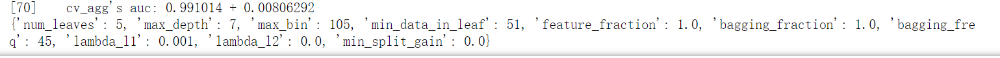

**后续可以做的事：**                              
本章在最后介绍LightGBM的时候并没有详细介绍它的原理以及它与XGBoost的不一样的地方，希望读者好好看看别的文章分享，总结LigntGBM与XGBoost的不同，然后使用一个具体的案例体现两者的不同。